In [1]:
#import modules
import xarray as xr
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
import netCDF4 as nc
import cartopy.crs as ccrs
import cartopy.util as cutil
import warnings
from matplotlib.figure import Axes
from matplotlib.figure import Figure
import xesmf as xe
# import cmcrameri
# from cmcrameri import cm
# www.fabiocrameri.ch/colourmaps/

In [280]:
pd.Timestamp.min # year 1677
pd.Timestamp.max # year 2262
# years outside of this range won't work with your original time workaround

Timestamp('2262-04-11 23:47:16.854775807')

In [4]:
#import history files from each case
#non-acclimated
nwbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp126_02.clm2.h0.2015-01-01-00000.nc")
nwbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp585_02.clm2.h0.2015-01-01-00000.nc")
sbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp126_02.clm2.h0.2015-01-01-00000.nc")
sbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp585_02.clm2.h0.2015-01-01-00000.nc")
nwbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_no_anomaly.clm2.h0.2015-01-01-00000.nc")
sbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_no_anomaly.clm2.h0.2015-01-01-00000.nc")

#acclimated
anwbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp126_02_acclimated.clm2.h0.2015-01-01-00000.nc")
anwbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp585_02_acclimated.clm2.h0.2015-01-01-00000.nc")
asbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp126_02_acclimated.clm2.h0.2015-01-01-00000.nc")
asbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp585_02_acclimated.clm2.h0.2015-01-01-00000.nc")
anwbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_no_anomaly_acclimated.clm2.h0.2015-01-01-00000.nc")
asbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_no_anomaly_acclimated.clm2.h0.2015-01-01-00000.nc")

#partially-acclimated
pnwbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp126_02_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")
pnwbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_ssp585_02_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")
psbrazil_ssp126 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp126_02_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")
psbrazil_ssp585 = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_ssp585_02_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")
pnwbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_no_anomaly_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")
psbrazil_none = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_no_anomaly_acclimated_ryan.clm2.h0.2015-01-01-00000.nc")

#historical-spinup
hnwbrazil = xr.open_dataset("/glade/work/juliacam/earthshot/output/NWBrazil_historical_spinup.clm2.h0.1901-2301.nc")
hsbrazil = xr.open_dataset("/glade/work/juliacam/earthshot/output/SBrazil_historical_spinup.clm2.h0.1901-2301.nc")

/glade/u/home/juliacam/.local/lib/python3.9/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'gini' loading failed:
name 'basic' is not defined
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


In [15]:
hsbrazil

<xarray.Dataset>
Dimensions:                           (levgrnd: 25, levsoi: 20, levlak: 10,
                                       levdcmp: 25, fates_levscls: 13,
                                       fates_levscag: 91, fates_levscpf: 117,
                                       fates_levcacls: 2, fates_levcapf: 18,
                                       fates_levage: 7, fates_levheight: 6,
                                       fates_levpft: 9, fates_levfuel: 6,
                                       ...
                                       fates_levagepft: 63,
                                       fates_levagefuel: 42, fates_levcdsc: 26,
                                       fates_levcdpf: 234, fates_levcdam: 2,
                                       time: 401, hist_interval: 2, lndgrid: 1,
                                       fates_levelcwd: 4, fates_levelem: 1,
                                       glc_nec: 10, ltype: 9)
Coordinates: (12/15)
  * levgrnd                           (levgrnd) float32 0.01 0.04 ... 28.87 42.0
  * levsoi                            (levsoi) float32 0.01 0.04 ... 6.94 8.03
  * levlak                            (levlak) float32 0.05 0.6 ... 34.33 44.78
  * levdcmp                           (levdcmp) float32 0.01 0.04 ... 28.87 42.0
  * fates_levscls                     (fates_levscls) float32 0.0 5.0 ... 100.0
  * fates_levcacls                    (fates_levcacls) float32 0.0 5.0
    ...                                ...
  * fates_levfuel                     (fates_levfuel) int32 1 2 3 4 5 6
  * fates_levcwdsc                    (fates_levcwdsc) int32 1 2 3 4
  * fates_levcan                      (fates_levcan) int32 1 2
  * fates_levleaf                     (fates_levleaf) int32 1 2 3 4 ... 28 29 30
  * fates_levcdam                     (fates_levcdam) float32 0.0 80.0
  * time                              (time) object 1901-01-01 00:00:00 ... 2...
Dimensions without coordinates: fates_levscag, fates_levscpf, fates_levcapf,
                                fates_levcnlf, fates_levcnlfpf,
                                fates_levscagpf, fates_levagepft,
                                fates_levagefuel, fates_levcdsc, fates_levcdpf,
                                hist_interval, lndgrid, fates_levelcwd,
                                fates_levelem, glc_nec, ltype
Data variables: (12/559)
    fates_scmap_levscag               (fates_levscag) int32 ...
    fates_agmap_levscag               (fates_levscag) int32 ...
    fates_pftmap_levscpf              (fates_levscpf) int32 ...
    fates_scmap_levscpf               (fates_levscpf) int32 ...
    fates_pftmap_levcapf              (fates_levcapf) int32 ...
    fates_camap_levcapf               (fates_levcapf) int32 ...
    ...                                ...
    SOM_ACT_C_vr                      (time, levsoi, lndgrid) float32 ...
    SOM_PAS_C_vr                      (time, levsoi, lndgrid) float32 ...
    SOM_SLO_C_vr                      (time, levsoi, lndgrid) float32 ...
    T_SCALAR                          (time, levsoi, lndgrid) float32 ...
    W_SCALAR                          (time, levsoi, lndgrid) float32 ...
    PCT_LANDUNIT                      (time, ltype, lndgrid) float32 ...
Attributes: (12/36)
    title:                                CLM History file information
    comment:                              NOTE: None of the variables are wei...
    Conventions:                          CF-1.0
    history:                              Thu Jul 25 07:10:26 2024: ncrcat SB...
    source:                               Community Terrestrial Systems Model
    hostname:                             derecho
    ...                                   ...
    ctype_urban_sunwall:                  72
    ctype_urban_shadewall:                73
    ctype_urban_impervious_road:          74
    ctype_urban_pervious_road:            75
    time_period_freq:                     day_365
    NCO:                                  netCDF Operators

In [276]:
#will use this as x axis instead when year is greater than 2262
time = np.arange(2235,2271)
time

array([2235, 2236, 2237, 2238, 2239, 2240, 2241, 2242, 2243, 2244, 2245,
       2246, 2247, 2248, 2249, 2250, 2251, 2252, 2253, 2254, 2255, 2256,
       2257, 2258, 2259, 2260, 2261, 2262, 2263, 2264, 2265, 2266, 2267,
       2268, 2269, 2270])

In [5]:
#fix the time issue (won't work outside of year 2262)
nwbrazil126time = nwbrazil_ssp126.indexes['time'].to_datetimeindex()
nwbrazil585time = nwbrazil_ssp585.indexes['time'].to_datetimeindex()
sbrazil126time = sbrazil_ssp126.indexes['time'].to_datetimeindex()
sbrazil585time = sbrazil_ssp585.indexes['time'].to_datetimeindex()
nwbrazilnonetime = nwbrazil_none.indexes['time'].to_datetimeindex()
sbrazilnonetime = sbrazil_none.indexes['time'].to_datetimeindex()

/glade/derecho/scratch/juliacam/tmp/ipykernel_49663/2816660940.py:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  nwbrazil126time = nwbrazil_ssp126.indexes['time'].to_datetimeindex()
/glade/derecho/scratch/juliacam/tmp/ipykernel_49663/2816660940.py:3: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  nwbrazil585time = nwbrazil_ssp585.indexes['time'].to_datetimeindex()
/glade/derecho/scratch/juliacam/tmp/ipykernel_49663/2816660940.py:4: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dat

In [6]:
hstemp = hsbrazil.TBOT.mean(dim='lndgrid') - 273.15
hnwtemp = hnwbrazil.TBOT.mean(dim='lndgrid') - 273.15

In [7]:
#converting to celsius
nwbrazil_ssp126_temp = nwbrazil_ssp126.TBOT - 273.15
nwbrazil_ssp585_temp = nwbrazil_ssp585.TBOT - 273.15
sbrazil_ssp126_temp = sbrazil_ssp126.TBOT - 273.15
sbrazil_ssp585_temp = sbrazil_ssp585.TBOT - 273.15
nwbrazil_none_temp = nwbrazil_none.TBOT - 273.15
sbrazil_none_temp = sbrazil_none.TBOT - 273.15

anwbrazil_ssp126_temp = anwbrazil_ssp126.TBOT - 273.15
anwbrazil_ssp585_temp = anwbrazil_ssp585.TBOT - 273.15
asbrazil_ssp126_temp = asbrazil_ssp126.TBOT - 273.15
asbrazil_ssp585_temp = asbrazil_ssp585.TBOT - 273.15
anwbrazil_none_temp = anwbrazil_none.TBOT - 273.15
asbrazil_none_temp = asbrazil_none.TBOT - 273.15

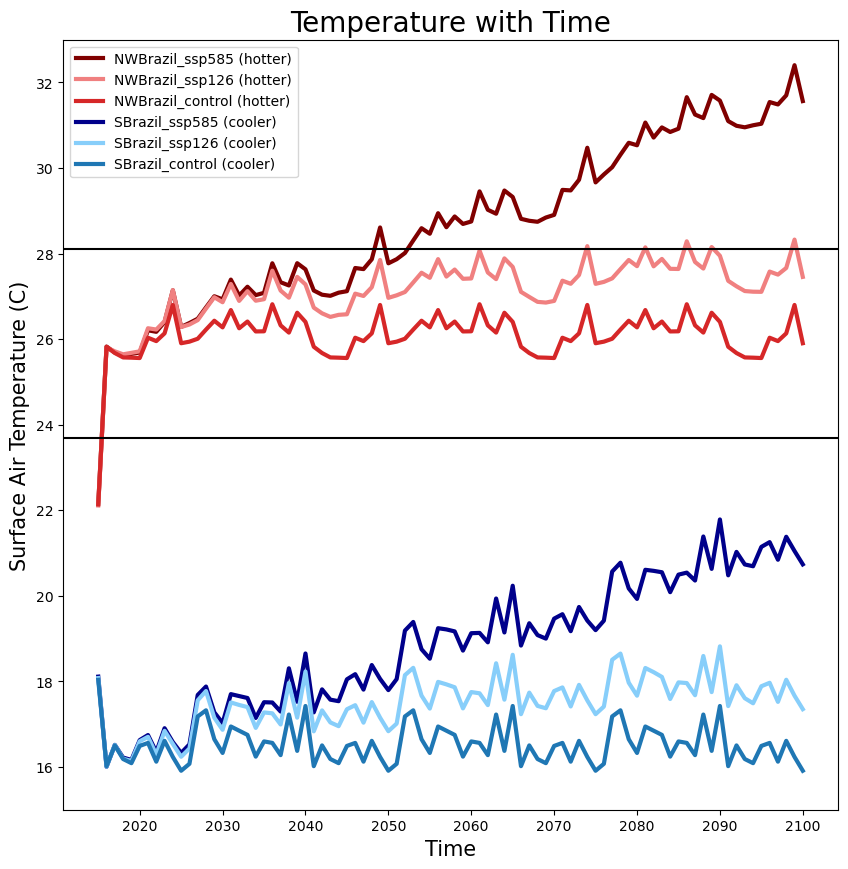

In [8]:
#plotting temperature with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585_temp, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126_temp, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none_temp, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585_temp, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126_temp, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none_temp, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.axhline(y=23.7, color='black')
plt.axhline(y=28.1, color='black')
plt.ylim(15,33)
ax.set_ylabel("Surface Air Temperature (C)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Temperature with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Temp_Time_line.png", dpi=300, bbox_inches='tight')

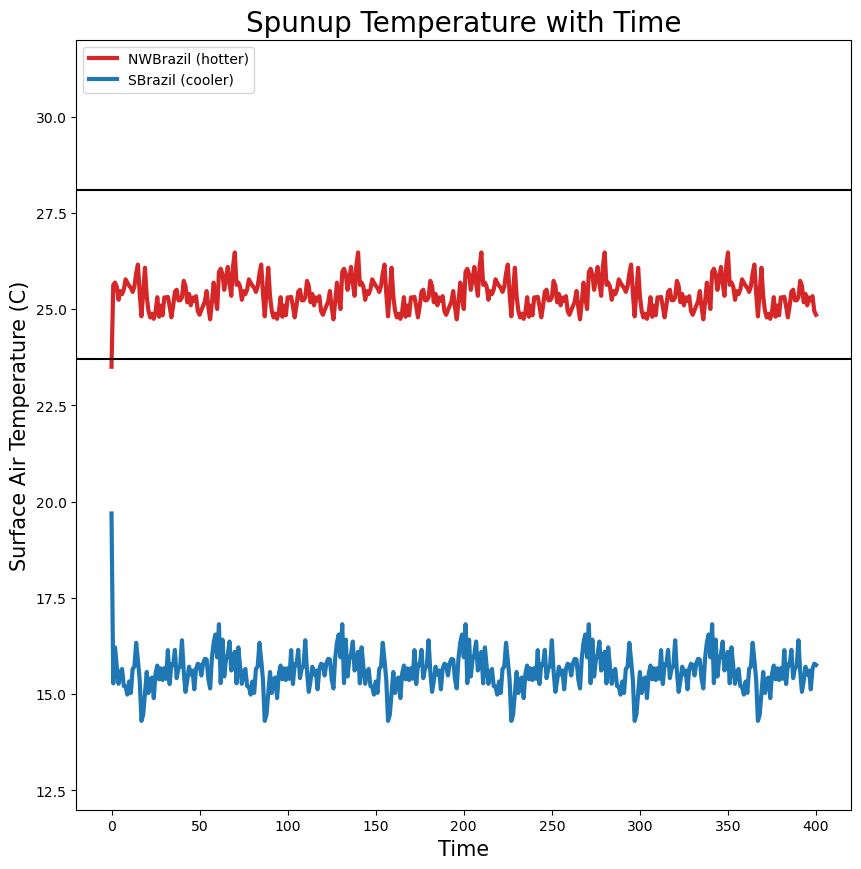

In [51]:
#plotting temperature with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(hnwtemp, label="NWBrazil (hotter)", color='tab:red', linewidth=3)
plt.plot(hstemp, label="SBrazil (cooler)", color='tab:blue', linewidth=3)
plt.axhline(y=23.7, color='black')
plt.axhline(y=28.1, color='black')
plt.ylim(12,32)
ax.set_ylabel("Surface Air Temperature (C)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Spunup Temperature with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_H_Temp.png", dpi=300, bbox_inches='tight')

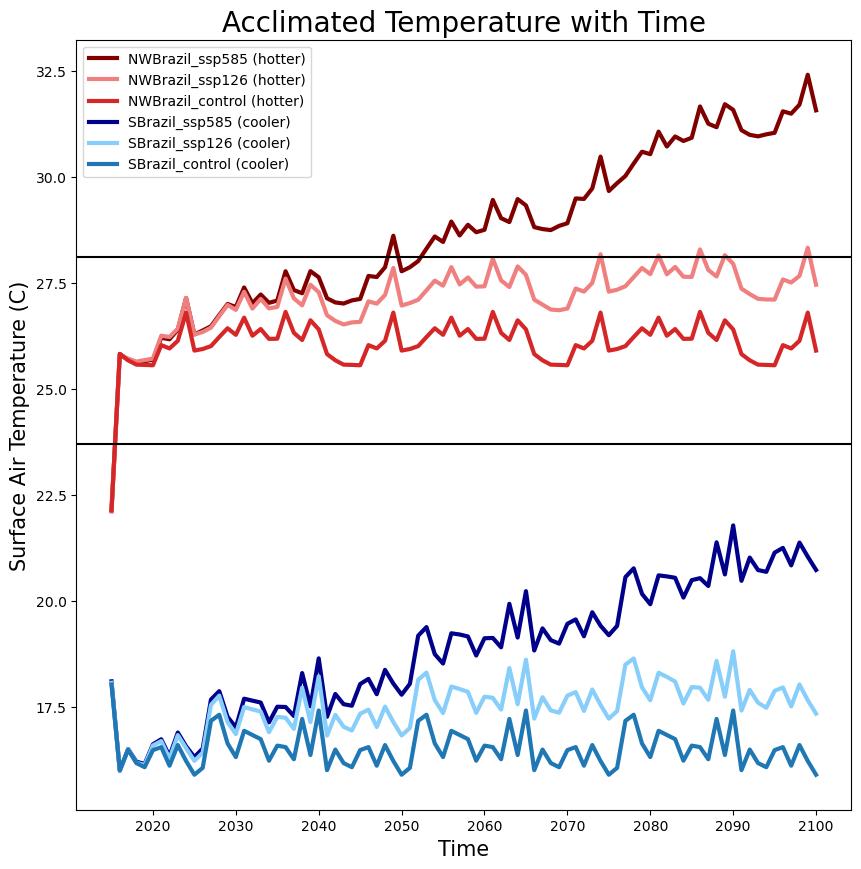

In [571]:
#plotting temperature with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, anwbrazil_ssp585_temp, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, anwbrazil_ssp126_temp, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, anwbrazil_none_temp, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, asbrazil_ssp585_temp, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, asbrazil_ssp126_temp, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, asbrazil_none_temp, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.axhline(y=23.7, color='black')
plt.axhline(y=28.1, color='black')
#plt.ylim(15,33)
ax.set_ylabel("Surface Air Temperature (C)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Acclimated Temperature with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_ATemp_Time_line.png", dpi=300, bbox_inches='tight')

In [572]:
#converting to mm/day
nwbrazil_ssp126_rain = nwbrazil_ssp126.RAIN * 86400
nwbrazil_ssp585_rain = nwbrazil_ssp585.RAIN * 86400
sbrazil_ssp126_rain = sbrazil_ssp126.RAIN * 86400
sbrazil_ssp585_rain = sbrazil_ssp585.RAIN * 86400
sbrazil_none_rain = sbrazil_none.RAIN * 86400
nwbrazil_none_rain = nwbrazil_none.RAIN * 86400

anwbrazil_ssp126_rain = anwbrazil_ssp126.RAIN * 86400
anwbrazil_ssp585_rain = anwbrazil_ssp585.RAIN * 86400
asbrazil_ssp126_rain = asbrazil_ssp126.RAIN * 86400
asbrazil_ssp585_rain = asbrazil_ssp585.RAIN * 86400
asbrazil_none_rain = asbrazil_none.RAIN * 86400
anwbrazil_none_rain = anwbrazil_none.RAIN * 86400

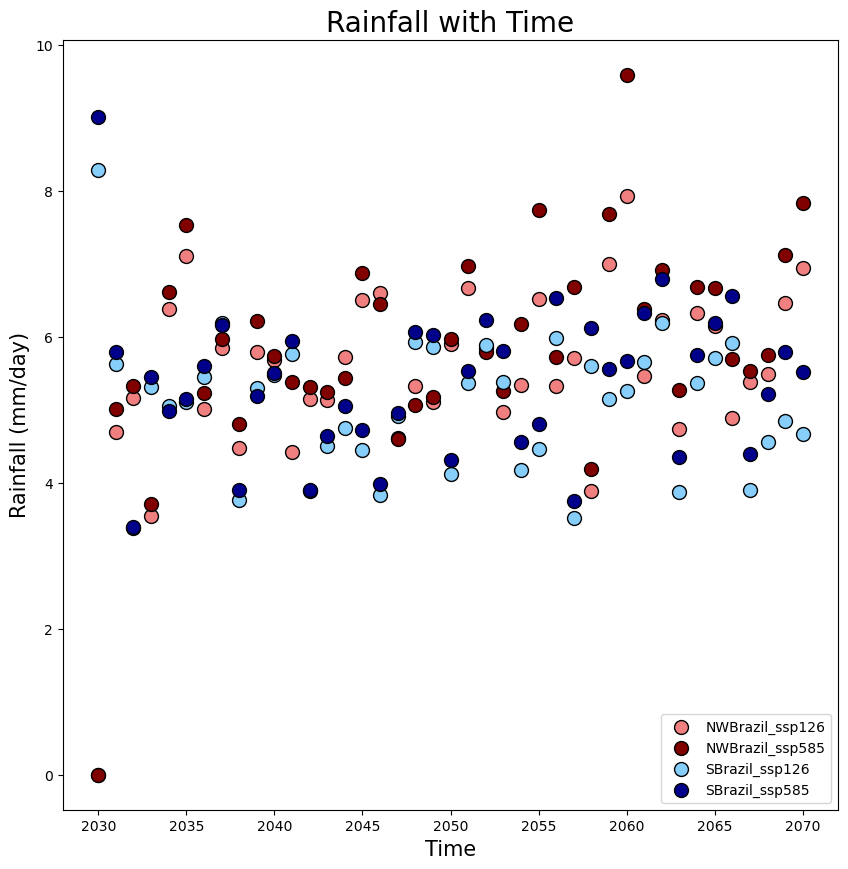

In [38]:
#plotting rain with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.scatter(nwbrazil126time, nwbrazil_ssp126_rain, label="NWBrazil_ssp126", color='lightcoral', edgecolors='black',  s=100, linewidth=1)
plt.scatter(nwbrazil585time, nwbrazil_ssp585_rain, label="NWBrazil_ssp585", color='maroon', edgecolors='black',  s=100, linewidth=1)
plt.scatter(sbrazil126time, sbrazil_ssp126_rain, label="SBrazil_ssp126", color='lightskyblue', edgecolors='black',  s=100, linewidth=1)
plt.scatter(sbrazil585time, sbrazil_ssp585_rain, label="SBrazil_ssp585", color='darkblue', edgecolors='black',  s=100, linewidth=1)
ax.set_ylabel("Rainfall (mm/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Rainfall with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_Rain_Time_scatter.png", dpi=300, bbox_inches='tight')

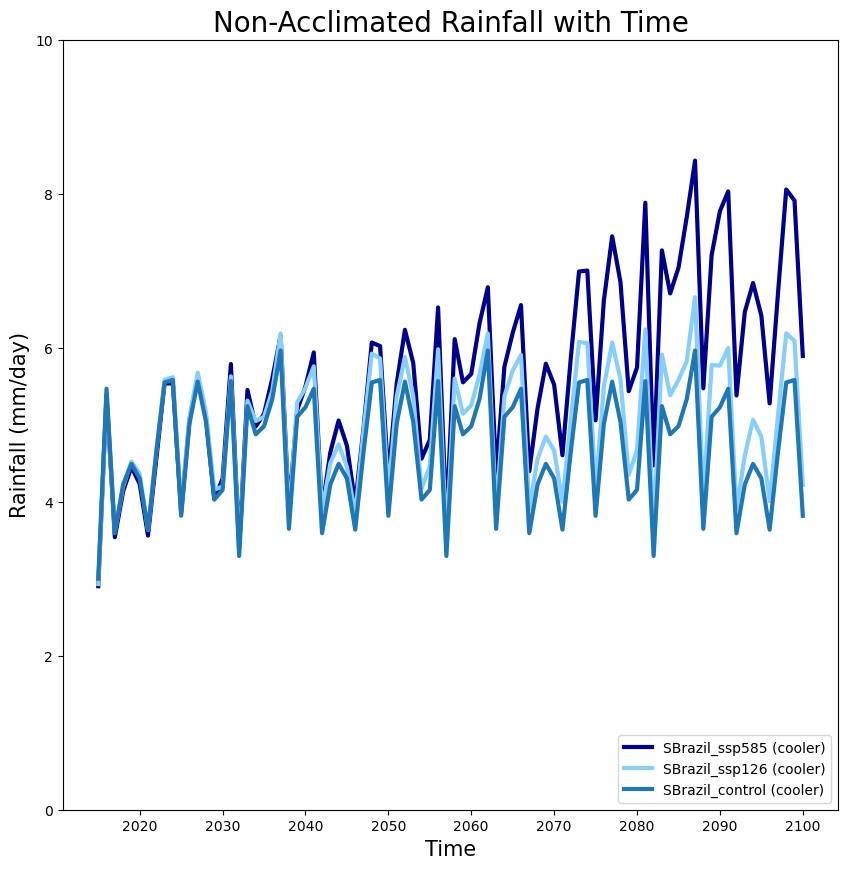

In [551]:
#plotting rain with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
#plt.plot(nwbrazil585time, nwbrazil_ssp585_rain, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
#plt.plot(nwbrazil126time, nwbrazil_ssp126_rain, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
#plt.plot(nwbrazilnonetime, nwbrazil_none_rain, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585_rain, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126_rain, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none_rain, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,10)
ax.set_ylabel("Rainfall (mm/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Rainfall with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_Rain_Time_line.png", dpi=300, bbox_inches='tight')

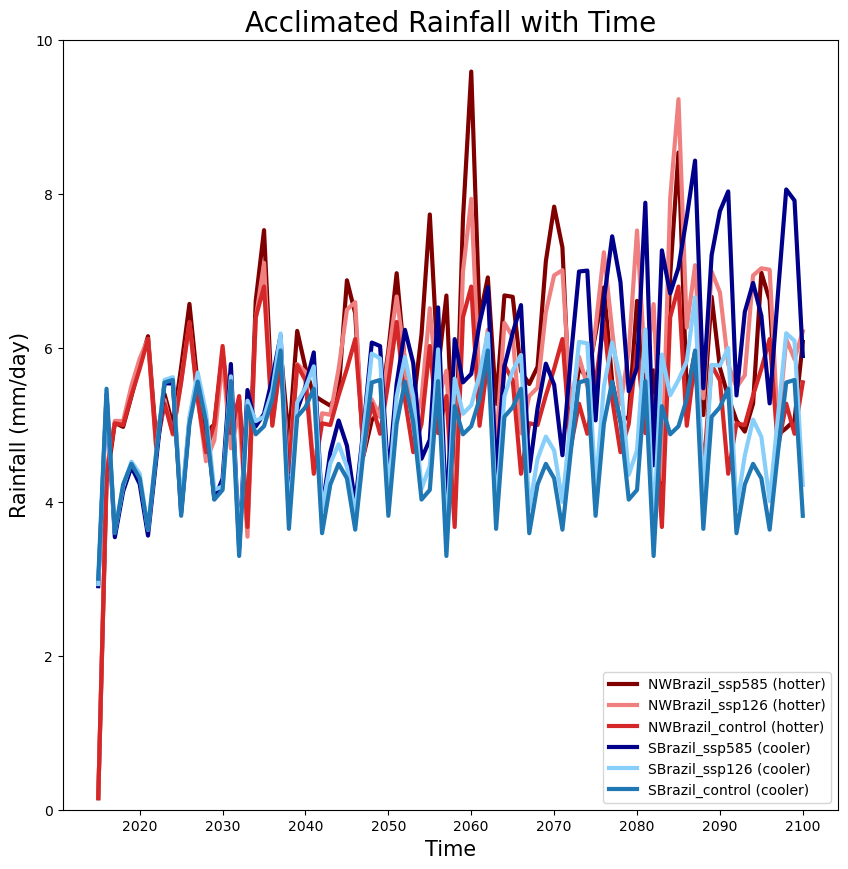

In [573]:
#plotting rain with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, anwbrazil_ssp585_rain, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, anwbrazil_ssp126_rain, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, anwbrazil_none_rain, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, asbrazil_ssp585_rain, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, asbrazil_ssp126_rain, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, asbrazil_none_rain, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,10)
ax.set_ylabel("Rainfall (mm/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Acclimated Rainfall with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_ARain_Time_line.png", dpi=300, bbox_inches='tight')

In [52]:
hsrain = (hsbrazil.RAIN*86400).mean(dim='lndgrid')
hnwrain = (hnwbrazil.RAIN*86400).mean(dim='lndgrid')

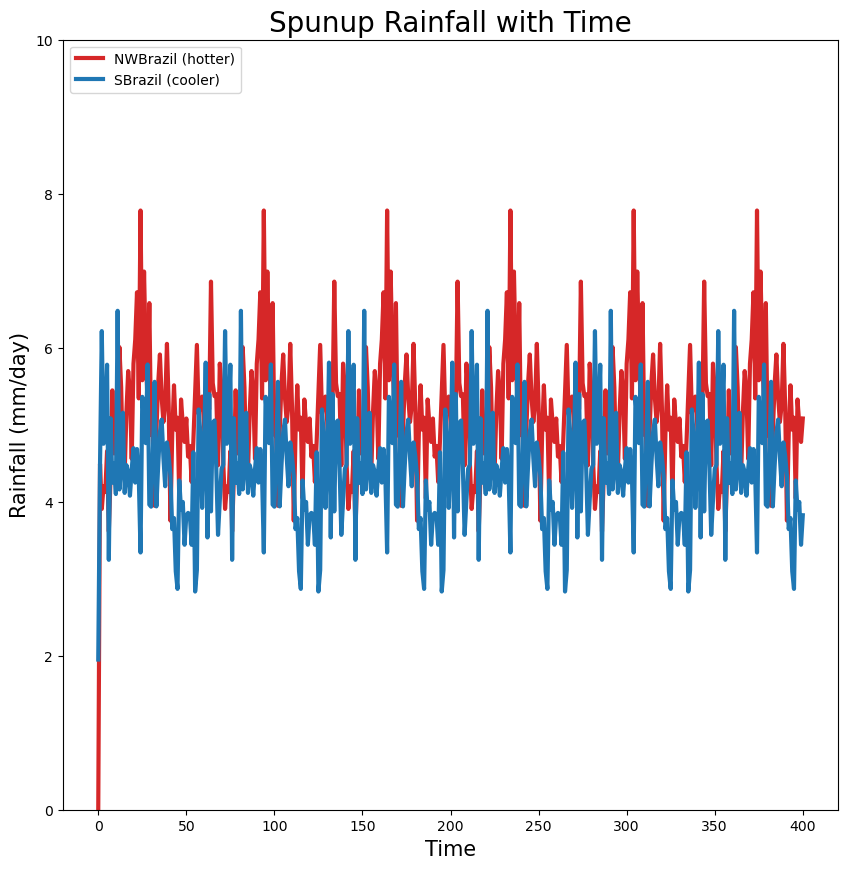

In [54]:
#plotting rain with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(hnwrain, label="NWBrazil (hotter)", color='tab:red', linewidth=3)
plt.plot(hsrain, label="SBrazil (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,10)
ax.set_ylabel("Rainfall (mm/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Spunup Rainfall with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_H_Rain.png", dpi=300, bbox_inches='tight')

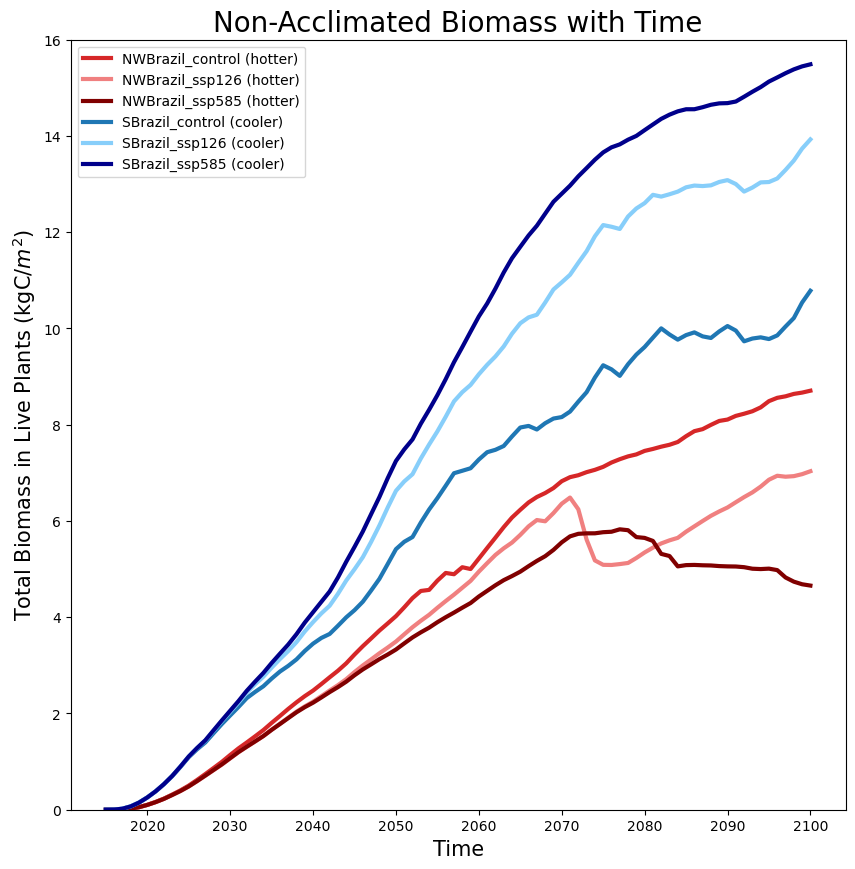

In [4]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, anwbrazil_none.FATES_VEGC, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, anwbrazil_ssp126.FATES_VEGC, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, anwbrazil_ssp585.FATES_VEGC, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, asbrazil_none.FATES_VEGC, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, asbrazil_ssp126.FATES_VEGC, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, asbrazil_ssp585.FATES_VEGC, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,16)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Acclimated Biomass with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_ABiomass_Time_line.png", dpi=300, bbox_inches='tight')

In [57]:
hsveg = hsbrazil.FATES_VEGC.mean(dim='lndgrid')
hnwveg = hnwbrazil.FATES_VEGC.mean(dim='lndgrid')

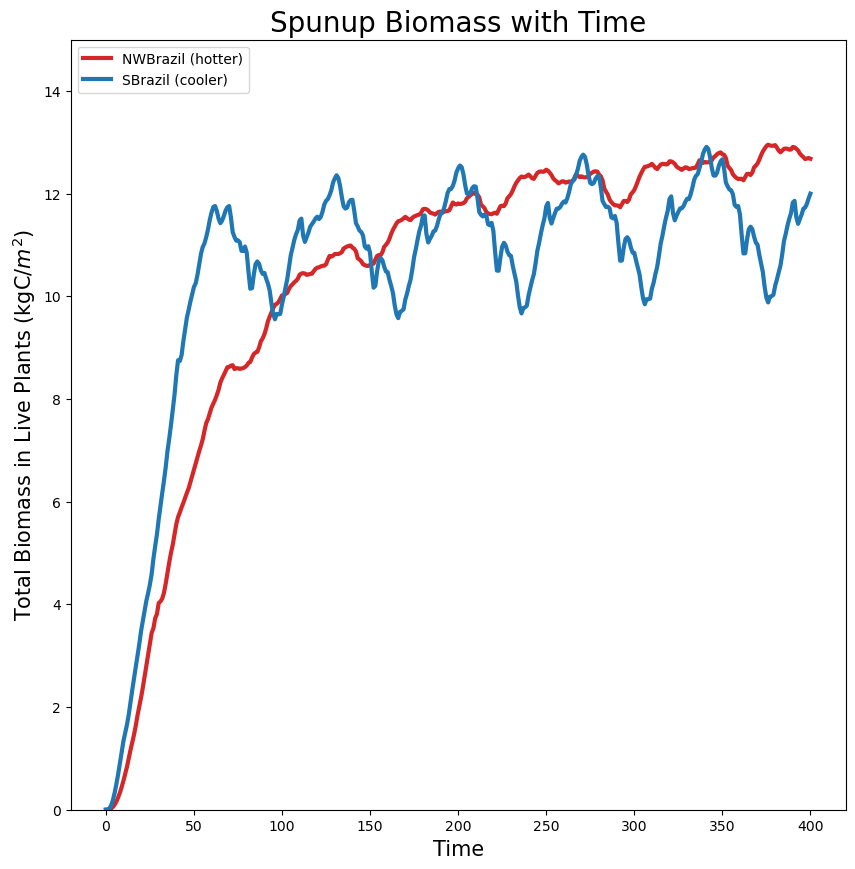

In [59]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(hnwveg, label="NWBrazil (hotter)", color='tab:red', linewidth=3)
plt.plot(hsveg, label="SBrazil (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,15)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Spunup Biomass with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_H_biomass.png", dpi=300, bbox_inches='tight')

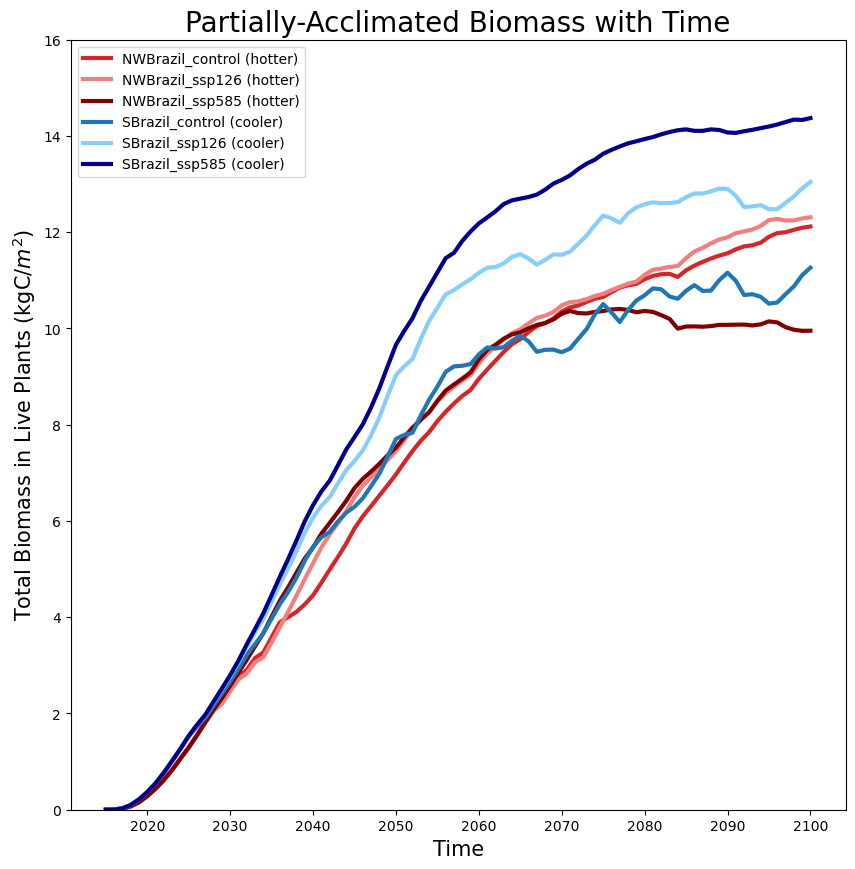

In [8]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_VEGC, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_VEGC, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_VEGC, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_VEGC, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_VEGC, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_VEGC, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,16)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Biomass with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PBiomass_Time_line.png", dpi=300, bbox_inches='tight')

In [6]:
pft1 = hsbrazil.sel(fates_levpft=slice(1,1))
hspft1 = pft1.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft2 = hsbrazil.sel(fates_levpft=slice(2,2))
hspft2 = pft2.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft3 = hsbrazil.sel(fates_levpft=slice(3,3))
hspft3 = pft3.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft4 = hsbrazil.sel(fates_levpft=slice(4,4))
hspft4 = pft4.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft5 = hsbrazil.sel(fates_levpft=slice(5,5))
hspft5 = pft5.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft6 = hsbrazil.sel(fates_levpft=slice(6,6))
hspft6 = pft6.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft7 = hsbrazil.sel(fates_levpft=slice(7,7))
hspft7 = pft7.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft8 = hsbrazil.sel(fates_levpft=slice(8,8))
hspft8 = pft8.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft9 = hsbrazil.sel(fates_levpft=slice(9,9))
hspft9 = pft9.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])

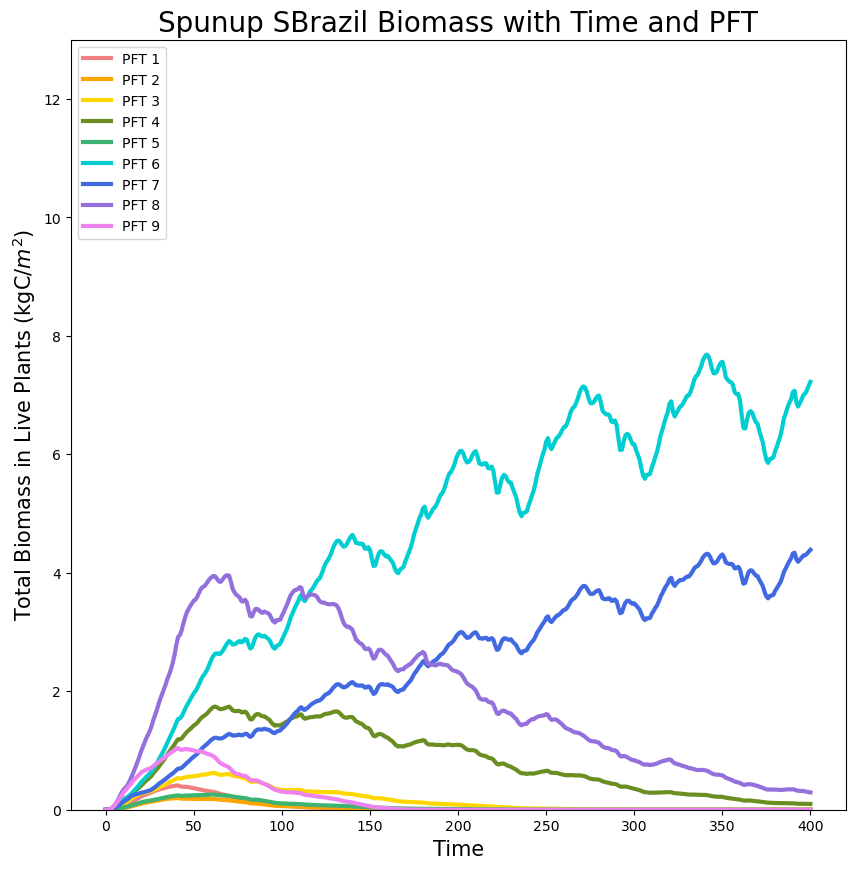

In [11]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(hspft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(hspft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(hspft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(hspft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(hspft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(hspft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(hspft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(hspft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(hspft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,13)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Spunup SBrazil Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_H_SBrazil_biomassPFT.png", dpi=300, bbox_inches='tight')

In [15]:
pft1 = hnwbrazil.sel(fates_levpft=slice(1,1))
hnwpft1 = pft1.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft2 = hnwbrazil.sel(fates_levpft=slice(2,2))
hnwpft2 = pft2.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft3 = hnwbrazil.sel(fates_levpft=slice(3,3))
hnwpft3 = pft3.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft4 = hnwbrazil.sel(fates_levpft=slice(4,4))
hnwpft4 = pft4.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft5 = hnwbrazil.sel(fates_levpft=slice(5,5))
hnwpft5 = pft5.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft6 = hnwbrazil.sel(fates_levpft=slice(6,6))
hnwpft6 = pft6.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft7 = hnwbrazil.sel(fates_levpft=slice(7,7))
hnwpft7 = pft7.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft8 = hnwbrazil.sel(fates_levpft=slice(8,8))
hnwpft8 = pft8.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])
pft9 = hnwbrazil.sel(fates_levpft=slice(9,9))
hnwpft9 = pft9.FATES_VEGC_PF.mean(dim=["fates_levpft","lndgrid"])

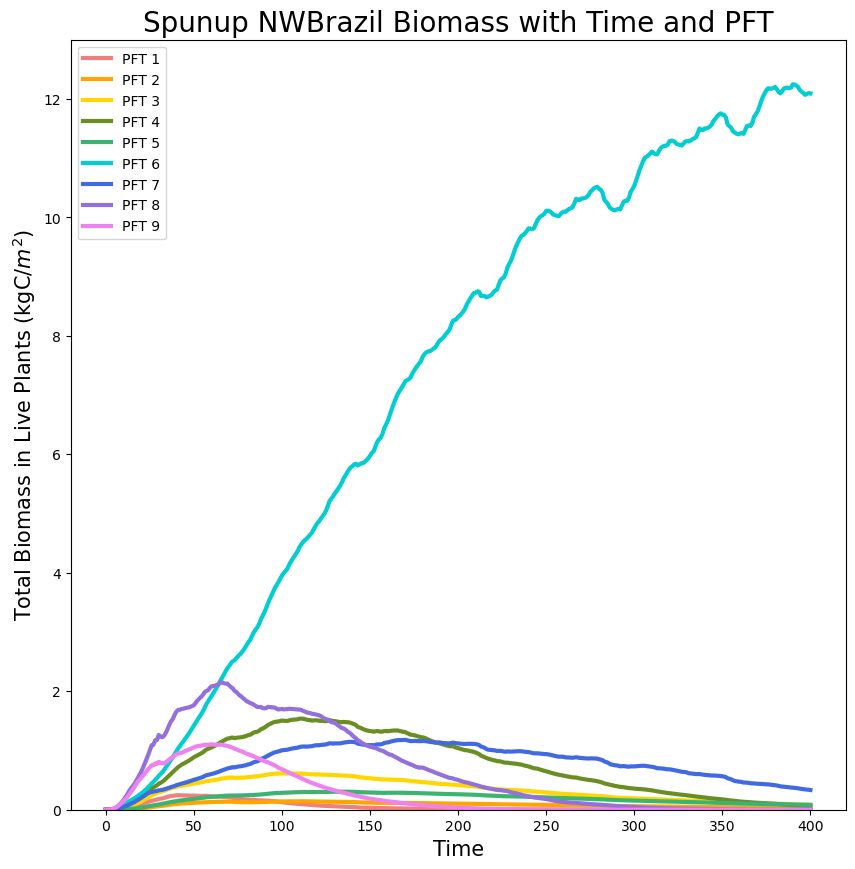

In [17]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(hnwpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(hnwpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(hnwpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(hnwpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(hnwpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(hnwpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(hnwpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(hnwpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(hnwpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,13)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Spunup NWBrazil Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_H_NWBrazil_biomassPFT.png", dpi=300, bbox_inches='tight')

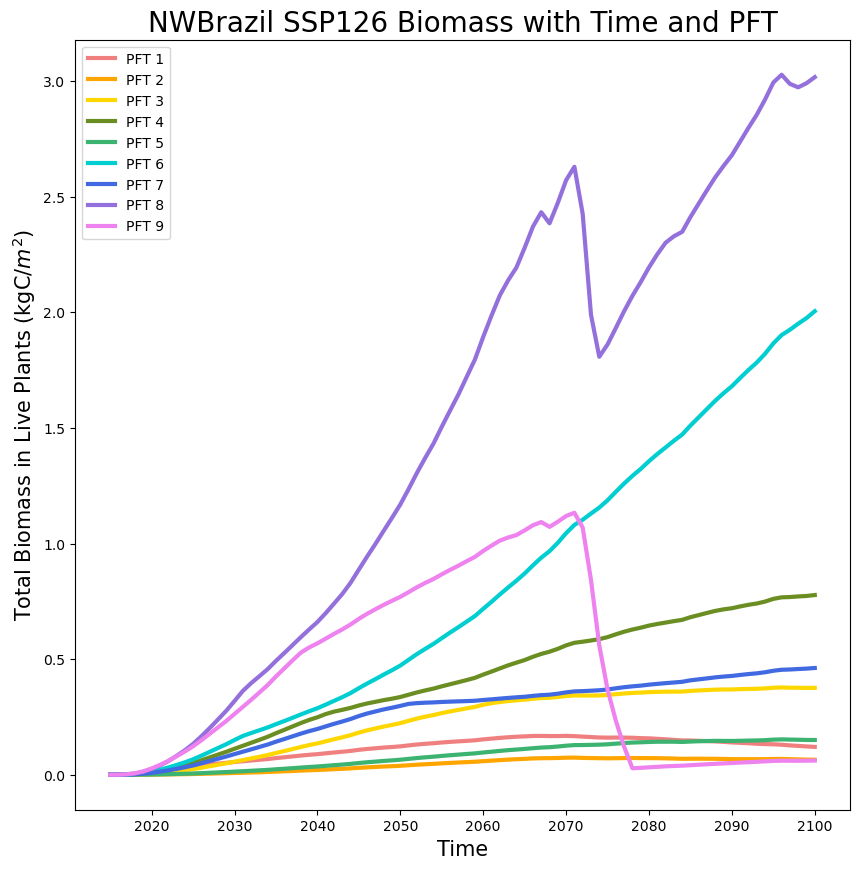

In [311]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levpft=slice(1,1))
nwbrazil126pft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = nwbrazil_ssp126.sel(fates_levpft=slice(2,2))
nwbrazil126pft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = nwbrazil_ssp126.sel(fates_levpft=slice(3,3))
nwbrazil126pft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = nwbrazil_ssp126.sel(fates_levpft=slice(4,4))
nwbrazil126pft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = nwbrazil_ssp126.sel(fates_levpft=slice(5,5))
nwbrazil126pft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = nwbrazil_ssp126.sel(fates_levpft=slice(6,6))
nwbrazil126pft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = nwbrazil_ssp126.sel(fates_levpft=slice(7,7))
nwbrazil126pft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = nwbrazil_ssp126.sel(fates_levpft=slice(8,8))
nwbrazil126pft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = nwbrazil_ssp126.sel(fates_levpft=slice(9,9))
nwbrazil126pft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil126pft9, label="PFT 9", color='violet', linewidth=3)
#plt.ylim(0,1.5)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP126 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

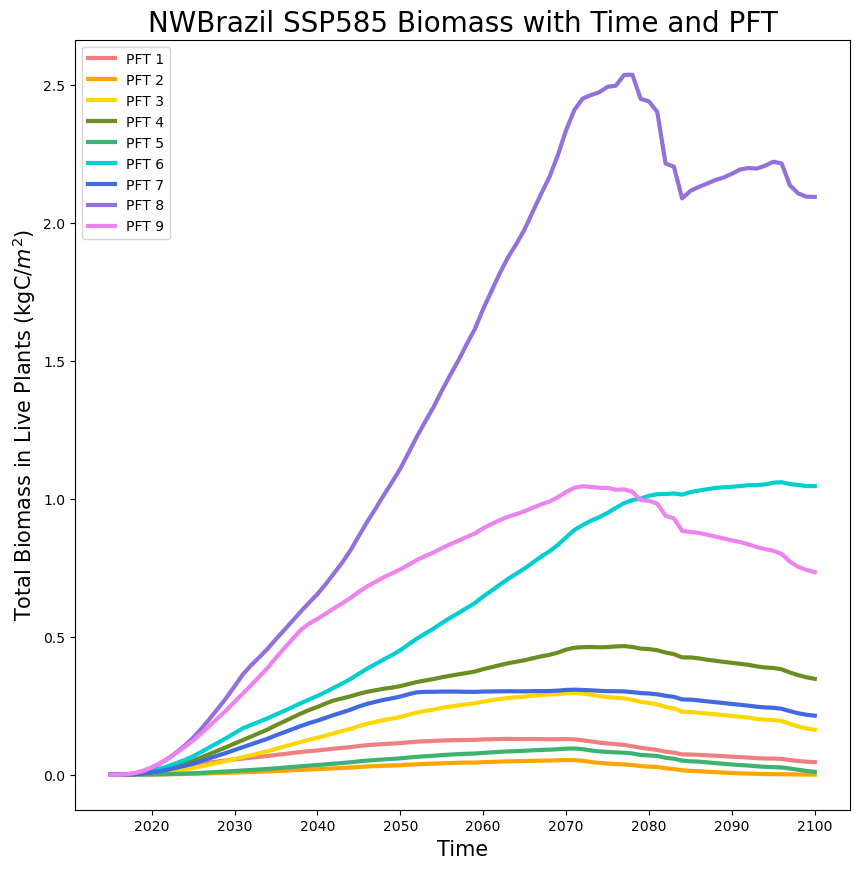

In [312]:
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levpft=slice(1,1))
nwbrazil585pft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = nwbrazil_ssp585.sel(fates_levpft=slice(2,2))
nwbrazil585pft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = nwbrazil_ssp585.sel(fates_levpft=slice(3,3))
nwbrazil585pft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = nwbrazil_ssp585.sel(fates_levpft=slice(4,4))
nwbrazil585pft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = nwbrazil_ssp585.sel(fates_levpft=slice(5,5))
nwbrazil585pft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = nwbrazil_ssp585.sel(fates_levpft=slice(6,6))
nwbrazil585pft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = nwbrazil_ssp585.sel(fates_levpft=slice(7,7))
nwbrazil585pft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = nwbrazil_ssp585.sel(fates_levpft=slice(8,8))
nwbrazil585pft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = nwbrazil_ssp585.sel(fates_levpft=slice(9,9))
nwbrazil585pft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
#plt.ylim(0,1.2)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP585 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp585_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

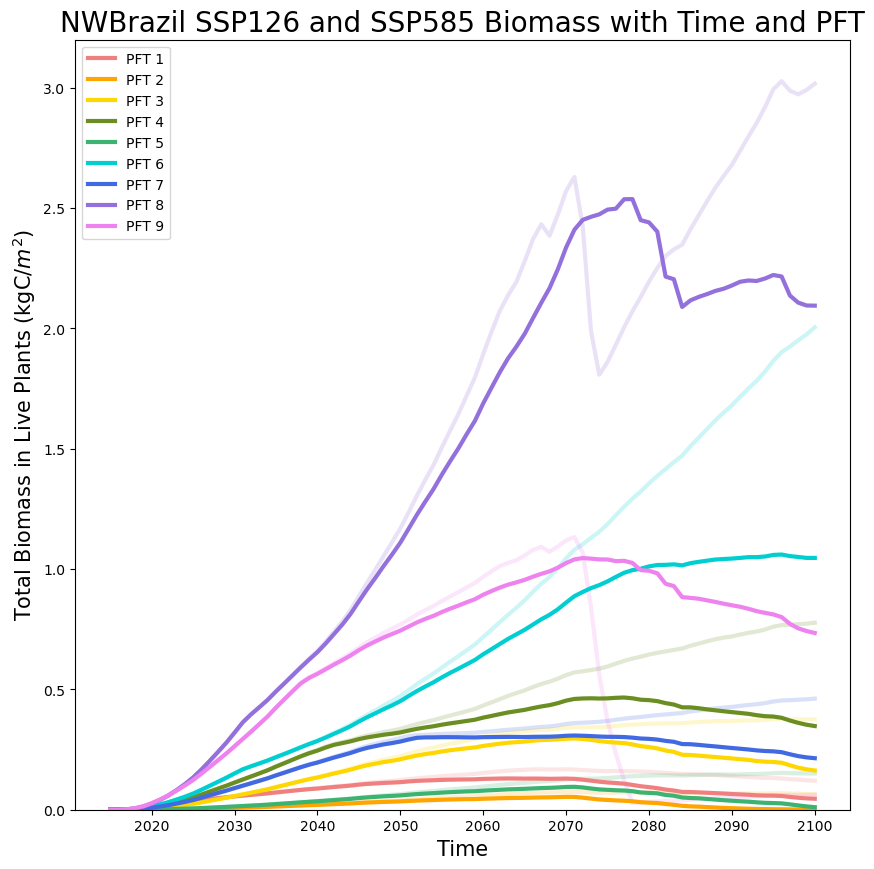

In [316]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,3.2)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP126 and SSP585 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher biomass

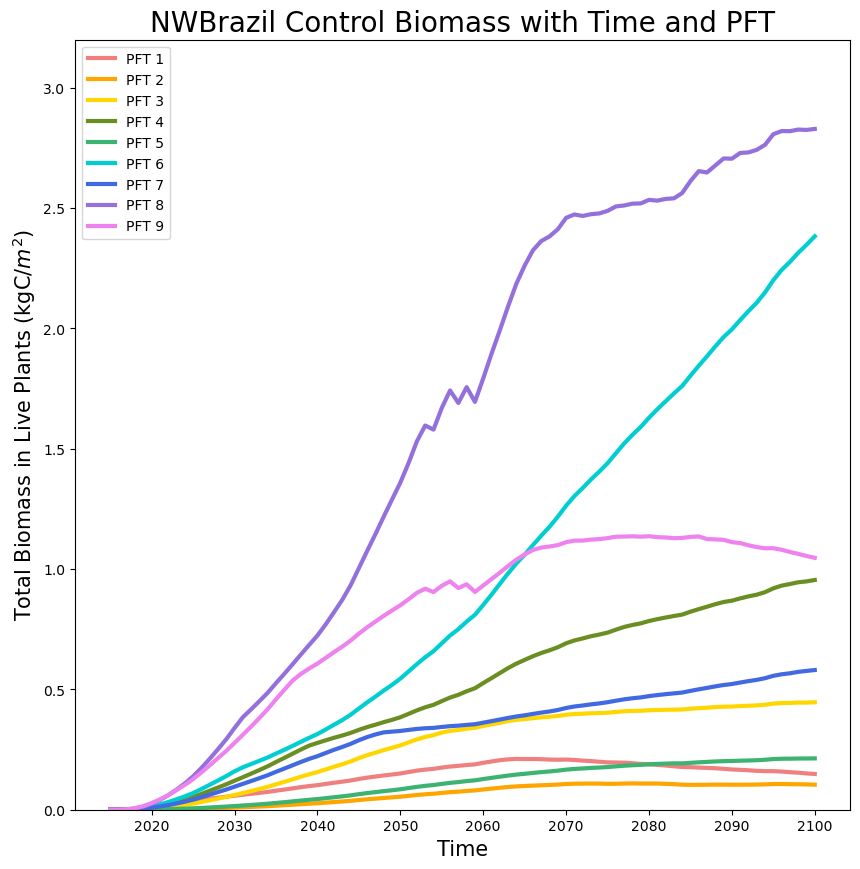

In [319]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levpft=slice(1,1))
nwbrazilpft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = nwbrazil_none.sel(fates_levpft=slice(2,2))
nwbrazilpft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = nwbrazil_none.sel(fates_levpft=slice(3,3))
nwbrazilpft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = nwbrazil_none.sel(fates_levpft=slice(4,4))
nwbrazilpft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = nwbrazil_none.sel(fates_levpft=slice(5,5))
nwbrazilpft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = nwbrazil_none.sel(fates_levpft=slice(6,6))
nwbrazilpft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = nwbrazil_none.sel(fates_levpft=slice(7,7))
nwbrazilpft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = nwbrazil_none.sel(fates_levpft=slice(8,8))
nwbrazilpft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = nwbrazil_none.sel(fates_levpft=slice(9,9))
nwbrazilpft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,3.2)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil Control Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_Control_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

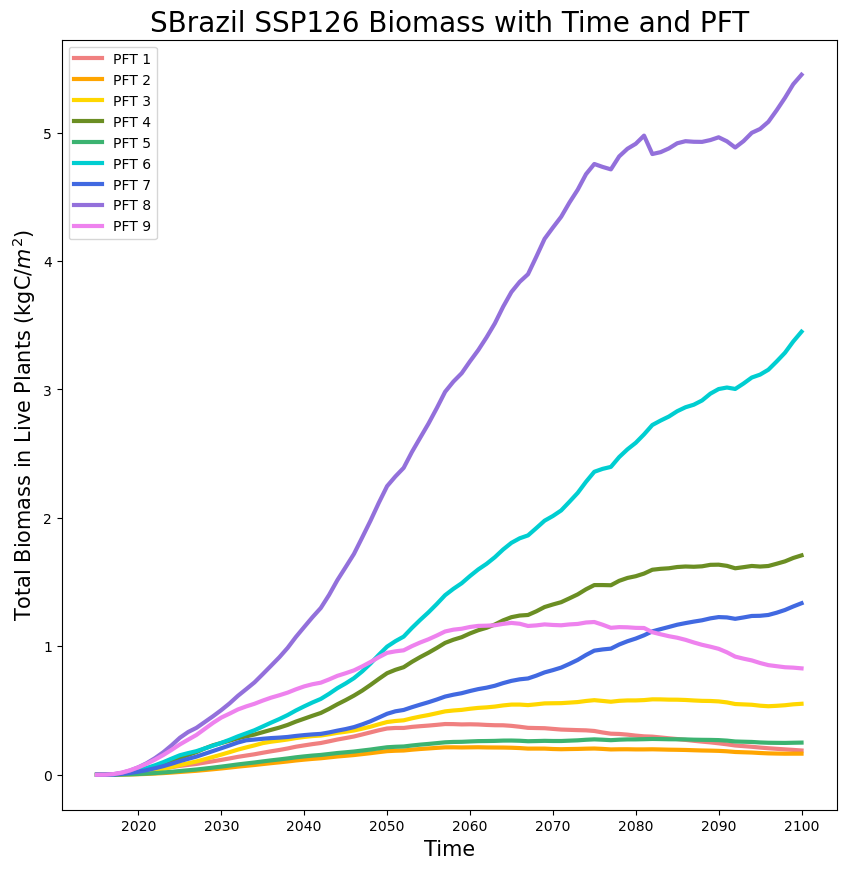

In [355]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levpft=slice(1,1))
sbrazil126pft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = sbrazil_ssp126.sel(fates_levpft=slice(2,2))
sbrazil126pft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = sbrazil_ssp126.sel(fates_levpft=slice(3,3))
sbrazil126pft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = sbrazil_ssp126.sel(fates_levpft=slice(4,4))
sbrazil126pft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = sbrazil_ssp126.sel(fates_levpft=slice(5,5))
sbrazil126pft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = sbrazil_ssp126.sel(fates_levpft=slice(6,6))
sbrazil126pft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = sbrazil_ssp126.sel(fates_levpft=slice(7,7))
sbrazil126pft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = sbrazil_ssp126.sel(fates_levpft=slice(8,8))
sbrazil126pft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = sbrazil_ssp126.sel(fates_levpft=slice(9,9))
sbrazil126pft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil126time, sbrazil126pft9, label="PFT 9", color='violet', linewidth=3)
#plt.ylim(0,3)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP126 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

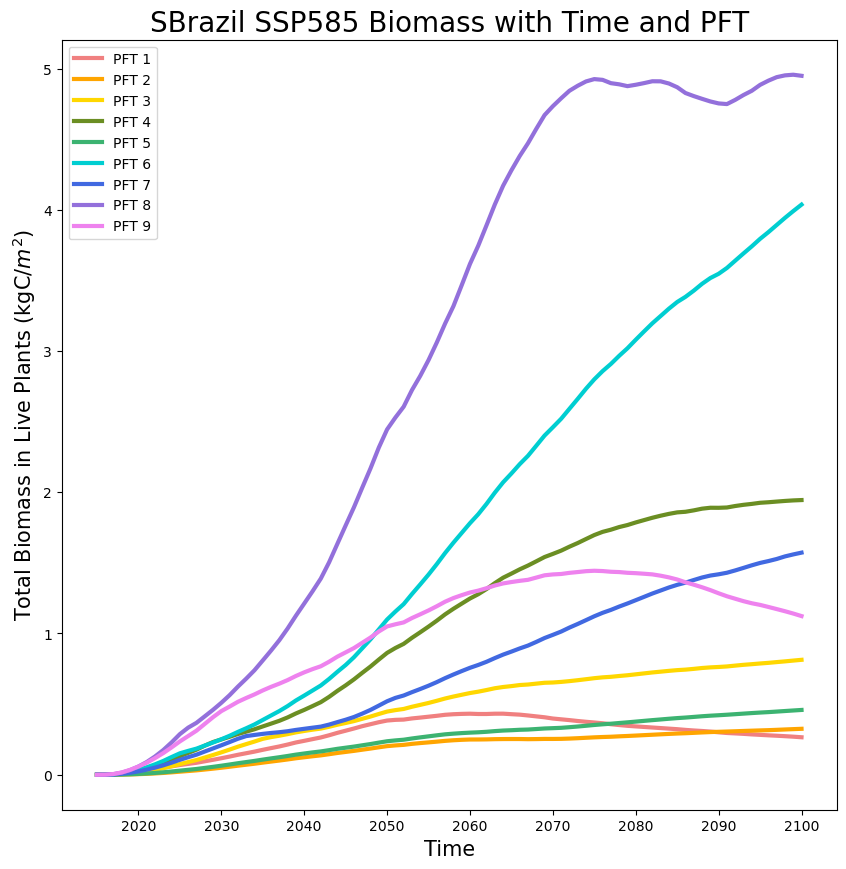

In [356]:
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levpft=slice(1,1))
sbrazil585pft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = sbrazil_ssp585.sel(fates_levpft=slice(2,2))
sbrazil585pft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = sbrazil_ssp585.sel(fates_levpft=slice(3,3))
sbrazil585pft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = sbrazil_ssp585.sel(fates_levpft=slice(4,4))
sbrazil585pft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = sbrazil_ssp585.sel(fates_levpft=slice(5,5))
sbrazil585pft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = sbrazil_ssp585.sel(fates_levpft=slice(6,6))
sbrazil585pft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = sbrazil_ssp585.sel(fates_levpft=slice(7,7))
sbrazil585pft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = sbrazil_ssp585.sel(fates_levpft=slice(8,8))
sbrazil585pft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = sbrazil_ssp585.sel(fates_levpft=slice(9,9))
sbrazil585pft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
#plt.ylim(0,3.2)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP585 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp585_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

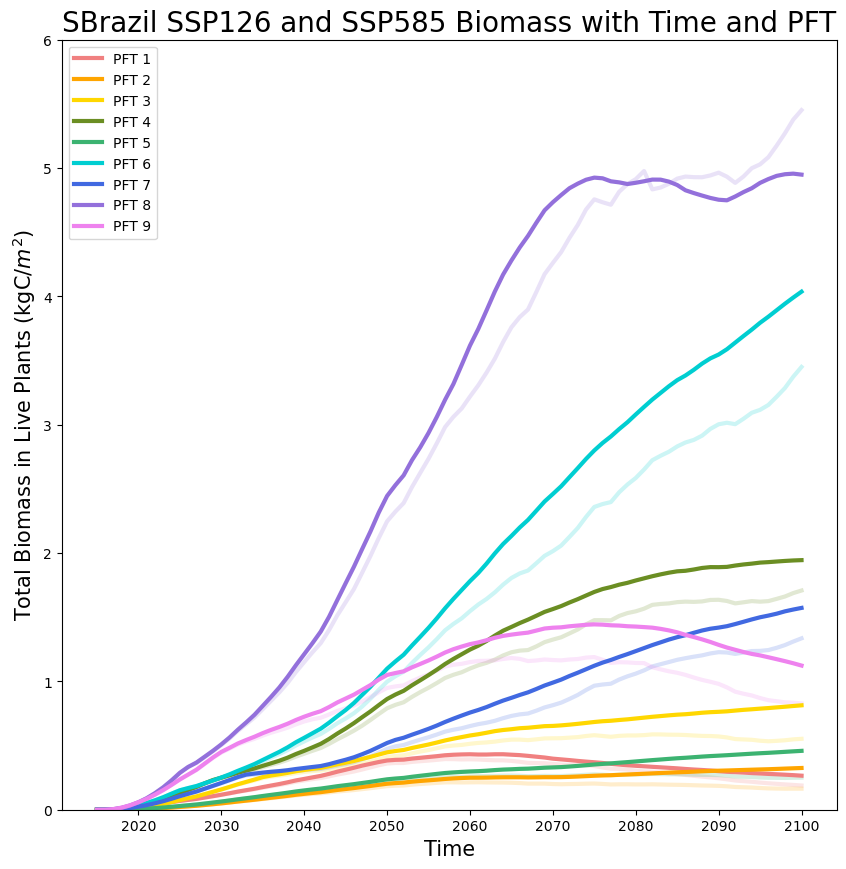

In [357]:
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,6)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP126 and SSP585 Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher biomass

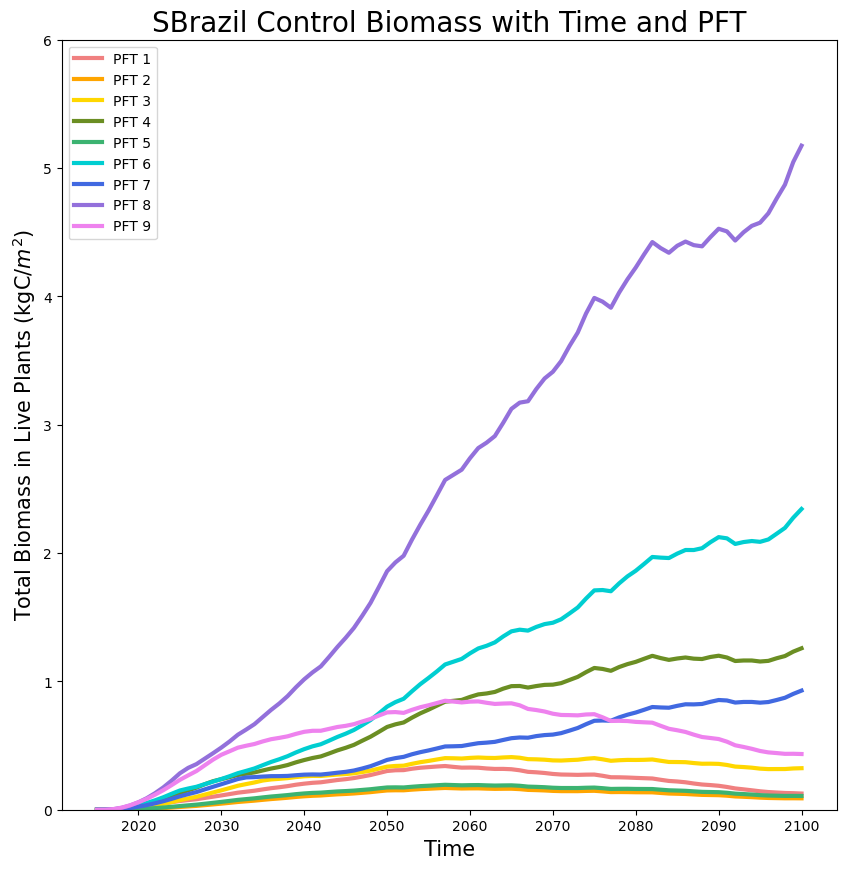

In [326]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levpft=slice(1,1))
sbrazilpft1 = pft1.FATES_VEGC_PF.mean(dim="fates_levpft")
pft2 = sbrazil_none.sel(fates_levpft=slice(2,2))
sbrazilpft2 = pft2.FATES_VEGC_PF.mean(dim="fates_levpft")
pft3 = sbrazil_none.sel(fates_levpft=slice(3,3))
sbrazilpft3 = pft3.FATES_VEGC_PF.mean(dim="fates_levpft")
pft4 = sbrazil_none.sel(fates_levpft=slice(4,4))
sbrazilpft4 = pft4.FATES_VEGC_PF.mean(dim="fates_levpft")
pft5 = sbrazil_none.sel(fates_levpft=slice(5,5))
sbrazilpft5 = pft5.FATES_VEGC_PF.mean(dim="fates_levpft")
pft6 = sbrazil_none.sel(fates_levpft=slice(6,6))
sbrazilpft6 = pft6.FATES_VEGC_PF.mean(dim="fates_levpft")
pft7 = sbrazil_none.sel(fates_levpft=slice(7,7))
sbrazilpft7 = pft7.FATES_VEGC_PF.mean(dim="fates_levpft")
pft8 = sbrazil_none.sel(fates_levpft=slice(8,8))
sbrazilpft8 = pft8.FATES_VEGC_PF.mean(dim="fates_levpft")
pft9 = sbrazil_none.sel(fates_levpft=slice(9,9))
sbrazilpft9 = pft9.FATES_VEGC_PF.mean(dim="fates_levpft")
#plotting biomass with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,6)
ax.set_ylabel("Total Biomass in Live Plants (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil Control Biomass with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_Control_Biomass_Time_PFT.png", dpi=300, bbox_inches='tight')

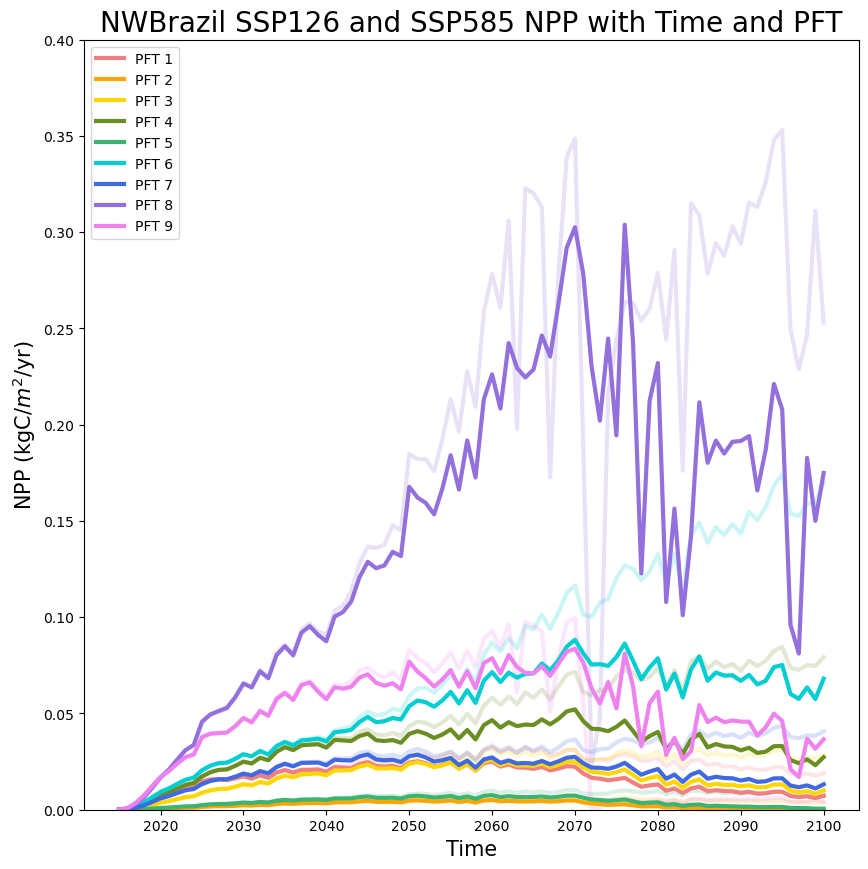

In [330]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levpft=slice(1,1))
nwbrazil126pft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_ssp126.sel(fates_levpft=slice(2,2))
nwbrazil126pft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_ssp126.sel(fates_levpft=slice(3,3))
nwbrazil126pft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_ssp126.sel(fates_levpft=slice(4,4))
nwbrazil126pft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_ssp126.sel(fates_levpft=slice(5,5))
nwbrazil126pft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_ssp126.sel(fates_levpft=slice(6,6))
nwbrazil126pft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_ssp126.sel(fates_levpft=slice(7,7))
nwbrazil126pft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_ssp126.sel(fates_levpft=slice(8,8))
nwbrazil126pft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_ssp126.sel(fates_levpft=slice(9,9))
nwbrazil126pft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levpft=slice(1,1))
nwbrazil585pft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_ssp585.sel(fates_levpft=slice(2,2))
nwbrazil585pft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_ssp585.sel(fates_levpft=slice(3,3))
nwbrazil585pft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_ssp585.sel(fates_levpft=slice(4,4))
nwbrazil585pft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_ssp585.sel(fates_levpft=slice(5,5))
nwbrazil585pft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_ssp585.sel(fates_levpft=slice(6,6))
nwbrazil585pft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_ssp585.sel(fates_levpft=slice(7,7))
nwbrazil585pft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_ssp585.sel(fates_levpft=slice(8,8))
nwbrazil585pft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_ssp585.sel(fates_levpft=slice(9,9))
nwbrazil585pft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting NPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.4)
ax.set_ylabel("NPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP126 and SSP585 NPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_NPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher NPP

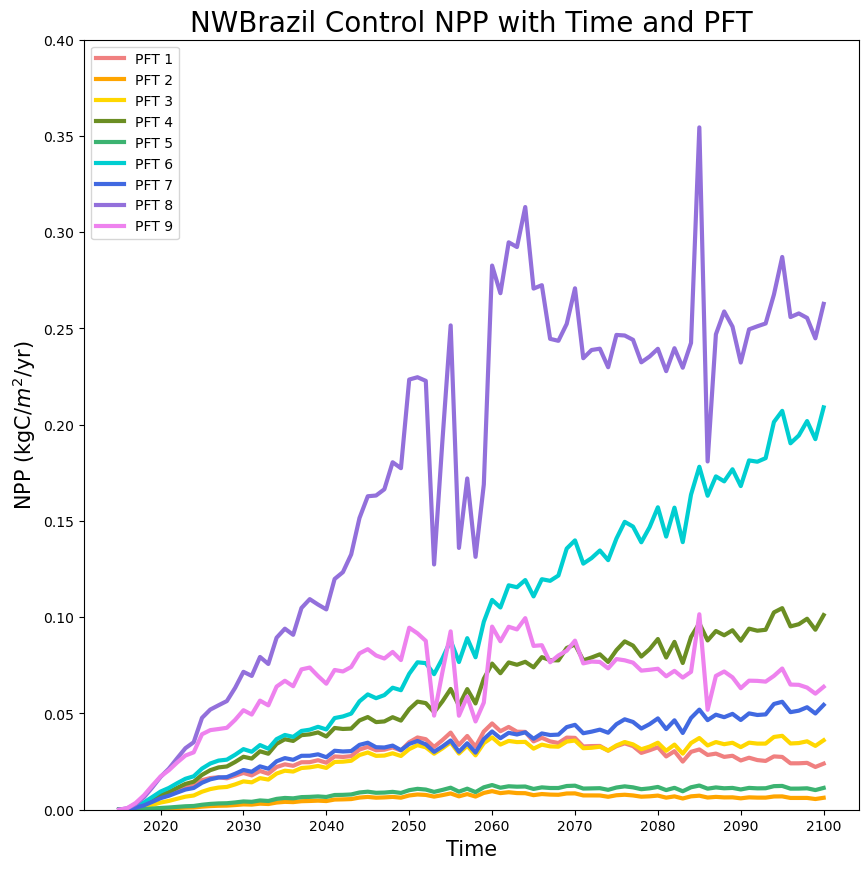

In [331]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levpft=slice(1,1))
nwbrazilpft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_none.sel(fates_levpft=slice(2,2))
nwbrazilpft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_none.sel(fates_levpft=slice(3,3))
nwbrazilpft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_none.sel(fates_levpft=slice(4,4))
nwbrazilpft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_none.sel(fates_levpft=slice(5,5))
nwbrazilpft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_none.sel(fates_levpft=slice(6,6))
nwbrazilpft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_none.sel(fates_levpft=slice(7,7))
nwbrazilpft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_none.sel(fates_levpft=slice(8,8))
nwbrazilpft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_none.sel(fates_levpft=slice(9,9))
nwbrazilpft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting NPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.4)
ax.set_ylabel("NPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil Control NPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_Control_NPP_Time_PFT.png", dpi=300, bbox_inches='tight')

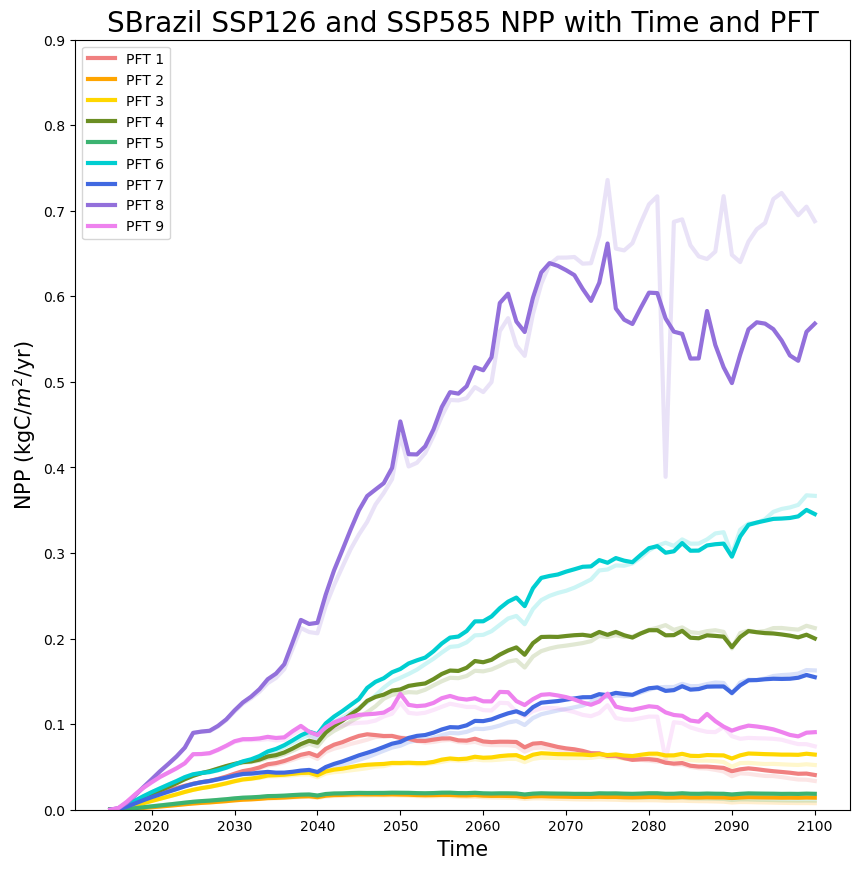

In [338]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levpft=slice(1,1))
sbrazil126pft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_ssp126.sel(fates_levpft=slice(2,2))
sbrazil126pft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_ssp126.sel(fates_levpft=slice(3,3))
sbrazil126pft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_ssp126.sel(fates_levpft=slice(4,4))
sbrazil126pft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_ssp126.sel(fates_levpft=slice(5,5))
sbrazil126pft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_ssp126.sel(fates_levpft=slice(6,6))
sbrazil126pft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_ssp126.sel(fates_levpft=slice(7,7))
sbrazil126pft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_ssp126.sel(fates_levpft=slice(8,8))
sbrazil126pft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_ssp126.sel(fates_levpft=slice(9,9))
sbrazil126pft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levpft=slice(1,1))
sbrazil585pft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_ssp585.sel(fates_levpft=slice(2,2))
sbrazil585pft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_ssp585.sel(fates_levpft=slice(3,3))
sbrazil585pft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_ssp585.sel(fates_levpft=slice(4,4))
sbrazil585pft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_ssp585.sel(fates_levpft=slice(5,5))
sbrazil585pft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_ssp585.sel(fates_levpft=slice(6,6))
sbrazil585pft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_ssp585.sel(fates_levpft=slice(7,7))
sbrazil585pft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_ssp585.sel(fates_levpft=slice(8,8))
sbrazil585pft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_ssp585.sel(fates_levpft=slice(9,9))
sbrazil585pft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting NPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.9)
ax.set_ylabel("NPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP126 and SSP585 NPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_NPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher NPP

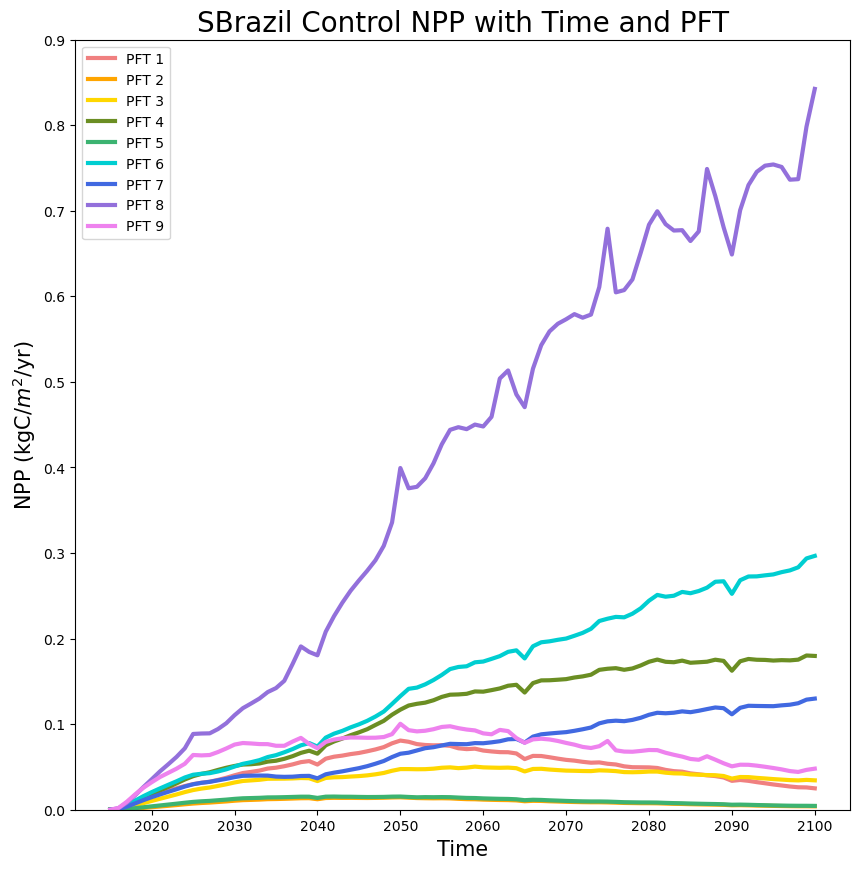

In [337]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levpft=slice(1,1))
sbrazilpft1 = (pft1.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_none.sel(fates_levpft=slice(2,2))
sbrazilpft2 = (pft2.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_none.sel(fates_levpft=slice(3,3))
sbrazilpft3 = (pft3.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_none.sel(fates_levpft=slice(4,4))
sbrazilpft4 = (pft4.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_none.sel(fates_levpft=slice(5,5))
sbrazilpft5 = (pft5.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_none.sel(fates_levpft=slice(6,6))
sbrazilpft6 = (pft6.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_none.sel(fates_levpft=slice(7,7))
sbrazilpft7 = (pft7.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_none.sel(fates_levpft=slice(8,8))
sbrazilpft8 = (pft8.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_none.sel(fates_levpft=slice(9,9))
sbrazilpft9 = (pft9.FATES_NPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting NPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.9)
ax.set_ylabel("NPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil Control NPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_Control_NPP_Time_PFT.png", dpi=300, bbox_inches='tight')

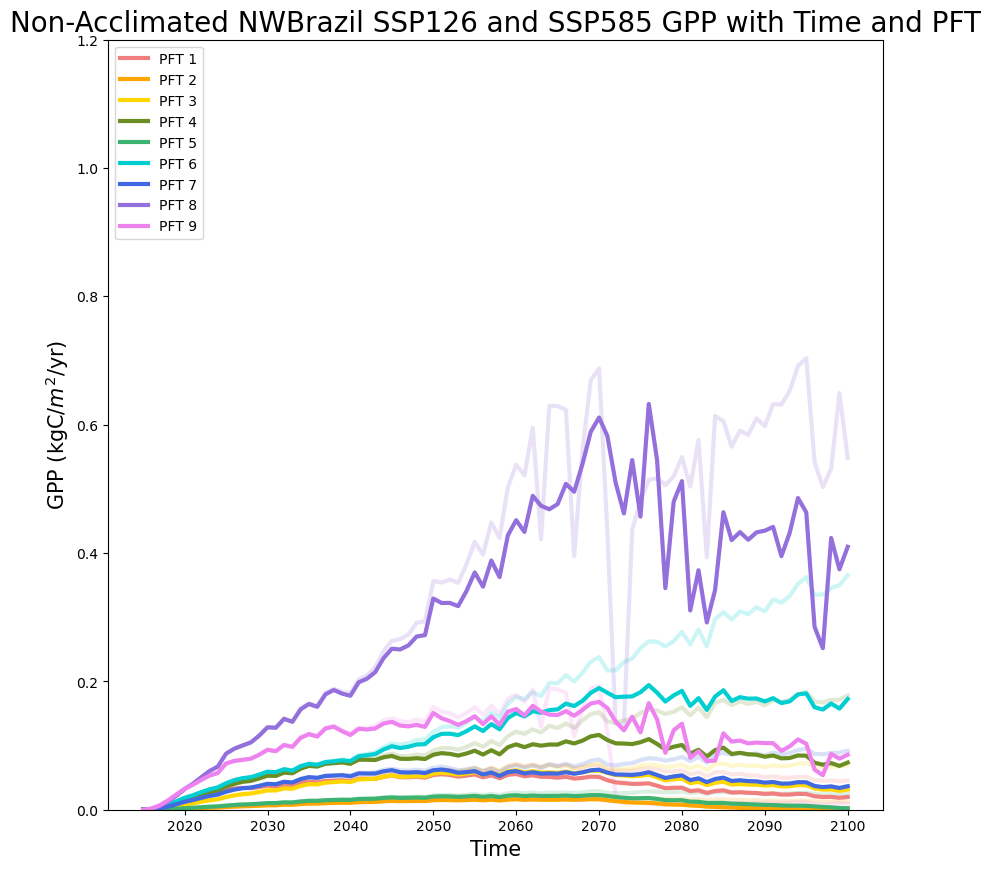

In [611]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levpft=slice(1,1))
nwbrazil126pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_ssp126.sel(fates_levpft=slice(2,2))
nwbrazil126pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_ssp126.sel(fates_levpft=slice(3,3))
nwbrazil126pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_ssp126.sel(fates_levpft=slice(4,4))
nwbrazil126pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_ssp126.sel(fates_levpft=slice(5,5))
nwbrazil126pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_ssp126.sel(fates_levpft=slice(6,6))
nwbrazil126pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_ssp126.sel(fates_levpft=slice(7,7))
nwbrazil126pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_ssp126.sel(fates_levpft=slice(8,8))
nwbrazil126pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_ssp126.sel(fates_levpft=slice(9,9))
nwbrazil126pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levpft=slice(1,1))
nwbrazil585pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_ssp585.sel(fates_levpft=slice(2,2))
nwbrazil585pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_ssp585.sel(fates_levpft=slice(3,3))
nwbrazil585pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_ssp585.sel(fates_levpft=slice(4,4))
nwbrazil585pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_ssp585.sel(fates_levpft=slice(5,5))
nwbrazil585pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_ssp585.sel(fates_levpft=slice(6,6))
nwbrazil585pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_ssp585.sel(fates_levpft=slice(7,7))
nwbrazil585pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_ssp585.sel(fates_levpft=slice(8,8))
nwbrazil585pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_ssp585.sel(fates_levpft=slice(9,9))
nwbrazil585pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.2)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated NWBrazil SSP126 and SSP585 GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher GPP

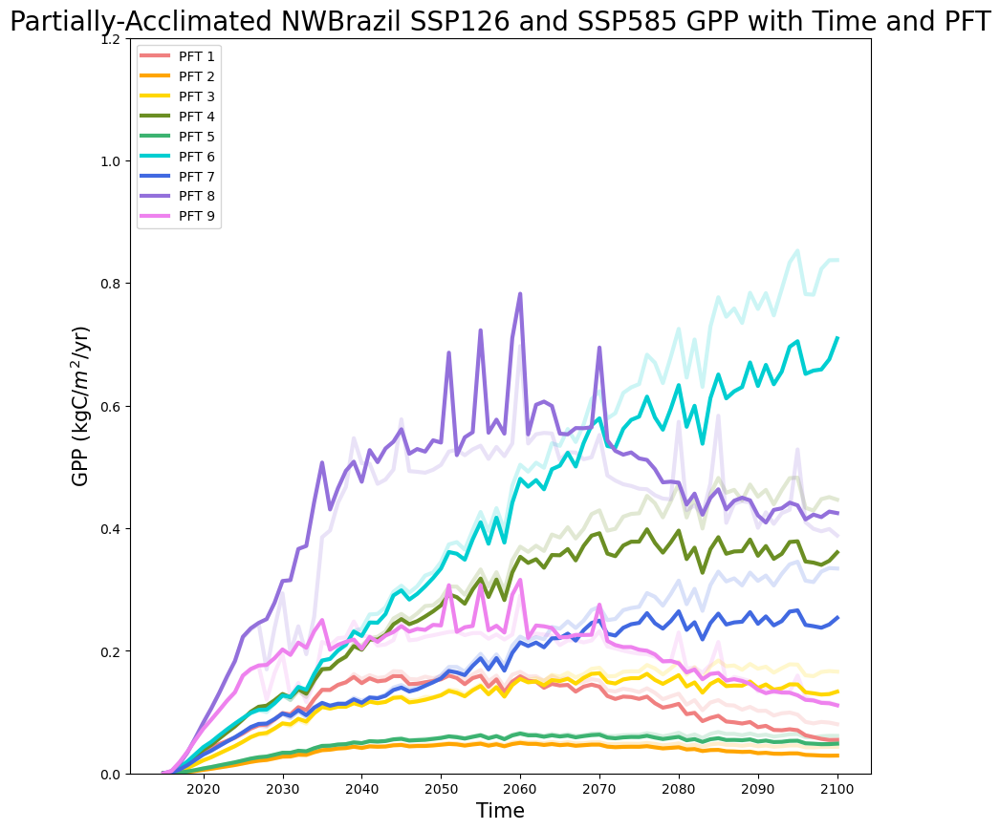

In [27]:
#separating pft's
pft1 = pnwbrazil_ssp126.sel(fates_levpft=slice(1,1))
nwbrazil126pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = pnwbrazil_ssp126.sel(fates_levpft=slice(2,2))
nwbrazil126pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = pnwbrazil_ssp126.sel(fates_levpft=slice(3,3))
nwbrazil126pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = pnwbrazil_ssp126.sel(fates_levpft=slice(4,4))
nwbrazil126pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = pnwbrazil_ssp126.sel(fates_levpft=slice(5,5))
nwbrazil126pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = pnwbrazil_ssp126.sel(fates_levpft=slice(6,6))
nwbrazil126pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = pnwbrazil_ssp126.sel(fates_levpft=slice(7,7))
nwbrazil126pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = pnwbrazil_ssp126.sel(fates_levpft=slice(8,8))
nwbrazil126pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = pnwbrazil_ssp126.sel(fates_levpft=slice(9,9))
nwbrazil126pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = pnwbrazil_ssp585.sel(fates_levpft=slice(1,1))
nwbrazil585pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = pnwbrazil_ssp585.sel(fates_levpft=slice(2,2))
nwbrazil585pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = pnwbrazil_ssp585.sel(fates_levpft=slice(3,3))
nwbrazil585pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = pnwbrazil_ssp585.sel(fates_levpft=slice(4,4))
nwbrazil585pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = pnwbrazil_ssp585.sel(fates_levpft=slice(5,5))
nwbrazil585pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = pnwbrazil_ssp585.sel(fates_levpft=slice(6,6))
nwbrazil585pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = pnwbrazil_ssp585.sel(fates_levpft=slice(7,7))
nwbrazil585pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = pnwbrazil_ssp585.sel(fates_levpft=slice(8,8))
nwbrazil585pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = pnwbrazil_ssp585.sel(fates_levpft=slice(9,9))
nwbrazil585pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.2)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated NWBrazil SSP126 and SSP585 GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PNWBrazil_ssp126+585_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher GPP

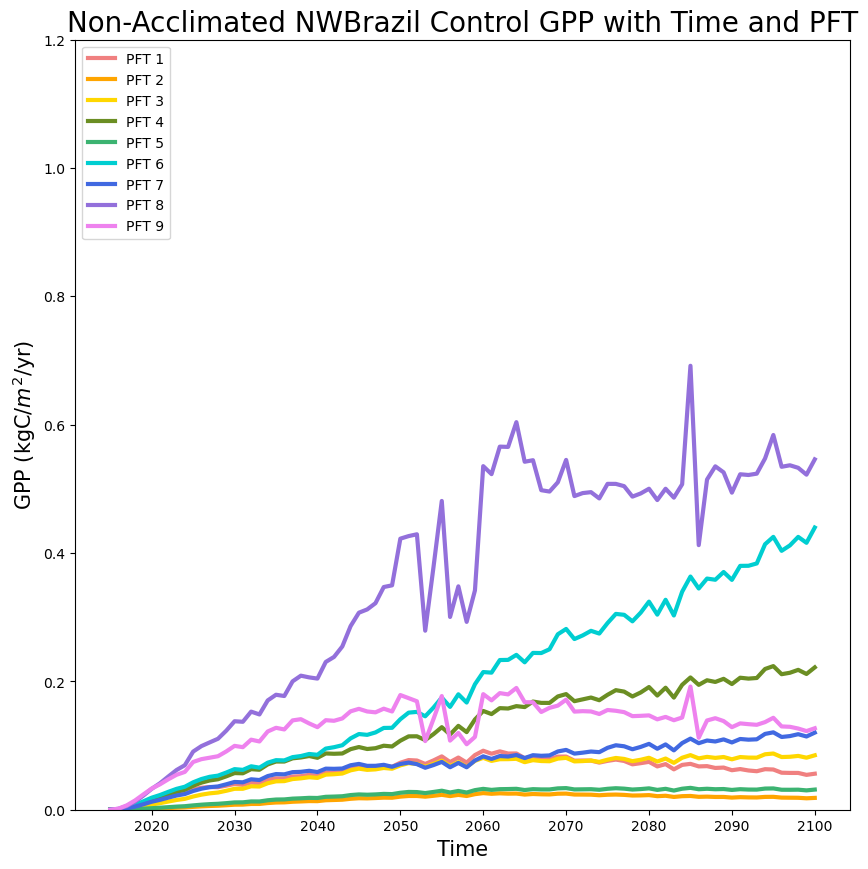

In [613]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levpft=slice(1,1))
nwbrazilpft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = nwbrazil_none.sel(fates_levpft=slice(2,2))
nwbrazilpft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = nwbrazil_none.sel(fates_levpft=slice(3,3))
nwbrazilpft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = nwbrazil_none.sel(fates_levpft=slice(4,4))
nwbrazilpft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = nwbrazil_none.sel(fates_levpft=slice(5,5))
nwbrazilpft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = nwbrazil_none.sel(fates_levpft=slice(6,6))
nwbrazilpft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = nwbrazil_none.sel(fates_levpft=slice(7,7))
nwbrazilpft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = nwbrazil_none.sel(fates_levpft=slice(8,8))
nwbrazilpft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = nwbrazil_none.sel(fates_levpft=slice(9,9))
nwbrazilpft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.2)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated NWBrazil Control GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_Control_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')

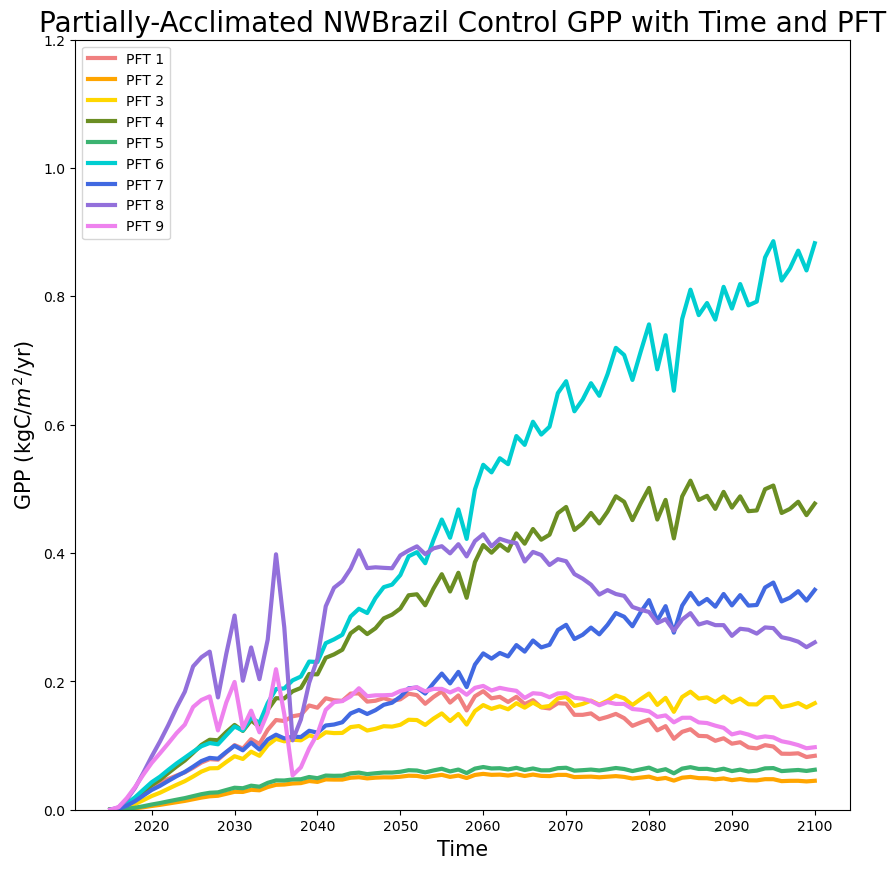

In [28]:
#separating pft's
pft1 = pnwbrazil_none.sel(fates_levpft=slice(1,1))
nwbrazilpft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = pnwbrazil_none.sel(fates_levpft=slice(2,2))
nwbrazilpft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = pnwbrazil_none.sel(fates_levpft=slice(3,3))
nwbrazilpft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = pnwbrazil_none.sel(fates_levpft=slice(4,4))
nwbrazilpft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = pnwbrazil_none.sel(fates_levpft=slice(5,5))
nwbrazilpft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = pnwbrazil_none.sel(fates_levpft=slice(6,6))
nwbrazilpft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = pnwbrazil_none.sel(fates_levpft=slice(7,7))
nwbrazilpft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = pnwbrazil_none.sel(fates_levpft=slice(8,8))
nwbrazilpft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = pnwbrazil_none.sel(fates_levpft=slice(9,9))
nwbrazilpft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.2)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated NWBrazil Control GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PNWBrazil_Control_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')

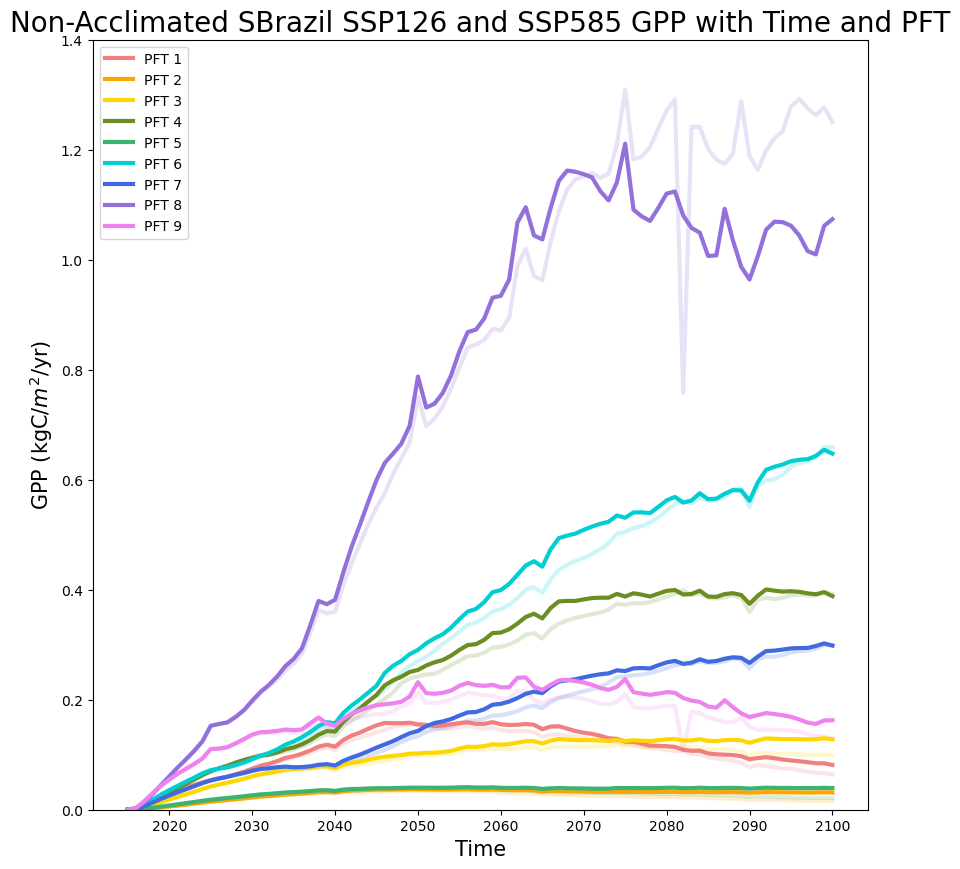

In [617]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levpft=slice(1,1))
sbrazil126pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_ssp126.sel(fates_levpft=slice(2,2))
sbrazil126pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_ssp126.sel(fates_levpft=slice(3,3))
sbrazil126pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_ssp126.sel(fates_levpft=slice(4,4))
sbrazil126pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_ssp126.sel(fates_levpft=slice(5,5))
sbrazil126pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_ssp126.sel(fates_levpft=slice(6,6))
sbrazil126pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_ssp126.sel(fates_levpft=slice(7,7))
sbrazil126pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_ssp126.sel(fates_levpft=slice(8,8))
sbrazil126pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_ssp126.sel(fates_levpft=slice(9,9))
sbrazil126pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levpft=slice(1,1))
sbrazil585pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_ssp585.sel(fates_levpft=slice(2,2))
sbrazil585pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_ssp585.sel(fates_levpft=slice(3,3))
sbrazil585pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_ssp585.sel(fates_levpft=slice(4,4))
sbrazil585pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_ssp585.sel(fates_levpft=slice(5,5))
sbrazil585pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_ssp585.sel(fates_levpft=slice(6,6))
sbrazil585pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_ssp585.sel(fates_levpft=slice(7,7))
sbrazil585pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_ssp585.sel(fates_levpft=slice(8,8))
sbrazil585pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_ssp585.sel(fates_levpft=slice(9,9))
sbrazil585pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.4)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated SBrazil SSP126 and SSP585 GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher GPP

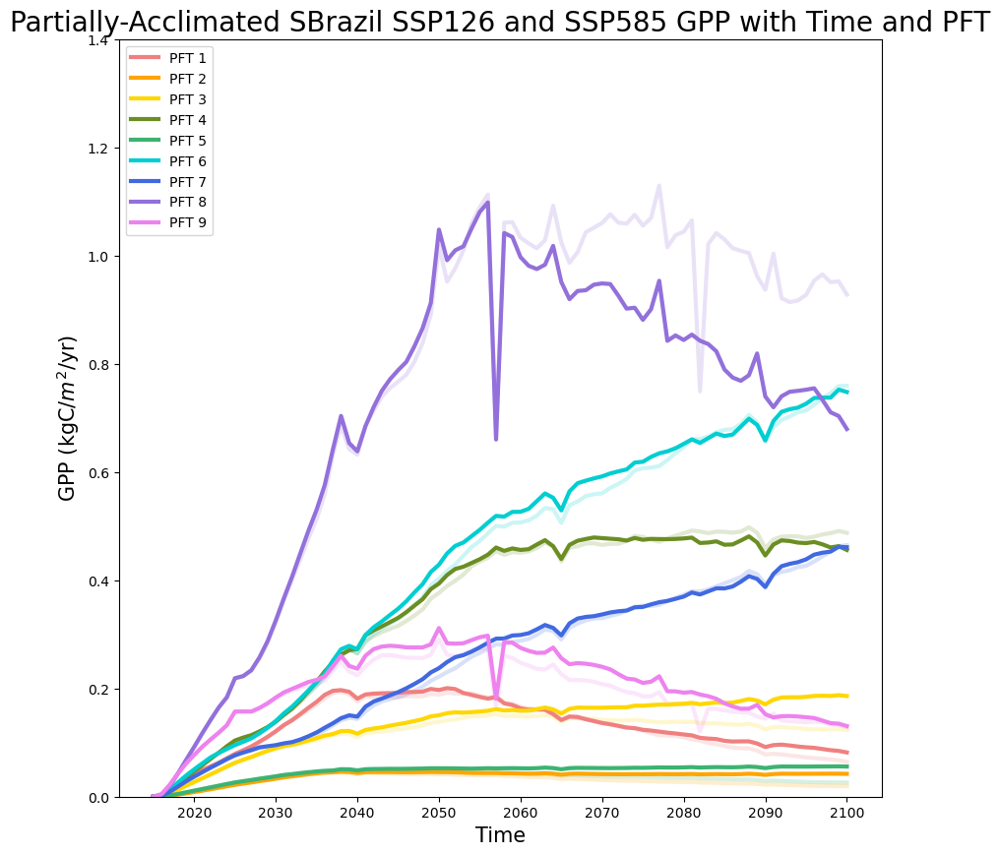

In [29]:
#separating pft's
pft1 = psbrazil_ssp126.sel(fates_levpft=slice(1,1))
sbrazil126pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = psbrazil_ssp126.sel(fates_levpft=slice(2,2))
sbrazil126pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = psbrazil_ssp126.sel(fates_levpft=slice(3,3))
sbrazil126pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = psbrazil_ssp126.sel(fates_levpft=slice(4,4))
sbrazil126pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = psbrazil_ssp126.sel(fates_levpft=slice(5,5))
sbrazil126pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = psbrazil_ssp126.sel(fates_levpft=slice(6,6))
sbrazil126pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = psbrazil_ssp126.sel(fates_levpft=slice(7,7))
sbrazil126pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = psbrazil_ssp126.sel(fates_levpft=slice(8,8))
sbrazil126pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = psbrazil_ssp126.sel(fates_levpft=slice(9,9))
sbrazil126pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#separating pft's
pft1 = psbrazil_ssp585.sel(fates_levpft=slice(1,1))
sbrazil585pft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = psbrazil_ssp585.sel(fates_levpft=slice(2,2))
sbrazil585pft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = psbrazil_ssp585.sel(fates_levpft=slice(3,3))
sbrazil585pft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = psbrazil_ssp585.sel(fates_levpft=slice(4,4))
sbrazil585pft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = psbrazil_ssp585.sel(fates_levpft=slice(5,5))
sbrazil585pft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = psbrazil_ssp585.sel(fates_levpft=slice(6,6))
sbrazil585pft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = psbrazil_ssp585.sel(fates_levpft=slice(7,7))
sbrazil585pft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = psbrazil_ssp585.sel(fates_levpft=slice(8,8))
sbrazil585pft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = psbrazil_ssp585.sel(fates_levpft=slice(9,9))
sbrazil585pft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.4)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated SBrazil SSP126 and SSP585 GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PSBrazil_ssp126+585_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher GPP

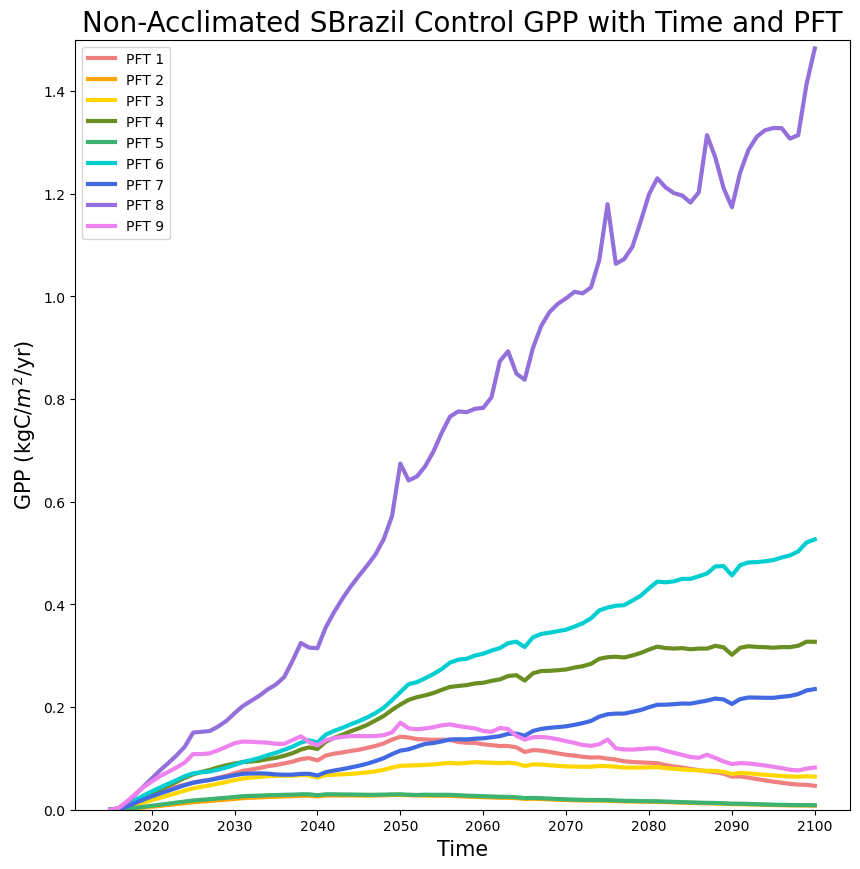

In [556]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levpft=slice(1,1))
sbrazilpft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = sbrazil_none.sel(fates_levpft=slice(2,2))
sbrazilpft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = sbrazil_none.sel(fates_levpft=slice(3,3))
sbrazilpft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = sbrazil_none.sel(fates_levpft=slice(4,4))
sbrazilpft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = sbrazil_none.sel(fates_levpft=slice(5,5))
sbrazilpft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = sbrazil_none.sel(fates_levpft=slice(6,6))
sbrazilpft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = sbrazil_none.sel(fates_levpft=slice(7,7))
sbrazilpft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = sbrazil_none.sel(fates_levpft=slice(8,8))
sbrazilpft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = sbrazil_none.sel(fates_levpft=slice(9,9))
sbrazilpft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.5)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated SBrazil Control GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_Control_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')

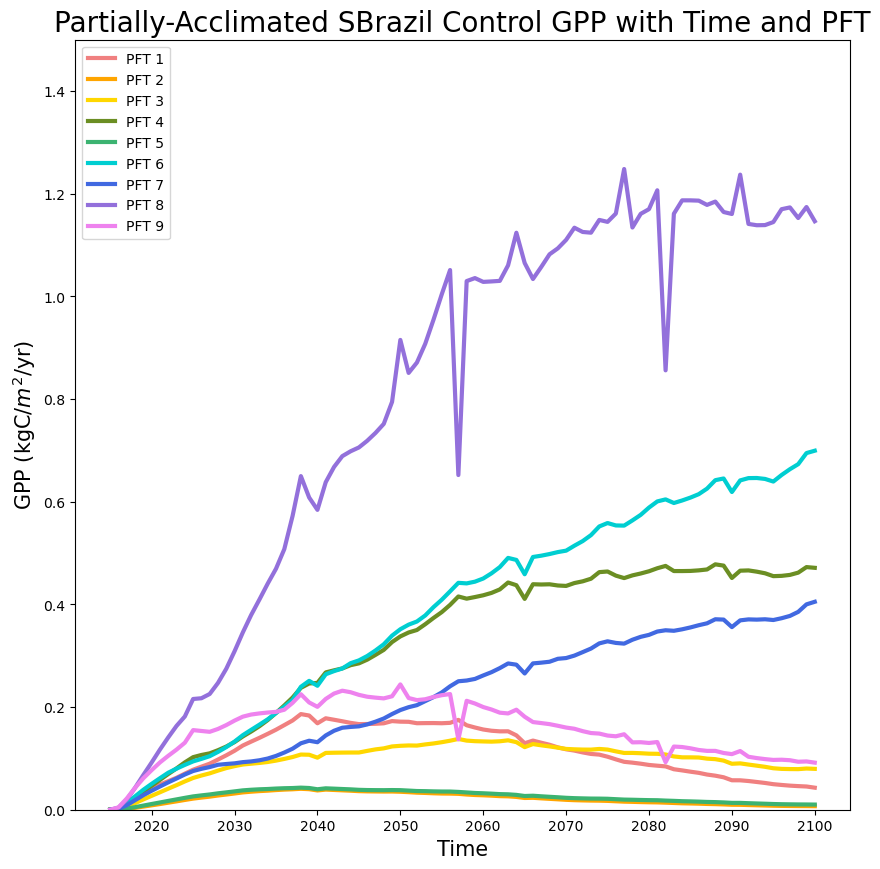

In [30]:
#separating pft's
pft1 = psbrazil_none.sel(fates_levpft=slice(1,1))
sbrazilpft1 = (pft1.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft2 = psbrazil_none.sel(fates_levpft=slice(2,2))
sbrazilpft2 = (pft2.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft3 = psbrazil_none.sel(fates_levpft=slice(3,3))
sbrazilpft3 = (pft3.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft4 = psbrazil_none.sel(fates_levpft=slice(4,4))
sbrazilpft4 = (pft4.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft5 = psbrazil_none.sel(fates_levpft=slice(5,5))
sbrazilpft5 = (pft5.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft6 = psbrazil_none.sel(fates_levpft=slice(6,6))
sbrazilpft6 = (pft6.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft7 = psbrazil_none.sel(fates_levpft=slice(7,7))
sbrazilpft7 = (pft7.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft8 = psbrazil_none.sel(fates_levpft=slice(8,8))
sbrazilpft8 = (pft8.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
pft9 = psbrazil_none.sel(fates_levpft=slice(9,9))
sbrazilpft9 = (pft9.FATES_GPP_PF.mean(dim="fates_levpft"))*86400*365
#plotting GPP with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,1.5)
ax.set_ylabel("GPP (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated SBrazil Control GPP with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PSBrazil_Control_GPP_Time_PFT.png", dpi=300, bbox_inches='tight')

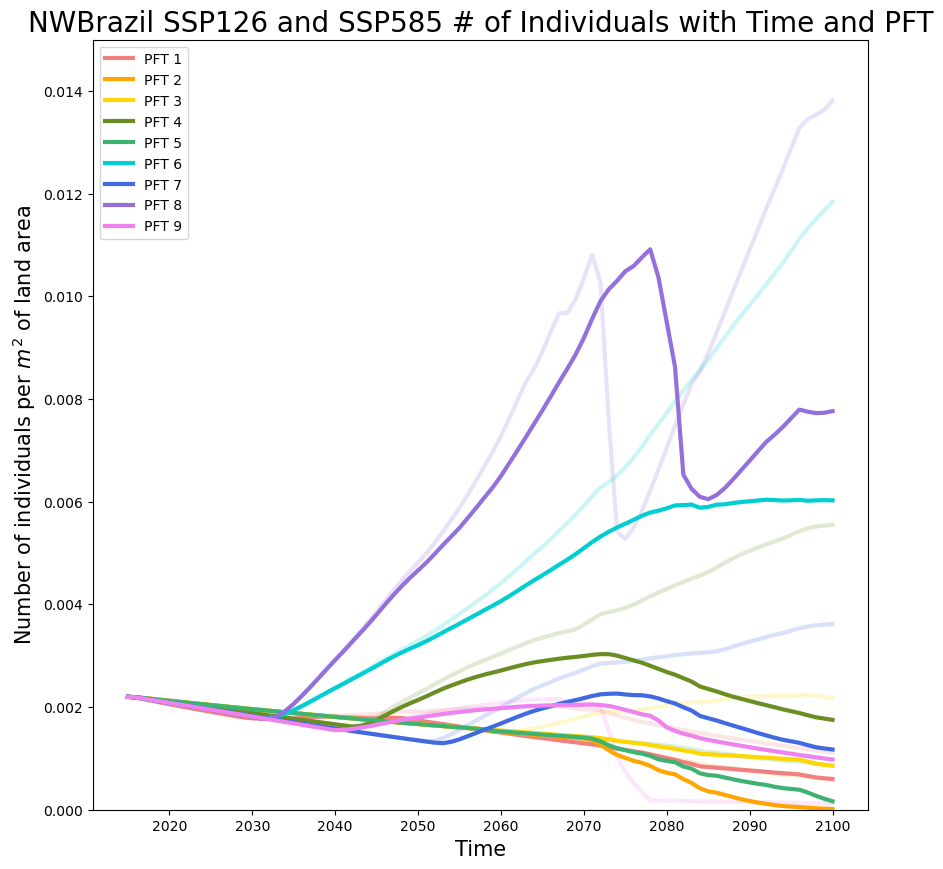

In [349]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levpft=slice(1,1))
nwbrazil126pft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = nwbrazil_ssp126.sel(fates_levpft=slice(2,2))
nwbrazil126pft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = nwbrazil_ssp126.sel(fates_levpft=slice(3,3))
nwbrazil126pft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = nwbrazil_ssp126.sel(fates_levpft=slice(4,4))
nwbrazil126pft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = nwbrazil_ssp126.sel(fates_levpft=slice(5,5))
nwbrazil126pft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = nwbrazil_ssp126.sel(fates_levpft=slice(6,6))
nwbrazil126pft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = nwbrazil_ssp126.sel(fates_levpft=slice(7,7))
nwbrazil126pft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = nwbrazil_ssp126.sel(fates_levpft=slice(8,8))
nwbrazil126pft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = nwbrazil_ssp126.sel(fates_levpft=slice(9,9))
nwbrazil126pft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levpft=slice(1,1))
nwbrazil585pft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = nwbrazil_ssp585.sel(fates_levpft=slice(2,2))
nwbrazil585pft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = nwbrazil_ssp585.sel(fates_levpft=slice(3,3))
nwbrazil585pft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = nwbrazil_ssp585.sel(fates_levpft=slice(4,4))
nwbrazil585pft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = nwbrazil_ssp585.sel(fates_levpft=slice(5,5))
nwbrazil585pft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = nwbrazil_ssp585.sel(fates_levpft=slice(6,6))
nwbrazil585pft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = nwbrazil_ssp585.sel(fates_levpft=slice(7,7))
nwbrazil585pft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = nwbrazil_ssp585.sel(fates_levpft=slice(8,8))
nwbrazil585pft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = nwbrazil_ssp585.sel(fates_levpft=slice(9,9))
nwbrazil585pft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#plotting number of individuals with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.015)
ax.set_ylabel("Number of individuals per $m^2$ of land area", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP126 and SSP585 # of Individuals with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_Individuals_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher # of individuals

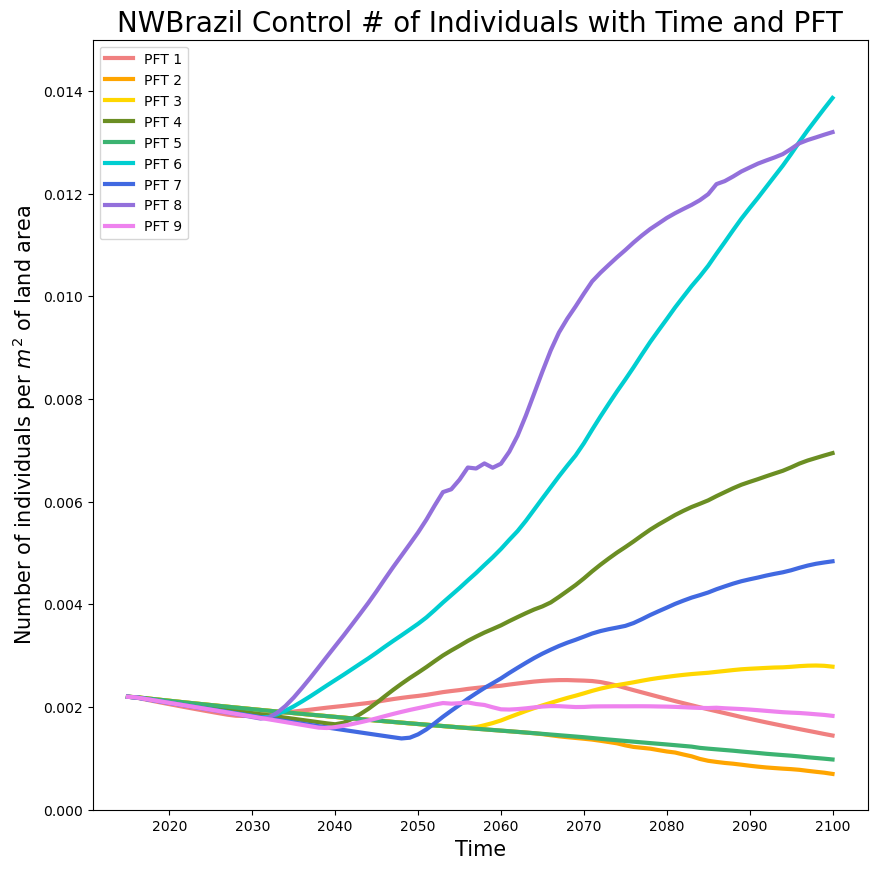

In [350]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levpft=slice(1,1))
nwbrazilpft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = nwbrazil_none.sel(fates_levpft=slice(2,2))
nwbrazilpft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = nwbrazil_none.sel(fates_levpft=slice(3,3))
nwbrazilpft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = nwbrazil_none.sel(fates_levpft=slice(4,4))
nwbrazilpft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = nwbrazil_none.sel(fates_levpft=slice(5,5))
nwbrazilpft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = nwbrazil_none.sel(fates_levpft=slice(6,6))
nwbrazilpft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = nwbrazil_none.sel(fates_levpft=slice(7,7))
nwbrazilpft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = nwbrazil_none.sel(fates_levpft=slice(8,8))
nwbrazilpft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = nwbrazil_none.sel(fates_levpft=slice(9,9))
nwbrazilpft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#plotting number of individuals with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.015)
ax.set_ylabel("Number of individuals per $m^2$ of land area", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil Control # of Individuals with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_Control_Individuals_Time_PFT.png", dpi=300, bbox_inches='tight')

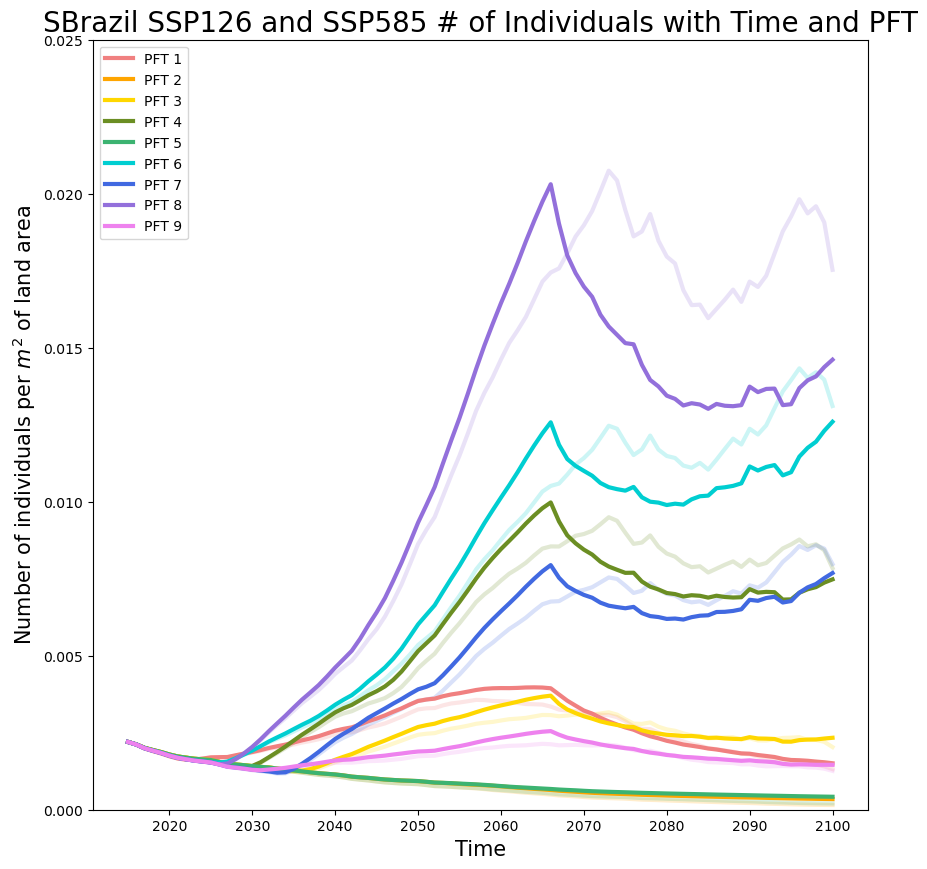

In [353]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levpft=slice(1,1))
sbrazil126pft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = sbrazil_ssp126.sel(fates_levpft=slice(2,2))
sbrazil126pft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = sbrazil_ssp126.sel(fates_levpft=slice(3,3))
sbrazil126pft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = sbrazil_ssp126.sel(fates_levpft=slice(4,4))
sbrazil126pft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = sbrazil_ssp126.sel(fates_levpft=slice(5,5))
sbrazil126pft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = sbrazil_ssp126.sel(fates_levpft=slice(6,6))
sbrazil126pft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = sbrazil_ssp126.sel(fates_levpft=slice(7,7))
sbrazil126pft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = sbrazil_ssp126.sel(fates_levpft=slice(8,8))
sbrazil126pft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = sbrazil_ssp126.sel(fates_levpft=slice(9,9))
sbrazil126pft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levpft=slice(1,1))
sbrazil585pft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = sbrazil_ssp585.sel(fates_levpft=slice(2,2))
sbrazil585pft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = sbrazil_ssp585.sel(fates_levpft=slice(3,3))
sbrazil585pft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = sbrazil_ssp585.sel(fates_levpft=slice(4,4))
sbrazil585pft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = sbrazil_ssp585.sel(fates_levpft=slice(5,5))
sbrazil585pft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = sbrazil_ssp585.sel(fates_levpft=slice(6,6))
sbrazil585pft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = sbrazil_ssp585.sel(fates_levpft=slice(7,7))
sbrazil585pft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = sbrazil_ssp585.sel(fates_levpft=slice(8,8))
sbrazil585pft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = sbrazil_ssp585.sel(fates_levpft=slice(9,9))
sbrazil585pft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#plotting number of individuals with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='olivedrab', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='mediumseagreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='darkturquoise', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='royalblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='violet', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.025)
ax.set_ylabel("Number of individuals per $m^2$ of land area", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP126 and SSP585 # of Individuals with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_Individuals_Time_PFT.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher # of individuals

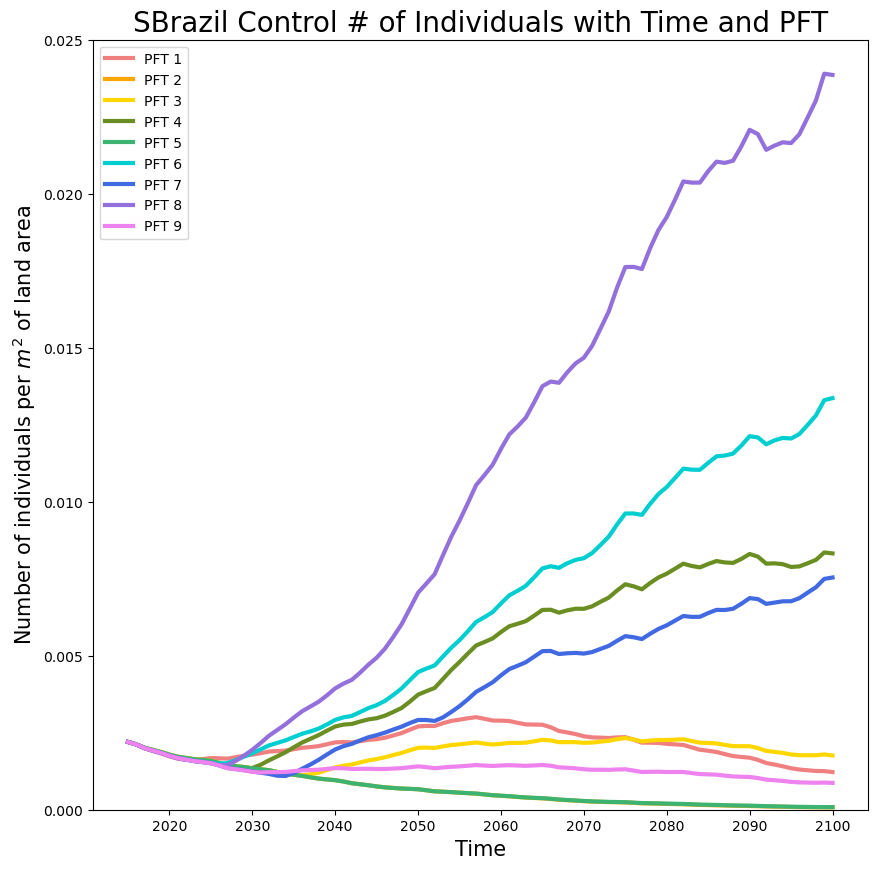

In [354]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levpft=slice(1,1))
sbrazilpft1 = (pft1.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft2 = sbrazil_none.sel(fates_levpft=slice(2,2))
sbrazilpft2 = (pft2.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft3 = sbrazil_none.sel(fates_levpft=slice(3,3))
sbrazilpft3 = (pft3.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft4 = sbrazil_none.sel(fates_levpft=slice(4,4))
sbrazilpft4 = (pft4.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft5 = sbrazil_none.sel(fates_levpft=slice(5,5))
sbrazilpft5 = (pft5.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft6 = sbrazil_none.sel(fates_levpft=slice(6,6))
sbrazilpft6 = (pft6.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft7 = sbrazil_none.sel(fates_levpft=slice(7,7))
sbrazilpft7 = (pft7.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft8 = sbrazil_none.sel(fates_levpft=slice(8,8))
sbrazilpft8 = (pft8.FATES_NPLANT_PF.mean(dim="fates_levpft"))
pft9 = sbrazil_none.sel(fates_levpft=slice(9,9))
sbrazilpft9 = (pft9.FATES_NPLANT_PF.mean(dim="fates_levpft"))
#plotting number of individuals with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="PFT 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="PFT 2", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="PFT 3", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="PFT 4", color='olivedrab', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="PFT 5", color='mediumseagreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="PFT 6", color='darkturquoise', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="PFT 7", color='royalblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="PFT 8", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="PFT 9", color='violet', linewidth=3)
plt.ylim(0,0.025)
ax.set_ylabel("Number of individuals per $m^2$ of land area", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil Control # of Individuals with Time and PFT",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_Control_Individuals_Time_PFT.png", dpi=300, bbox_inches='tight')

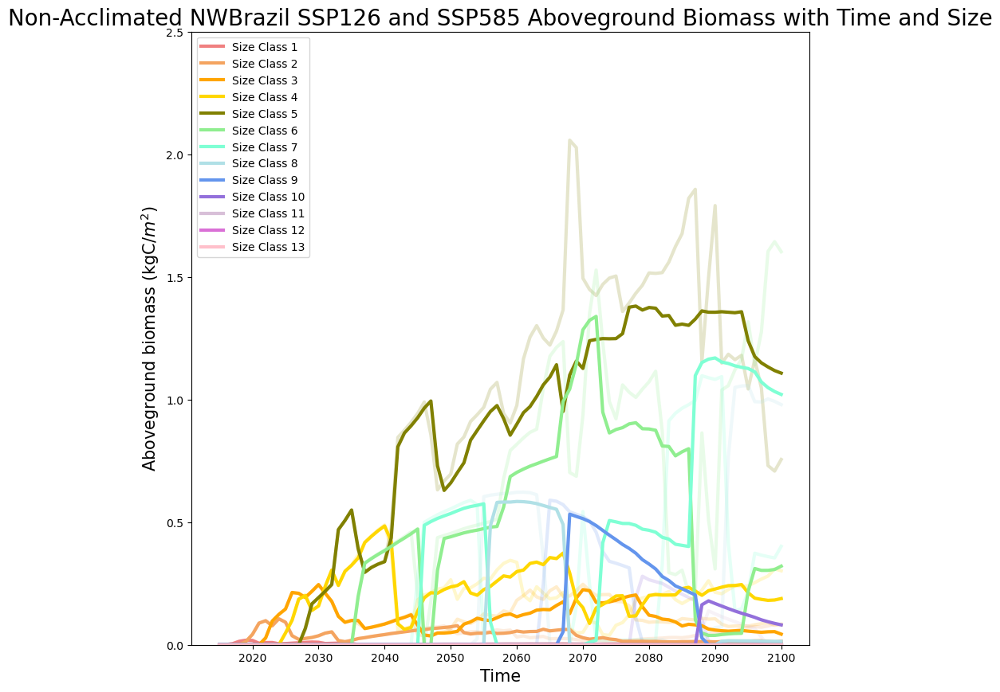

In [633]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levscls=slice(0,0))
nwbrazil126pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_ssp126.sel(fates_levscls=slice(5,5))
nwbrazil126pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_ssp126.sel(fates_levscls=slice(10,10))
nwbrazil126pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_ssp126.sel(fates_levscls=slice(15,15))
nwbrazil126pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_ssp126.sel(fates_levscls=slice(20,20))
nwbrazil126pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_ssp126.sel(fates_levscls=slice(30,30))
nwbrazil126pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_ssp126.sel(fates_levscls=slice(40,40))
nwbrazil126pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_ssp126.sel(fates_levscls=slice(50,50))
nwbrazil126pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_ssp126.sel(fates_levscls=slice(60,60))
nwbrazil126pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_ssp126.sel(fates_levscls=slice(70,70))
nwbrazil126pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_ssp126.sel(fates_levscls=slice(80,80))
nwbrazil126pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_ssp126.sel(fates_levscls=slice(90,90))
nwbrazil126pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_ssp126.sel(fates_levscls=slice(100,100))
nwbrazil126pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levscls=slice(0,0))
nwbrazil585pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_ssp585.sel(fates_levscls=slice(5,5))
nwbrazil585pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_ssp585.sel(fates_levscls=slice(10,10))
nwbrazil585pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_ssp585.sel(fates_levscls=slice(15,15))
nwbrazil585pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_ssp585.sel(fates_levscls=slice(20,20))
nwbrazil585pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_ssp585.sel(fates_levscls=slice(30,30))
nwbrazil585pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_ssp585.sel(fates_levscls=slice(40,40))
nwbrazil585pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_ssp585.sel(fates_levscls=slice(50,50))
nwbrazil585pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_ssp585.sel(fates_levscls=slice(60,60))
nwbrazil585pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_ssp585.sel(fates_levscls=slice(70,70))
nwbrazil585pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_ssp585.sel(fates_levscls=slice(80,80))
nwbrazil585pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_ssp585.sel(fates_levscls=slice(90,90))
nwbrazil585pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_ssp585.sel(fates_levscls=slice(100,100))
nwbrazil585pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,2.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated NWBrazil SSP126 and SSP585 Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher biomass of most sizes at 2070

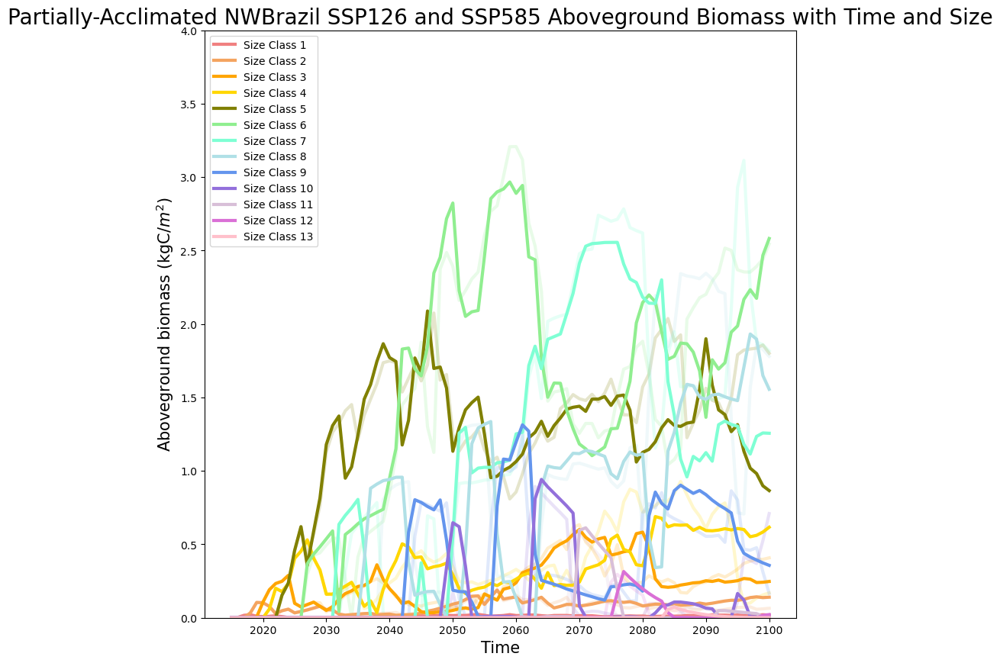

In [36]:
#separating pft's
pft1 = pnwbrazil_ssp126.sel(fates_levscls=slice(0,0))
nwbrazil126pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = pnwbrazil_ssp126.sel(fates_levscls=slice(5,5))
nwbrazil126pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = pnwbrazil_ssp126.sel(fates_levscls=slice(10,10))
nwbrazil126pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = pnwbrazil_ssp126.sel(fates_levscls=slice(15,15))
nwbrazil126pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = pnwbrazil_ssp126.sel(fates_levscls=slice(20,20))
nwbrazil126pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = pnwbrazil_ssp126.sel(fates_levscls=slice(30,30))
nwbrazil126pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = pnwbrazil_ssp126.sel(fates_levscls=slice(40,40))
nwbrazil126pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = pnwbrazil_ssp126.sel(fates_levscls=slice(50,50))
nwbrazil126pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = pnwbrazil_ssp126.sel(fates_levscls=slice(60,60))
nwbrazil126pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = pnwbrazil_ssp126.sel(fates_levscls=slice(70,70))
nwbrazil126pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = pnwbrazil_ssp126.sel(fates_levscls=slice(80,80))
nwbrazil126pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = pnwbrazil_ssp126.sel(fates_levscls=slice(90,90))
nwbrazil126pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = pnwbrazil_ssp126.sel(fates_levscls=slice(100,100))
nwbrazil126pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = pnwbrazil_ssp585.sel(fates_levscls=slice(0,0))
nwbrazil585pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = pnwbrazil_ssp585.sel(fates_levscls=slice(5,5))
nwbrazil585pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = pnwbrazil_ssp585.sel(fates_levscls=slice(10,10))
nwbrazil585pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = pnwbrazil_ssp585.sel(fates_levscls=slice(15,15))
nwbrazil585pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = pnwbrazil_ssp585.sel(fates_levscls=slice(20,20))
nwbrazil585pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = pnwbrazil_ssp585.sel(fates_levscls=slice(30,30))
nwbrazil585pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = pnwbrazil_ssp585.sel(fates_levscls=slice(40,40))
nwbrazil585pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = pnwbrazil_ssp585.sel(fates_levscls=slice(50,50))
nwbrazil585pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = pnwbrazil_ssp585.sel(fates_levscls=slice(60,60))
nwbrazil585pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = pnwbrazil_ssp585.sel(fates_levscls=slice(70,70))
nwbrazil585pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = pnwbrazil_ssp585.sel(fates_levscls=slice(80,80))
nwbrazil585pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = pnwbrazil_ssp585.sel(fates_levscls=slice(90,90))
nwbrazil585pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = pnwbrazil_ssp585.sel(fates_levscls=slice(100,100))
nwbrazil585pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,4.0)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated NWBrazil SSP126 and SSP585 Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PNWBrazil_ssp126+585_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#lower emissions pathway results in higher biomass of most sizes at 2070

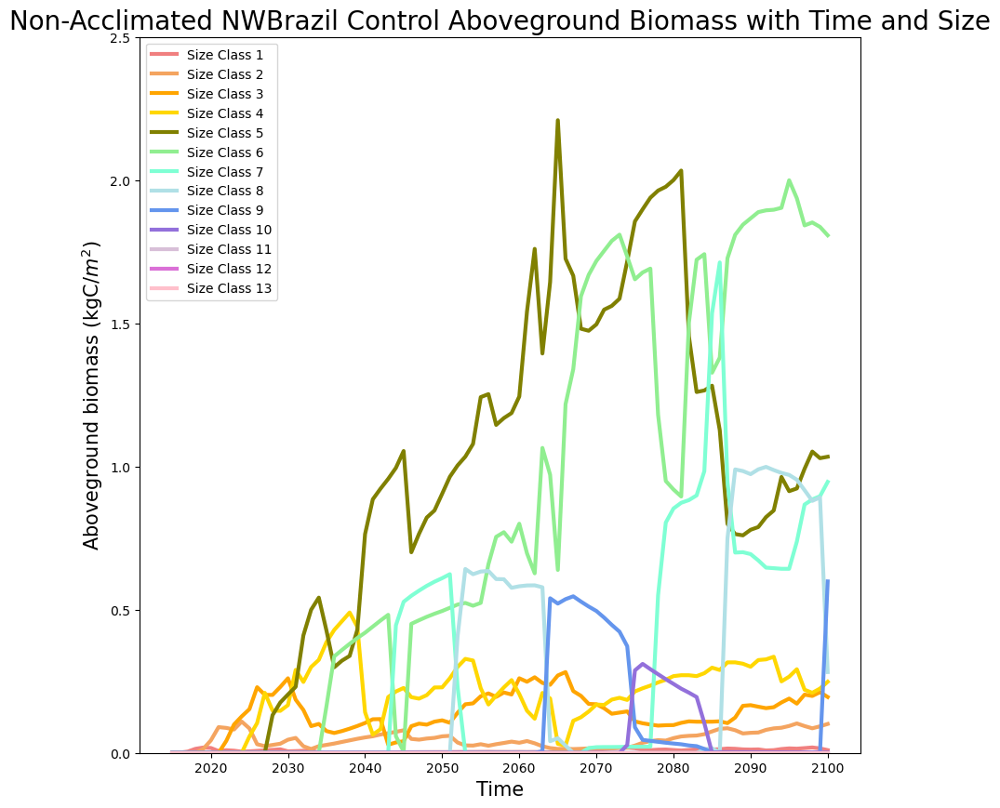

In [635]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levscls=slice(0,0))
nwbrazilpft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_none.sel(fates_levscls=slice(5,5))
nwbrazilpft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_none.sel(fates_levscls=slice(10,10))
nwbrazilpft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_none.sel(fates_levscls=slice(15,15))
nwbrazilpft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_none.sel(fates_levscls=slice(20,20))
nwbrazilpft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_none.sel(fates_levscls=slice(30,30))
nwbrazilpft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_none.sel(fates_levscls=slice(40,40))
nwbrazilpft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_none.sel(fates_levscls=slice(50,50))
nwbrazilpft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_none.sel(fates_levscls=slice(60,60))
nwbrazilpft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_none.sel(fates_levscls=slice(70,70))
nwbrazilpft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_none.sel(fates_levscls=slice(80,80))
nwbrazilpft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_none.sel(fates_levscls=slice(90,90))
nwbrazilpft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_none.sel(fates_levscls=slice(100,100))
nwbrazilpft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,2.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated NWBrazil Control Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_NWBrazil_Control_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')

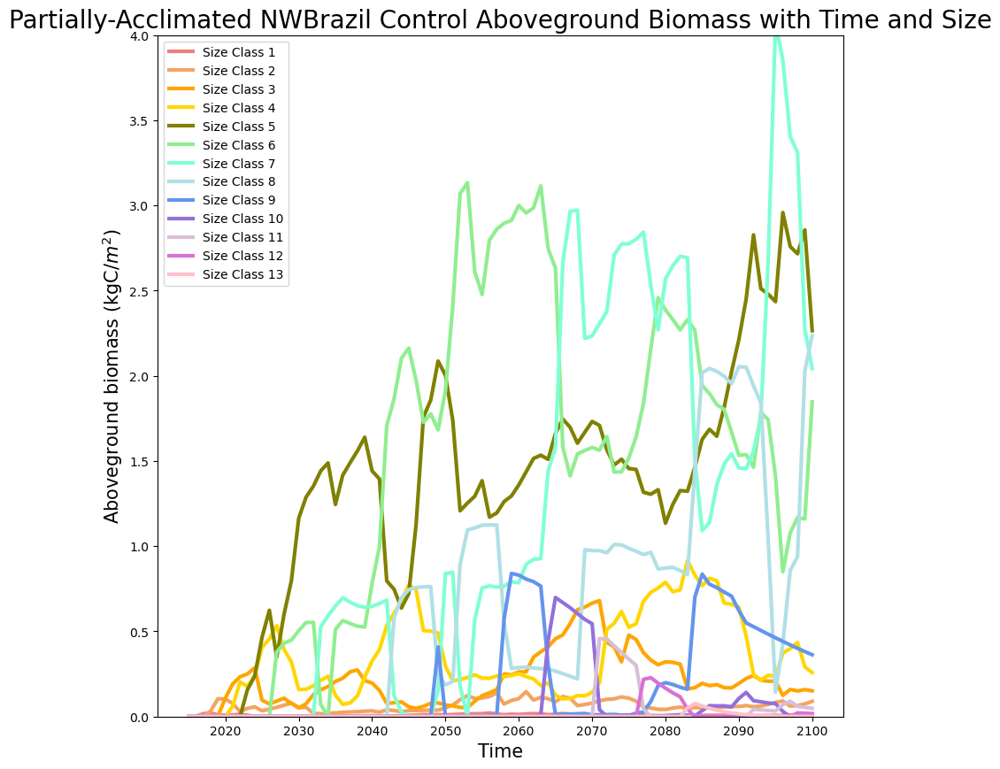

In [34]:
#separating pft's
pft1 = pnwbrazil_none.sel(fates_levscls=slice(0,0))
nwbrazilpft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = pnwbrazil_none.sel(fates_levscls=slice(5,5))
nwbrazilpft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = pnwbrazil_none.sel(fates_levscls=slice(10,10))
nwbrazilpft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = pnwbrazil_none.sel(fates_levscls=slice(15,15))
nwbrazilpft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = pnwbrazil_none.sel(fates_levscls=slice(20,20))
nwbrazilpft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = pnwbrazil_none.sel(fates_levscls=slice(30,30))
nwbrazilpft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = pnwbrazil_none.sel(fates_levscls=slice(40,40))
nwbrazilpft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = pnwbrazil_none.sel(fates_levscls=slice(50,50))
nwbrazilpft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = pnwbrazil_none.sel(fates_levscls=slice(60,60))
nwbrazilpft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = pnwbrazil_none.sel(fates_levscls=slice(70,70))
nwbrazilpft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = pnwbrazil_none.sel(fates_levscls=slice(80,80))
nwbrazilpft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = pnwbrazil_none.sel(fates_levscls=slice(90,90))
nwbrazilpft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = pnwbrazil_none.sel(fates_levscls=slice(100,100))
nwbrazilpft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,4.0)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated NWBrazil Control Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PNWBrazil_Control_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')

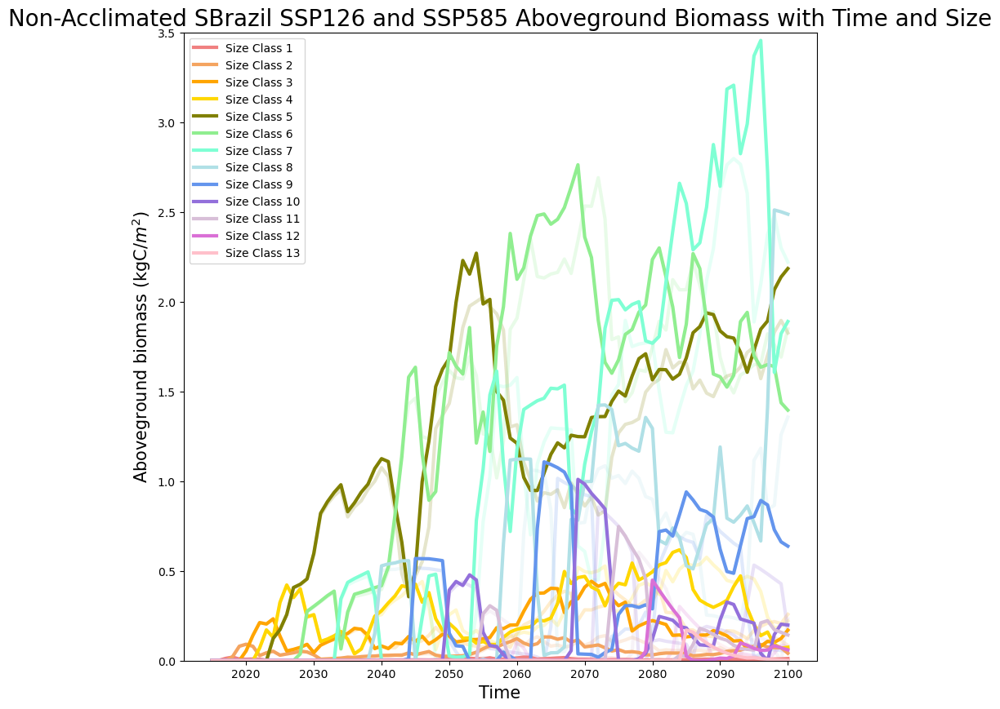

In [638]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levscls=slice(0,0))
sbrazil126pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_ssp126.sel(fates_levscls=slice(5,5))
sbrazil126pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_ssp126.sel(fates_levscls=slice(10,10))
sbrazil126pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_ssp126.sel(fates_levscls=slice(15,15))
sbrazil126pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_ssp126.sel(fates_levscls=slice(20,20))
sbrazil126pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_ssp126.sel(fates_levscls=slice(30,30))
sbrazil126pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_ssp126.sel(fates_levscls=slice(40,40))
sbrazil126pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_ssp126.sel(fates_levscls=slice(50,50))
sbrazil126pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_ssp126.sel(fates_levscls=slice(60,60))
sbrazil126pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_ssp126.sel(fates_levscls=slice(70,70))
sbrazil126pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_ssp126.sel(fates_levscls=slice(80,80))
sbrazil126pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_ssp126.sel(fates_levscls=slice(90,90))
sbrazil126pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_ssp126.sel(fates_levscls=slice(100,100))
sbrazil126pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levscls=slice(0,0))
sbrazil585pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_ssp585.sel(fates_levscls=slice(5,5))
sbrazil585pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_ssp585.sel(fates_levscls=slice(10,10))
sbrazil585pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_ssp585.sel(fates_levscls=slice(15,15))
sbrazil585pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_ssp585.sel(fates_levscls=slice(20,20))
sbrazil585pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_ssp585.sel(fates_levscls=slice(30,30))
sbrazil585pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_ssp585.sel(fates_levscls=slice(40,40))
sbrazil585pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_ssp585.sel(fates_levscls=slice(50,50))
sbrazil585pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_ssp585.sel(fates_levscls=slice(60,60))
sbrazil585pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_ssp585.sel(fates_levscls=slice(70,70))
sbrazil585pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_ssp585.sel(fates_levscls=slice(80,80))
sbrazil585pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_ssp585.sel(fates_levscls=slice(90,90))
sbrazil585pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_ssp585.sel(fates_levscls=slice(100,100))
sbrazil585pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,3.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated SBrazil SSP126 and SSP585 Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher biomass of most sizes at 2070

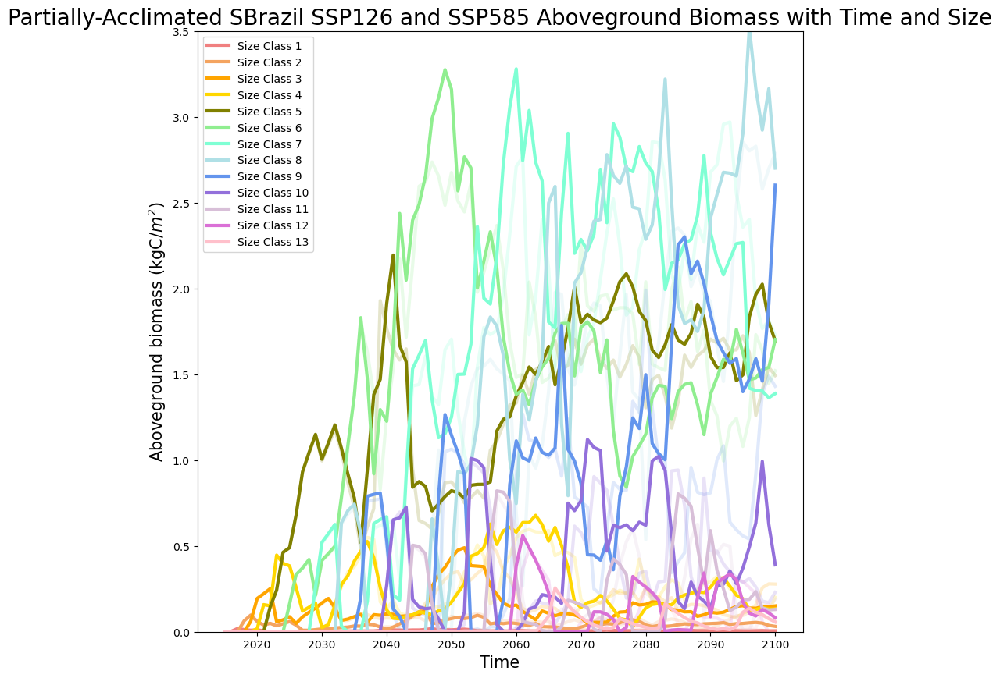

In [37]:
#separating pft's
pft1 = psbrazil_ssp126.sel(fates_levscls=slice(0,0))
sbrazil126pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = psbrazil_ssp126.sel(fates_levscls=slice(5,5))
sbrazil126pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = psbrazil_ssp126.sel(fates_levscls=slice(10,10))
sbrazil126pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = psbrazil_ssp126.sel(fates_levscls=slice(15,15))
sbrazil126pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = psbrazil_ssp126.sel(fates_levscls=slice(20,20))
sbrazil126pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = psbrazil_ssp126.sel(fates_levscls=slice(30,30))
sbrazil126pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = psbrazil_ssp126.sel(fates_levscls=slice(40,40))
sbrazil126pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = psbrazil_ssp126.sel(fates_levscls=slice(50,50))
sbrazil126pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = psbrazil_ssp126.sel(fates_levscls=slice(60,60))
sbrazil126pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = psbrazil_ssp126.sel(fates_levscls=slice(70,70))
sbrazil126pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = psbrazil_ssp126.sel(fates_levscls=slice(80,80))
sbrazil126pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = psbrazil_ssp126.sel(fates_levscls=slice(90,90))
sbrazil126pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = psbrazil_ssp126.sel(fates_levscls=slice(100,100))
sbrazil126pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = psbrazil_ssp585.sel(fates_levscls=slice(0,0))
sbrazil585pft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = psbrazil_ssp585.sel(fates_levscls=slice(5,5))
sbrazil585pft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = psbrazil_ssp585.sel(fates_levscls=slice(10,10))
sbrazil585pft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = psbrazil_ssp585.sel(fates_levscls=slice(15,15))
sbrazil585pft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = psbrazil_ssp585.sel(fates_levscls=slice(20,20))
sbrazil585pft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = psbrazil_ssp585.sel(fates_levscls=slice(30,30))
sbrazil585pft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = psbrazil_ssp585.sel(fates_levscls=slice(40,40))
sbrazil585pft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = psbrazil_ssp585.sel(fates_levscls=slice(50,50))
sbrazil585pft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = psbrazil_ssp585.sel(fates_levscls=slice(60,60))
sbrazil585pft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = psbrazil_ssp585.sel(fates_levscls=slice(70,70))
sbrazil585pft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = psbrazil_ssp585.sel(fates_levscls=slice(80,80))
sbrazil585pft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = psbrazil_ssp585.sel(fates_levscls=slice(90,90))
sbrazil585pft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = psbrazil_ssp585.sel(fates_levscls=slice(100,100))
sbrazil585pft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,3.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated SBrazil SSP126 and SSP585 Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PSBrazil_ssp126+585_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#higher emissions pathway results in higher biomass of most sizes at 2070

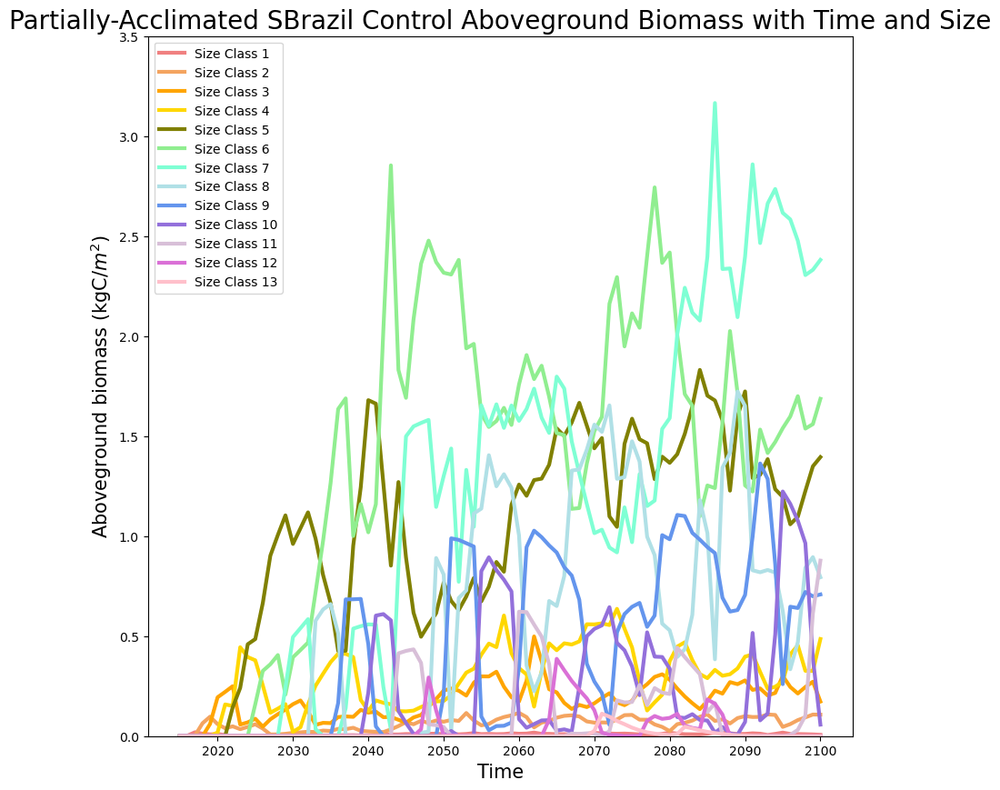

In [38]:
#separating pft's
pft1 = psbrazil_none.sel(fates_levscls=slice(0,0))
sbrazilpft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = psbrazil_none.sel(fates_levscls=slice(5,5))
sbrazilpft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = psbrazil_none.sel(fates_levscls=slice(10,10))
sbrazilpft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = psbrazil_none.sel(fates_levscls=slice(15,15))
sbrazilpft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = psbrazil_none.sel(fates_levscls=slice(20,20))
sbrazilpft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = psbrazil_none.sel(fates_levscls=slice(30,30))
sbrazilpft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = psbrazil_none.sel(fates_levscls=slice(40,40))
sbrazilpft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = psbrazil_none.sel(fates_levscls=slice(50,50))
sbrazilpft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = psbrazil_none.sel(fates_levscls=slice(60,60))
sbrazilpft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = psbrazil_none.sel(fates_levscls=slice(70,70))
sbrazilpft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = psbrazil_none.sel(fates_levscls=slice(80,80))
sbrazilpft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = psbrazil_none.sel(fates_levscls=slice(90,90))
sbrazilpft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = psbrazil_none.sel(fates_levscls=slice(100,100))
sbrazilpft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,3.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated SBrazil Control Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PSBrazil_Control_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')

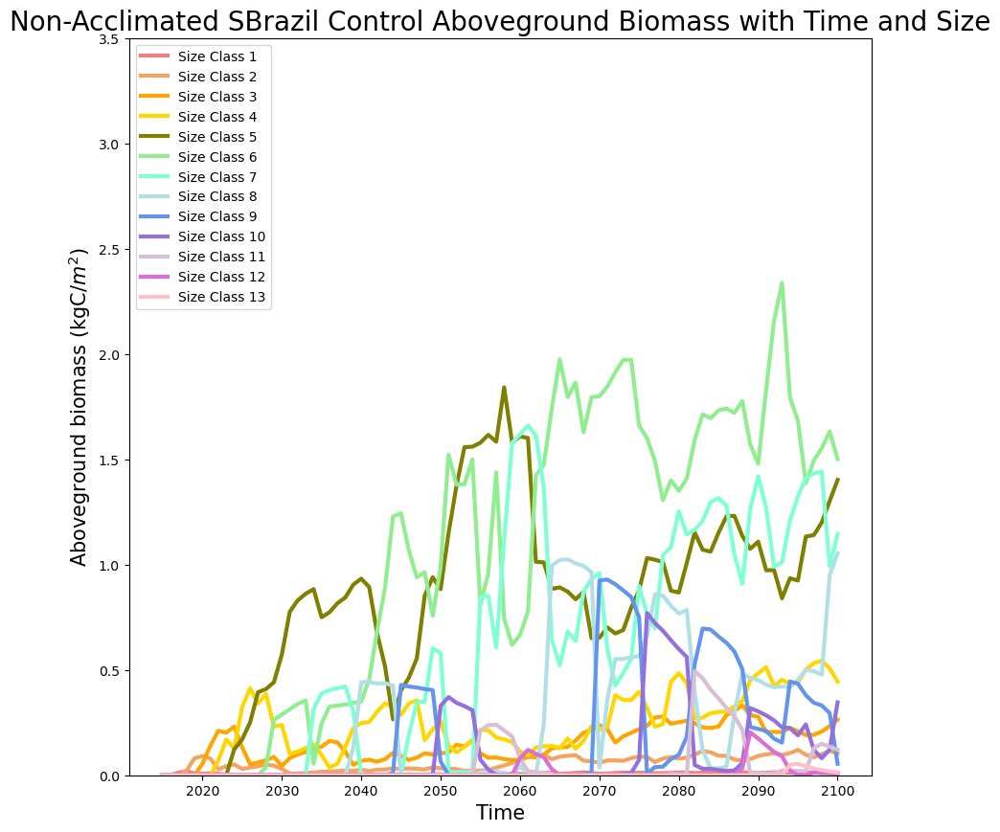

In [641]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levscls=slice(0,0))
sbrazilpft1 = (pft1.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_none.sel(fates_levscls=slice(5,5))
sbrazilpft2 = (pft2.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_none.sel(fates_levscls=slice(10,10))
sbrazilpft3 = (pft3.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_none.sel(fates_levscls=slice(15,15))
sbrazilpft4 = (pft4.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_none.sel(fates_levscls=slice(20,20))
sbrazilpft5 = (pft5.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_none.sel(fates_levscls=slice(30,30))
sbrazilpft6 = (pft6.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_none.sel(fates_levscls=slice(40,40))
sbrazilpft7 = (pft7.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_none.sel(fates_levscls=slice(50,50))
sbrazilpft8 = (pft8.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_none.sel(fates_levscls=slice(60,60))
sbrazilpft9 = (pft9.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_none.sel(fates_levscls=slice(70,70))
sbrazilpft10 = (pft10.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_none.sel(fates_levscls=slice(80,80))
sbrazilpft11 = (pft11.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_none.sel(fates_levscls=slice(90,90))
sbrazilpft12 = (pft12.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_none.sel(fates_levscls=slice(100,100))
sbrazilpft13 = (pft13.FATES_VEGC_ABOVEGROUND_SZ.mean(dim="fates_levscls"))
#plotting aboveground biomass by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,3.5)
ax.set_ylabel("Aboveground biomass (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated SBrazil Control Aboveground Biomass with Time and Size",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_SBrazil_Control_Biomass_Time_Size.png", dpi=300, bbox_inches='tight')

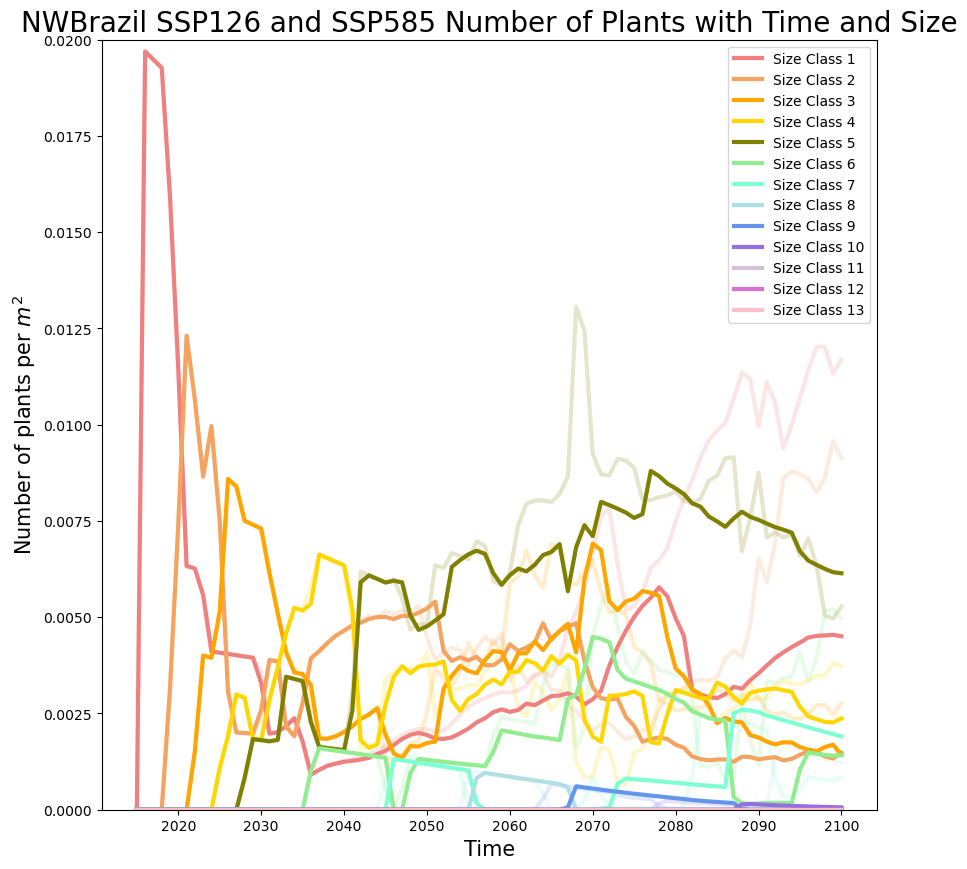

In [368]:
#separating pft's
pft1 = nwbrazil_ssp126.sel(fates_levscls=slice(0,0))
nwbrazil126pft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_ssp126.sel(fates_levscls=slice(5,5))
nwbrazil126pft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_ssp126.sel(fates_levscls=slice(10,10))
nwbrazil126pft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_ssp126.sel(fates_levscls=slice(15,15))
nwbrazil126pft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_ssp126.sel(fates_levscls=slice(20,20))
nwbrazil126pft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_ssp126.sel(fates_levscls=slice(30,30))
nwbrazil126pft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_ssp126.sel(fates_levscls=slice(40,40))
nwbrazil126pft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_ssp126.sel(fates_levscls=slice(50,50))
nwbrazil126pft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_ssp126.sel(fates_levscls=slice(60,60))
nwbrazil126pft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_ssp126.sel(fates_levscls=slice(70,70))
nwbrazil126pft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_ssp126.sel(fates_levscls=slice(80,80))
nwbrazil126pft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_ssp126.sel(fates_levscls=slice(90,90))
nwbrazil126pft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_ssp126.sel(fates_levscls=slice(100,100))
nwbrazil126pft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = nwbrazil_ssp585.sel(fates_levscls=slice(0,0))
nwbrazil585pft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_ssp585.sel(fates_levscls=slice(5,5))
nwbrazil585pft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_ssp585.sel(fates_levscls=slice(10,10))
nwbrazil585pft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_ssp585.sel(fates_levscls=slice(15,15))
nwbrazil585pft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_ssp585.sel(fates_levscls=slice(20,20))
nwbrazil585pft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_ssp585.sel(fates_levscls=slice(30,30))
nwbrazil585pft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_ssp585.sel(fates_levscls=slice(40,40))
nwbrazil585pft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_ssp585.sel(fates_levscls=slice(50,50))
nwbrazil585pft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_ssp585.sel(fates_levscls=slice(60,60))
nwbrazil585pft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_ssp585.sel(fates_levscls=slice(70,70))
nwbrazil585pft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_ssp585.sel(fates_levscls=slice(80,80))
nwbrazil585pft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_ssp585.sel(fates_levscls=slice(90,90))
nwbrazil585pft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_ssp585.sel(fates_levscls=slice(100,100))
nwbrazil585pft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil126time, nwbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(nwbrazil126time, nwbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(nwbrazil585time, nwbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,0.02)
ax.set_ylabel("Number of plants per $m^2$", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil SSP126 and SSP585 Number of Plants with Time and Size",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_NWBrazil_ssp126+585_Number_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#neither lower nor higher emissions pathway confidently results in higher # of plants at 2070

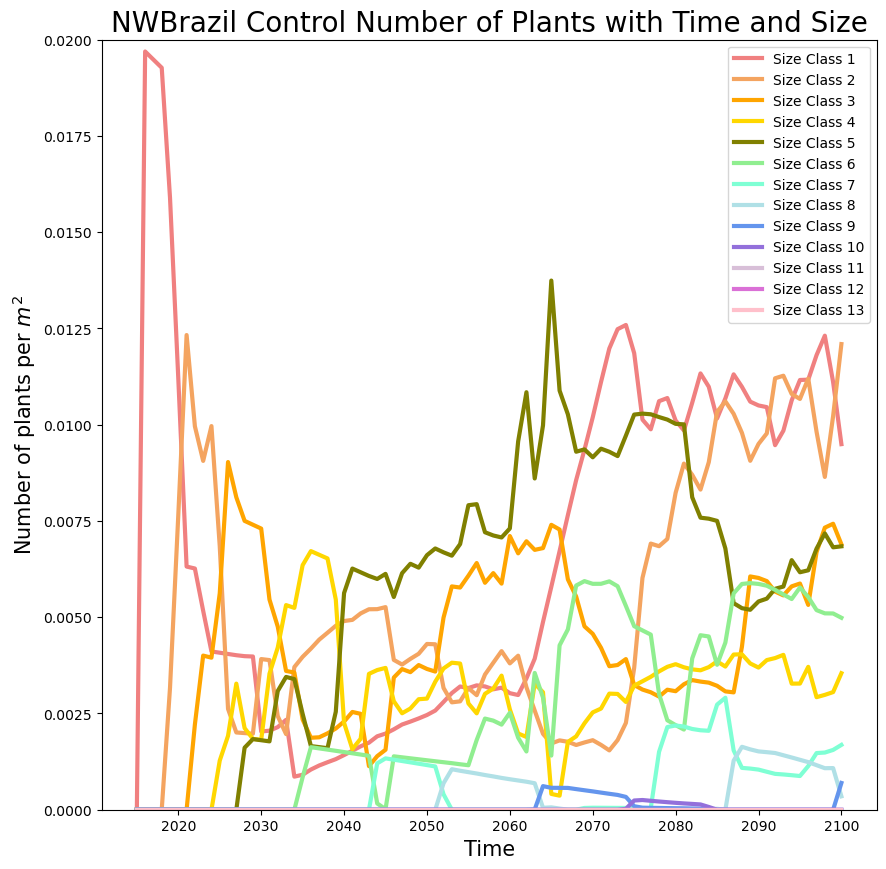

In [369]:
#separating pft's
pft1 = nwbrazil_none.sel(fates_levscls=slice(0,0))
nwbrazilpft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = nwbrazil_none.sel(fates_levscls=slice(5,5))
nwbrazilpft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = nwbrazil_none.sel(fates_levscls=slice(10,10))
nwbrazilpft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = nwbrazil_none.sel(fates_levscls=slice(15,15))
nwbrazilpft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = nwbrazil_none.sel(fates_levscls=slice(20,20))
nwbrazilpft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = nwbrazil_none.sel(fates_levscls=slice(30,30))
nwbrazilpft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = nwbrazil_none.sel(fates_levscls=slice(40,40))
nwbrazilpft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = nwbrazil_none.sel(fates_levscls=slice(50,50))
nwbrazilpft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = nwbrazil_none.sel(fates_levscls=slice(60,60))
nwbrazilpft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = nwbrazil_none.sel(fates_levscls=slice(70,70))
nwbrazilpft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = nwbrazil_none.sel(fates_levscls=slice(80,80))
nwbrazilpft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = nwbrazil_none.sel(fates_levscls=slice(90,90))
nwbrazilpft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = nwbrazil_none.sel(fates_levscls=slice(100,100))
nwbrazilpft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,0.02)
ax.set_ylabel("Number of plants per $m^2$", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("NWBrazil Control Number of Plants with Time and Size",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_NWBrazil_Control_Number_Time_Size.png", dpi=300, bbox_inches='tight')

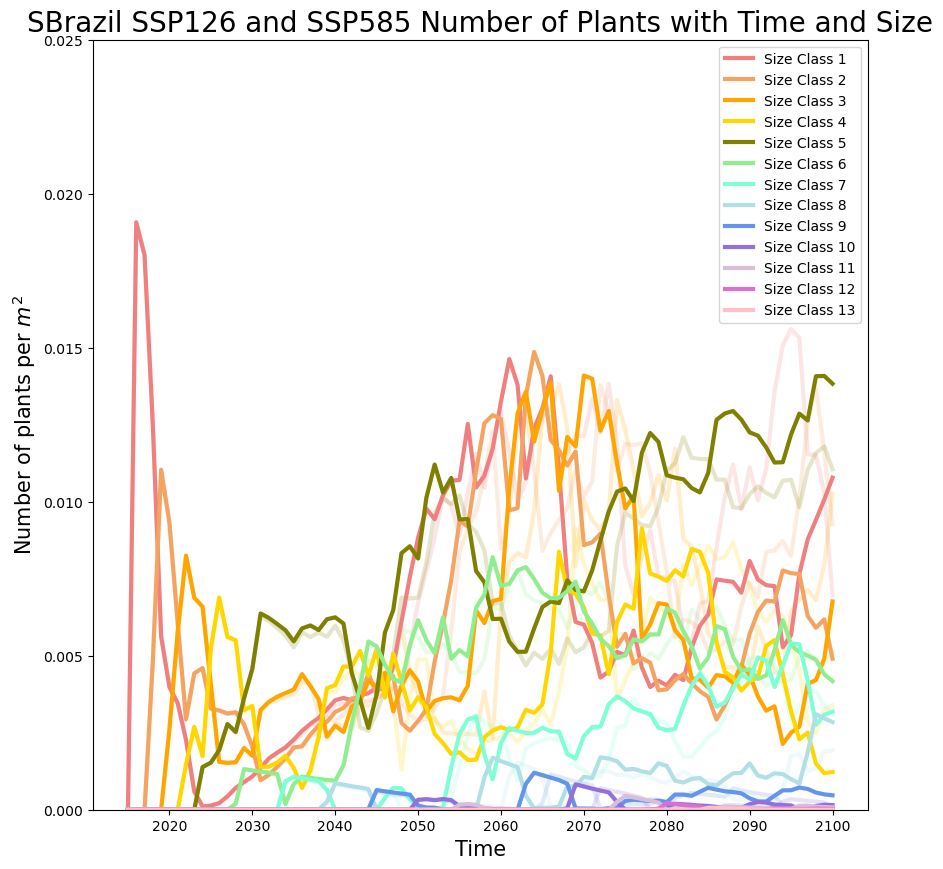

In [372]:
#separating pft's
pft1 = sbrazil_ssp126.sel(fates_levscls=slice(0,0))
sbrazil126pft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_ssp126.sel(fates_levscls=slice(5,5))
sbrazil126pft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_ssp126.sel(fates_levscls=slice(10,10))
sbrazil126pft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_ssp126.sel(fates_levscls=slice(15,15))
sbrazil126pft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_ssp126.sel(fates_levscls=slice(20,20))
sbrazil126pft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_ssp126.sel(fates_levscls=slice(30,30))
sbrazil126pft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_ssp126.sel(fates_levscls=slice(40,40))
sbrazil126pft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_ssp126.sel(fates_levscls=slice(50,50))
sbrazil126pft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_ssp126.sel(fates_levscls=slice(60,60))
sbrazil126pft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_ssp126.sel(fates_levscls=slice(70,70))
sbrazil126pft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_ssp126.sel(fates_levscls=slice(80,80))
sbrazil126pft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_ssp126.sel(fates_levscls=slice(90,90))
sbrazil126pft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_ssp126.sel(fates_levscls=slice(100,100))
sbrazil126pft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#separating pft's
pft1 = sbrazil_ssp585.sel(fates_levscls=slice(0,0))
sbrazil585pft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_ssp585.sel(fates_levscls=slice(5,5))
sbrazil585pft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_ssp585.sel(fates_levscls=slice(10,10))
sbrazil585pft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_ssp585.sel(fates_levscls=slice(15,15))
sbrazil585pft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_ssp585.sel(fates_levscls=slice(20,20))
sbrazil585pft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_ssp585.sel(fates_levscls=slice(30,30))
sbrazil585pft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_ssp585.sel(fates_levscls=slice(40,40))
sbrazil585pft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_ssp585.sel(fates_levscls=slice(50,50))
sbrazil585pft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_ssp585.sel(fates_levscls=slice(60,60))
sbrazil585pft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_ssp585.sel(fates_levscls=slice(70,70))
sbrazil585pft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_ssp585.sel(fates_levscls=slice(80,80))
sbrazil585pft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_ssp585.sel(fates_levscls=slice(90,90))
sbrazil585pft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_ssp585.sel(fates_levscls=slice(100,100))
sbrazil585pft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazil126time, sbrazil126pft1, color='lightcoral', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft2, color='sandybrown', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft3, color='orange', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft4, color='gold', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft5, color='olive', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft6, color='lightgreen', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft7, color='aquamarine', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft8, color='powderblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft9, color='cornflowerblue', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft10, color='mediumpurple', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft11, color='thistle', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft12, color='orchid', linewidth=3, alpha=0.2)
plt.plot(sbrazil126time, sbrazil126pft13, color='pink', linewidth=3, alpha=0.2)
plt.plot(sbrazil585time, sbrazil585pft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazil585time, sbrazil585pft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,0.025)
ax.set_ylabel("Number of plants per $m^2$", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil SSP126 and SSP585 Number of Plants with Time and Size",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_SBrazil_ssp126+585_Number_Time_Size.png", dpi=300, bbox_inches='tight')
#the transparent lines are SSP126 and the opaque lines are SSP585
#the higher emissions pathway results in higher # of plants at 2070 for the most part

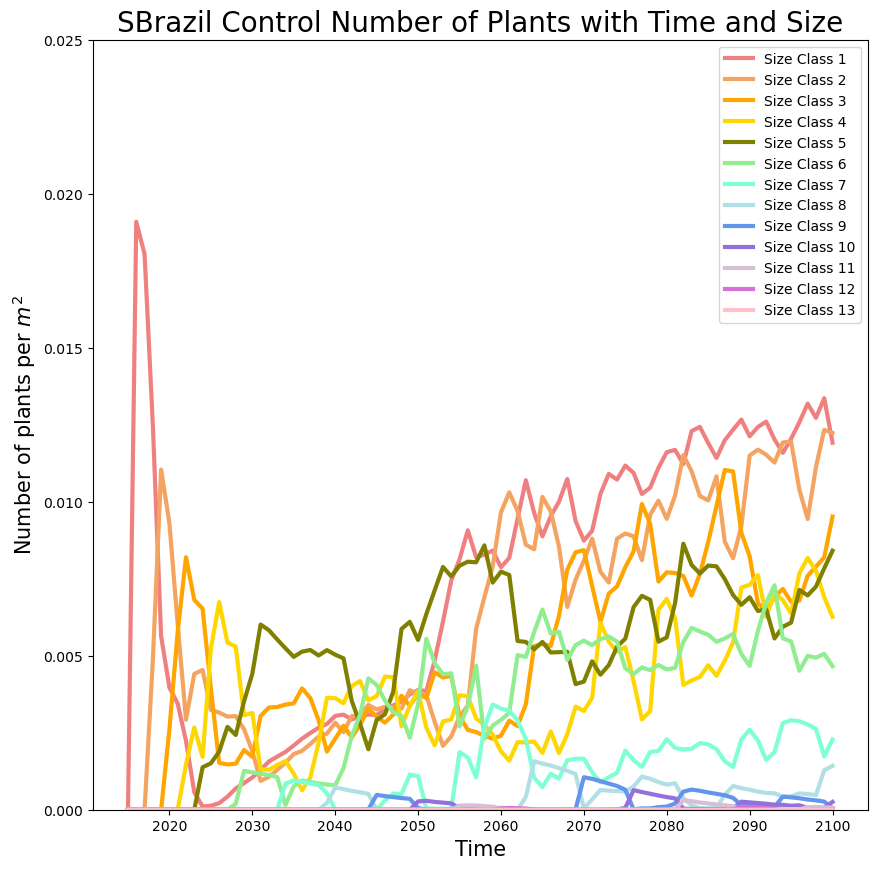

In [373]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levscls=slice(0,0))
sbrazilpft1 = (pft1.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_none.sel(fates_levscls=slice(5,5))
sbrazilpft2 = (pft2.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_none.sel(fates_levscls=slice(10,10))
sbrazilpft3 = (pft3.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_none.sel(fates_levscls=slice(15,15))
sbrazilpft4 = (pft4.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_none.sel(fates_levscls=slice(20,20))
sbrazilpft5 = (pft5.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_none.sel(fates_levscls=slice(30,30))
sbrazilpft6 = (pft6.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_none.sel(fates_levscls=slice(40,40))
sbrazilpft7 = (pft7.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_none.sel(fates_levscls=slice(50,50))
sbrazilpft8 = (pft8.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_none.sel(fates_levscls=slice(60,60))
sbrazilpft9 = (pft9.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_none.sel(fates_levscls=slice(70,70))
sbrazilpft10 = (pft10.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_none.sel(fates_levscls=slice(80,80))
sbrazilpft11 = (pft11.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_none.sel(fates_levscls=slice(90,90))
sbrazilpft12 = (pft12.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_none.sel(fates_levscls=slice(100,100))
sbrazilpft13 = (pft13.FATES_NPLANT_SZ.mean(dim="fates_levscls"))
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
plt.ylim(0,0.025)
ax.set_ylabel("Number of plants per $m^2$", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil Control Number of Plants with Time and Size",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_SBrazil_Control_Number_Time_Size.png", dpi=300, bbox_inches='tight')

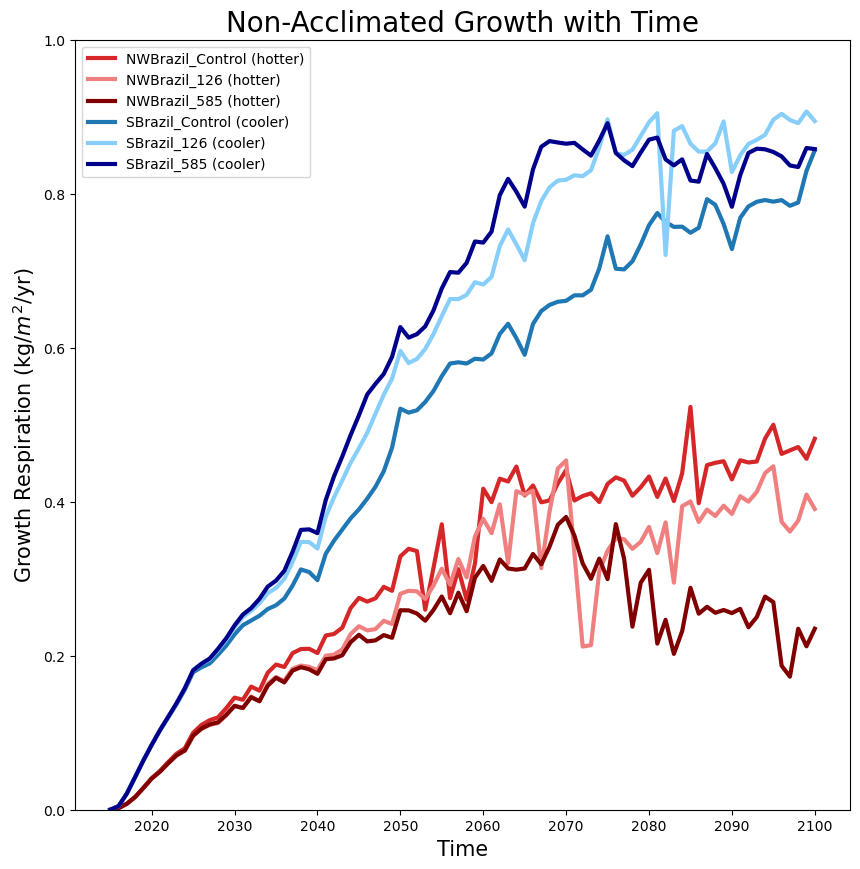

In [600]:
#plotting growth with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_GROWTH_RESP*86400*365, label="NWBrazil_Control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_GROWTH_RESP*86400*365, label="NWBrazil_126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_GROWTH_RESP*86400*365, label="NWBrazil_585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_GROWTH_RESP*86400*365, label="SBrazil_Control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_GROWTH_RESP*86400*365, label="SBrazil_126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_GROWTH_RESP*86400*365, label="SBrazil_585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,1)
ax.set_ylabel("Growth Respiration (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Growth with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Growth_Time.png", dpi=300, bbox_inches='tight')

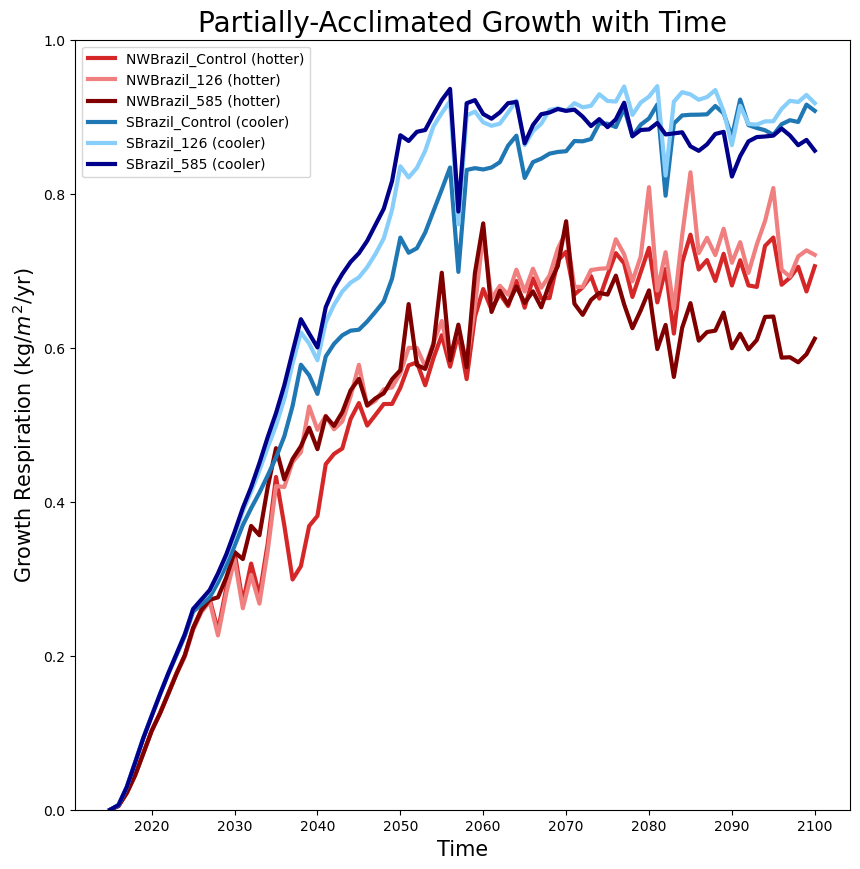

In [9]:
#plotting growth with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_GROWTH_RESP*86400*365, label="NWBrazil_Control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_GROWTH_RESP*86400*365, label="NWBrazil_126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_GROWTH_RESP*86400*365, label="NWBrazil_585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_GROWTH_RESP*86400*365, label="SBrazil_Control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_GROWTH_RESP*86400*365, label="SBrazil_126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_GROWTH_RESP*86400*365, label="SBrazil_585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,1)
ax.set_ylabel("Growth Respiration (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Growth with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PGrowth_Time.png", dpi=300, bbox_inches='tight')

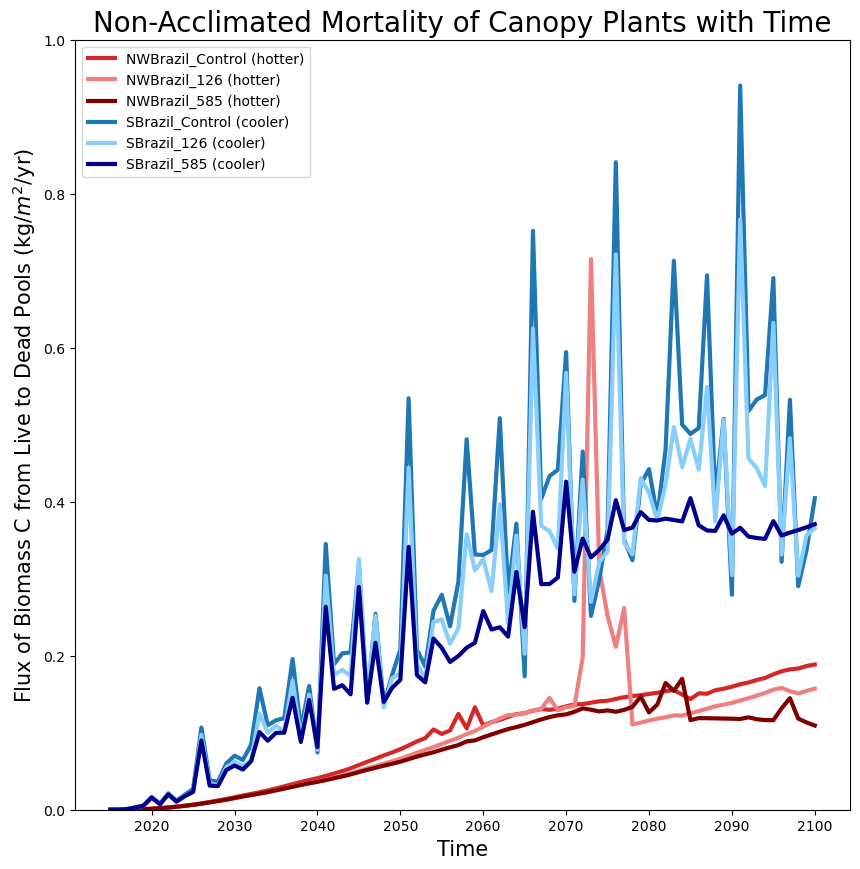

In [604]:
#plotting mortality with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_Control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_Control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,1)
ax.set_ylabel("Flux of Biomass C from Live to Dead Pools (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Mortality of Canopy Plants with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Mortality_Canopy_Time.png", dpi=300, bbox_inches='tight')

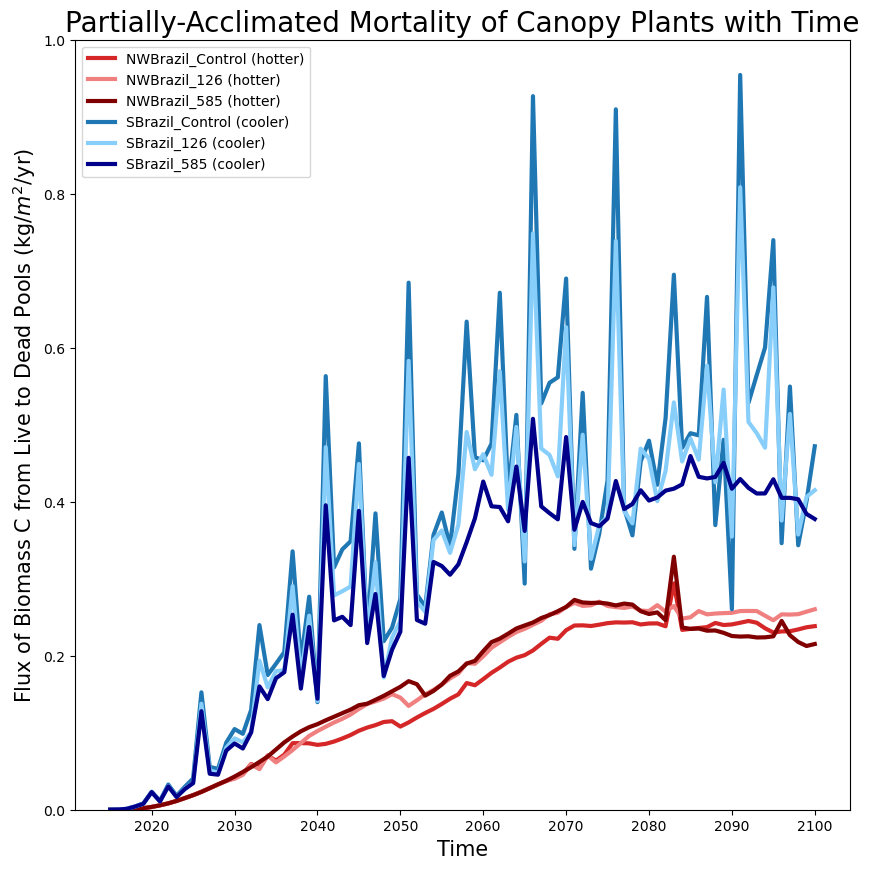

In [20]:
#plotting mortality with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_Control (hotter)", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="NWBrazil_585 (hotter)", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_Control (cooler)", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_MORTALITY_CFLUX_CANOPY*86400*365, label="SBrazil_585 (cooler)", color='darkblue', linewidth=3)
plt.ylim(0,1)
ax.set_ylabel("Flux of Biomass C from Live to Dead Pools (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Mortality of Canopy Plants with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PMortality_Canopy_Time.png", dpi=300, bbox_inches='tight')

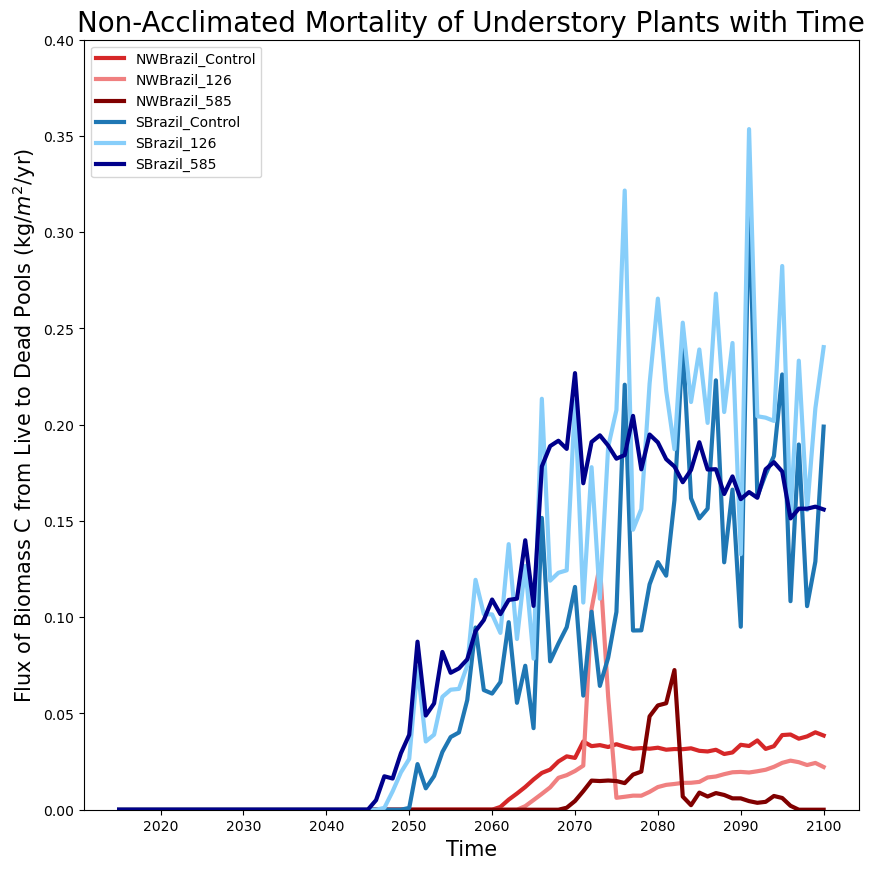

In [607]:
#plotting mortality with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_585", color='darkblue', linewidth=3)
plt.ylim(0,0.4)
ax.set_ylabel("Flux of Biomass C from Live to Dead Pools (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Mortality of Understory Plants with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Mortality_UStory_Time.png", dpi=300, bbox_inches='tight')

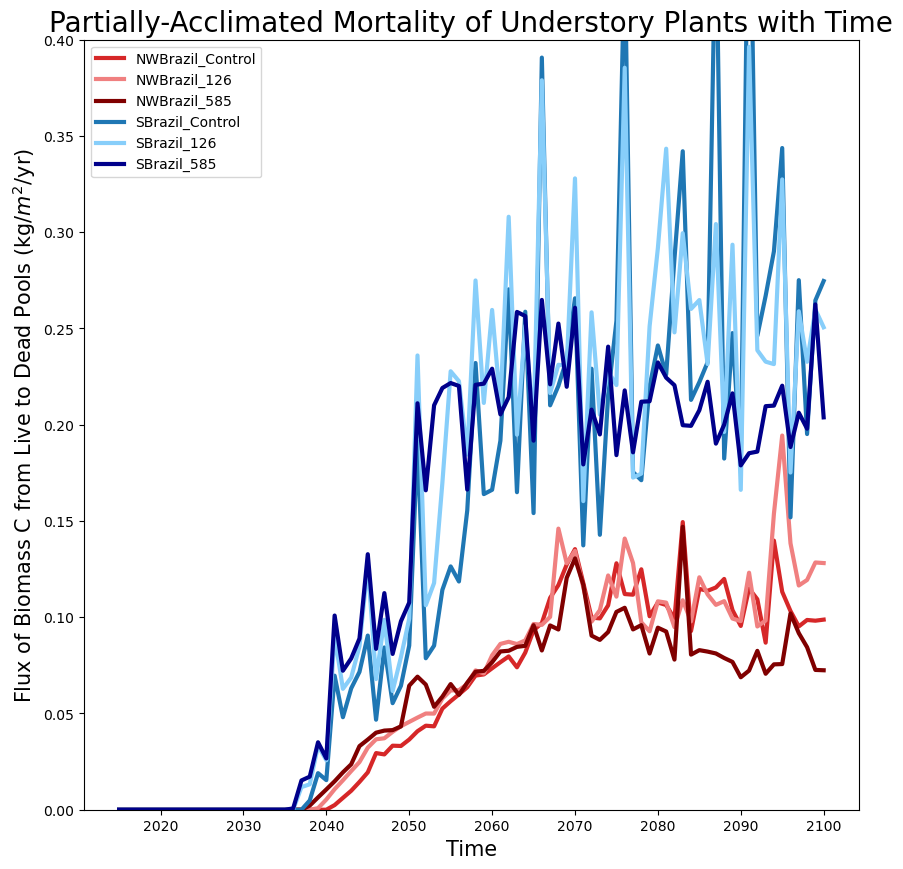

In [21]:
#plotting mortality with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_MORTALITY_CFLUX_USTORY*86400*365, label="SBrazil_585", color='darkblue', linewidth=3)
plt.ylim(0,0.4)
ax.set_ylabel("Flux of Biomass C from Live to Dead Pools (kg/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Mortality of Understory Plants with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PMortality_UStory_Time.png", dpi=300, bbox_inches='tight')

In [395]:
nwbrazil_none.FLDS

<xarray.DataArray 'FLDS' (time: 86, lndgrid: 1)>
[86 values with dtype=float32]
Coordinates:
  * time     (time) object 2015-01-01 00:00:00 ... 2100-01-01 00:00:00
Dimensions without coordinates: lndgrid
Attributes:
    long_name:      atmospheric longwave radiation (downscaled to columns in ...
    units:          W/m^2
    cell_methods:   time: mean
    landunit_mask:  unknown

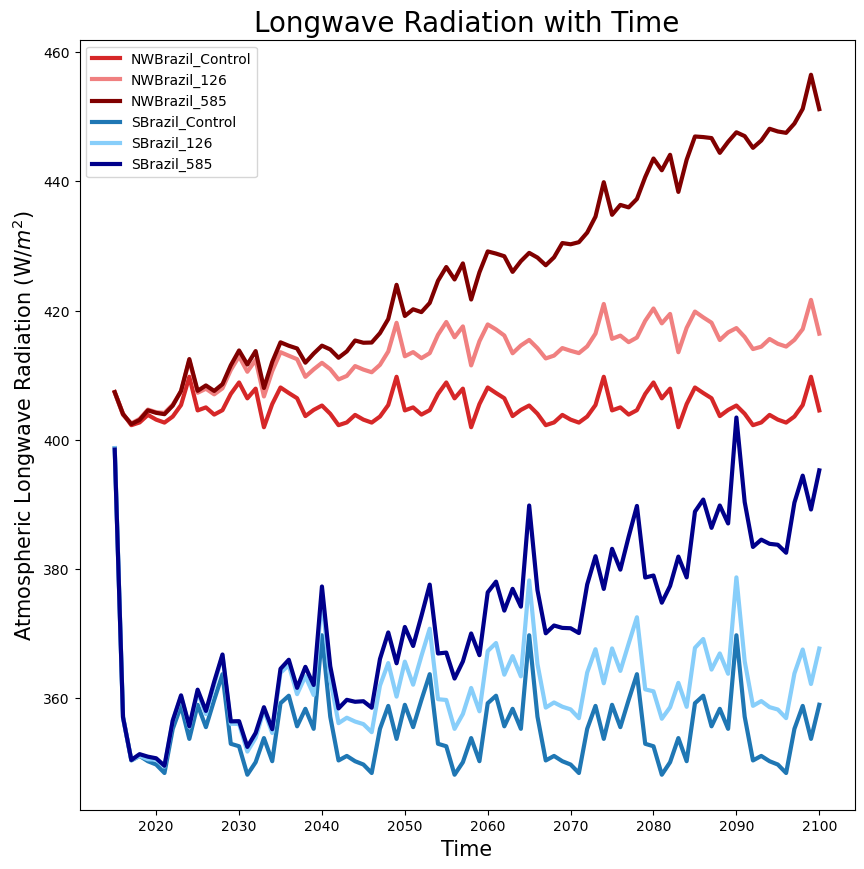

In [396]:
#plotting longwave radiation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FLDS, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FLDS, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FLDS, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FLDS, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FLDS, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FLDS, label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.4)
ax.set_ylabel("Atmospheric Longwave Radiation (W/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Longwave Radiation with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_FLDS_Time.png", dpi=300, bbox_inches='tight')

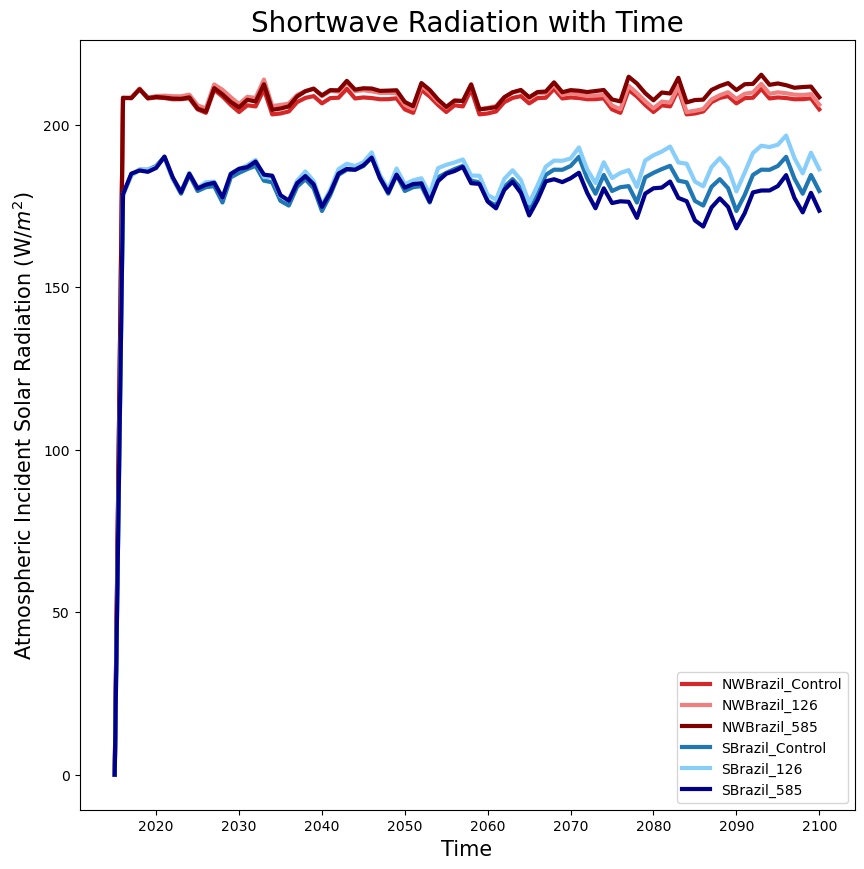

In [399]:
#plotting shortwave radiation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FSDS, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FSDS, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FSDS, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FSDS, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FSDS, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FSDS, label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.4)
ax.set_ylabel("Atmospheric Incident Solar Radiation (W/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Shortwave Radiation with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_FSDS_Time.png", dpi=300, bbox_inches='tight')

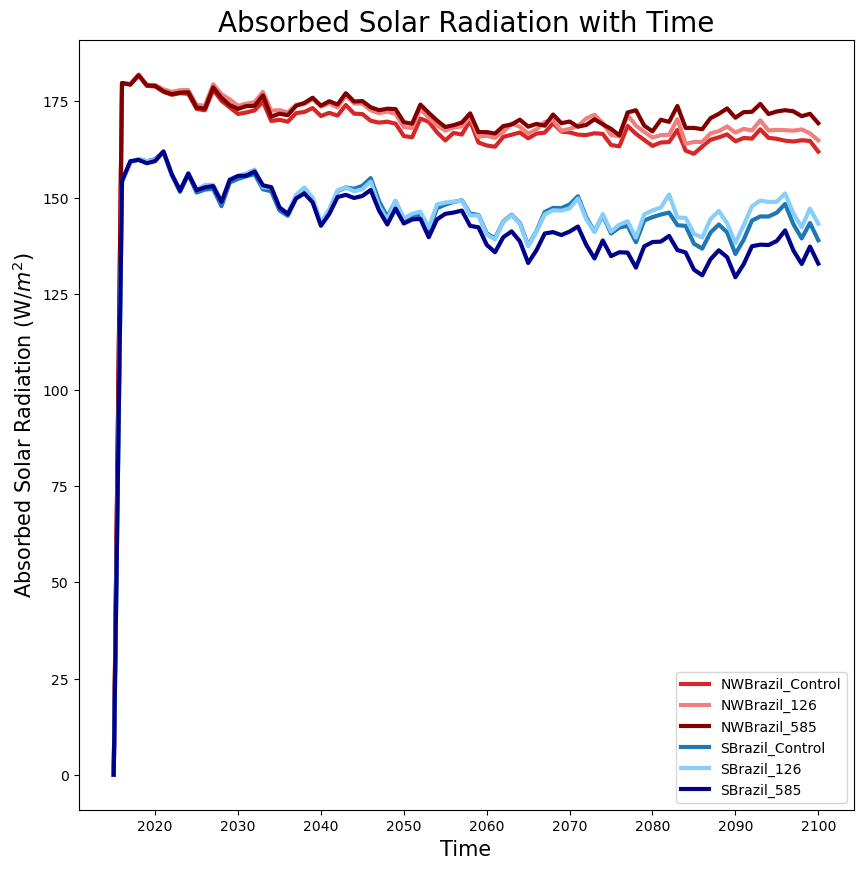

In [400]:
#plotting shortwave radiation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FSA, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FSA, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FSA, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FSA, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FSA, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FSA, label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.4)
ax.set_ylabel("Absorbed Solar Radiation (W/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Absorbed Solar Radiation with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_FSA_Time.png", dpi=300, bbox_inches='tight')

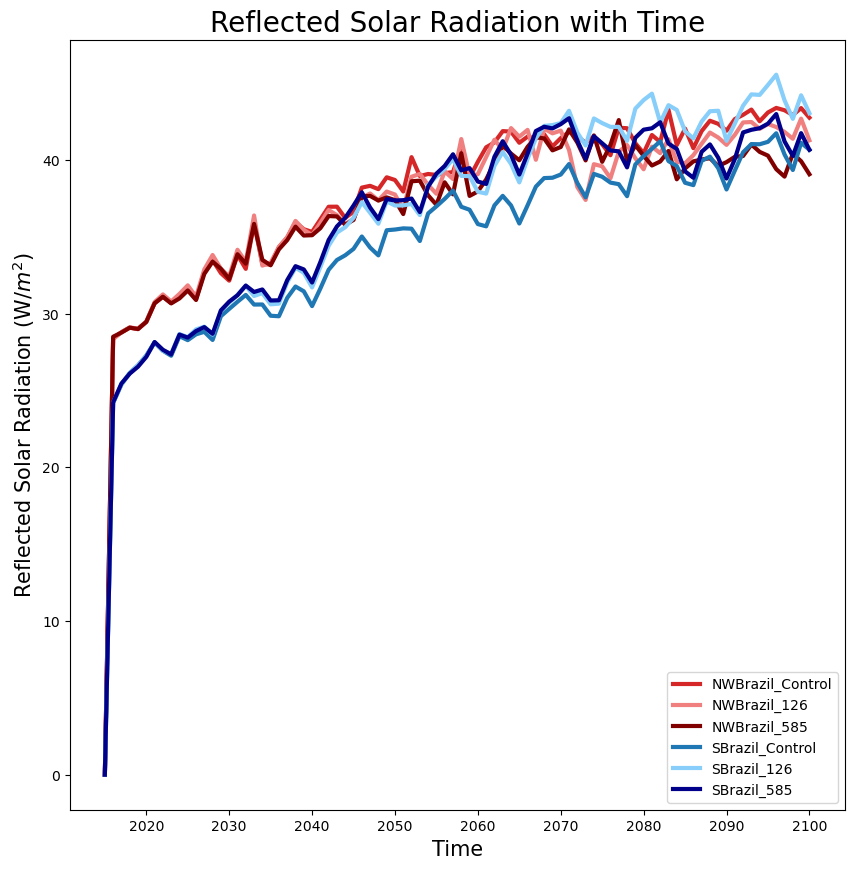

In [401]:
#plotting shortwave radiation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazilnonetime, nwbrazil_none.FSR, label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FSR, label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil585time, nwbrazil_ssp585.FSR, label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FSR, label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FSR, label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FSR, label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.4)
ax.set_ylabel("Reflected Solar Radiation (W/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Reflected Solar Radiation with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_FSR_Time.png", dpi=300, bbox_inches='tight')

In [410]:
print(nwbrazil_none.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))
print(nwbrazil_ssp126.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))
print(nwbrazil_ssp585.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_none.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_ssp126.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_ssp585.FATES_MORTALITY_BACKGROUND_SZ.sum(dim=['time','fates_levscls']))

<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.0239766], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.02058746], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.01729431], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.02772972], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.0310199], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_BACKGROUND_SZ' (lndgrid: 1)>
array([0.03012792], dtype=float32)
Dimensions without coordinates: lndgrid


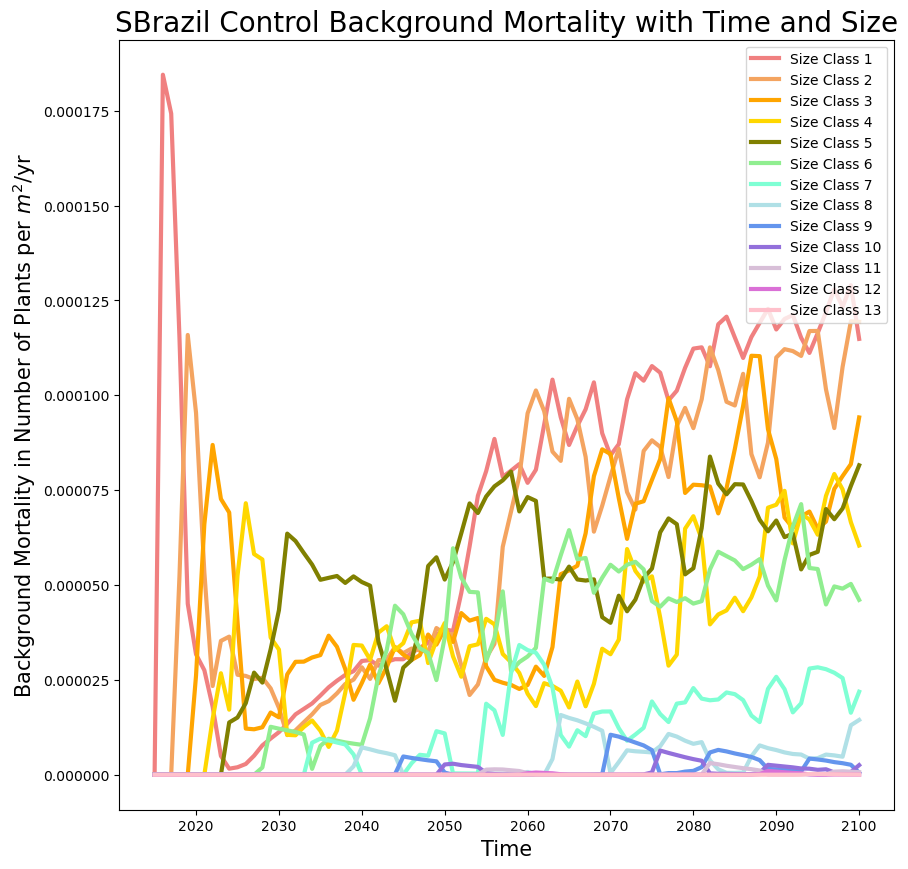

In [407]:
#separating pft's
pft1 = sbrazil_none.sel(fates_levscls=slice(0,0))
sbrazilpft1 = (pft1.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft2 = sbrazil_none.sel(fates_levscls=slice(5,5))
sbrazilpft2 = (pft2.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft3 = sbrazil_none.sel(fates_levscls=slice(10,10))
sbrazilpft3 = (pft3.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft4 = sbrazil_none.sel(fates_levscls=slice(15,15))
sbrazilpft4 = (pft4.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft5 = sbrazil_none.sel(fates_levscls=slice(20,20))
sbrazilpft5 = (pft5.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft6 = sbrazil_none.sel(fates_levscls=slice(30,30))
sbrazilpft6 = (pft6.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft7 = sbrazil_none.sel(fates_levscls=slice(40,40))
sbrazilpft7 = (pft7.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft8 = sbrazil_none.sel(fates_levscls=slice(50,50))
sbrazilpft8 = (pft8.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft9 = sbrazil_none.sel(fates_levscls=slice(60,60))
sbrazilpft9 = (pft9.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft10 = sbrazil_none.sel(fates_levscls=slice(70,70))
sbrazilpft10 = (pft10.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft11 = sbrazil_none.sel(fates_levscls=slice(80,80))
sbrazilpft11 = (pft11.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft12 = sbrazil_none.sel(fates_levscls=slice(90,90))
sbrazilpft12 = (pft12.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
pft13 = sbrazil_none.sel(fates_levscls=slice(100,100))
sbrazilpft13 = (pft13.FATES_MORTALITY_BACKGROUND_SZ.mean(dim="fates_levscls"))
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(sbrazilnonetime, sbrazilpft1, label="Size Class 1", color='lightcoral', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft2, label="Size Class 2", color='sandybrown', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft3, label="Size Class 3", color='orange', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft4, label="Size Class 4", color='gold', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft5, label="Size Class 5", color='olive', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft6, label="Size Class 6", color='lightgreen', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft7, label="Size Class 7", color='aquamarine', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft8, label="Size Class 8", color='powderblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft9, label="Size Class 9", color='cornflowerblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft10, label="Size Class 10", color='mediumpurple', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft11, label="Size Class 11", color='thistle', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft12, label="Size Class 12", color='orchid', linewidth=3)
plt.plot(sbrazilnonetime, sbrazilpft13, label="Size Class 13", color='pink', linewidth=3)
#plt.ylim(0,0.025)
ax.set_ylabel("Background Mortality in Number of Plants per $m^2$/yr", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("SBrazil Control Background Mortality with Time and Size",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_SBrazil_Control_Background_Mortality_Time_Size.png", dpi=300, bbox_inches='tight')

In [411]:
print(nwbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))
print(nwbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))
print(nwbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))
print(sbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim=['time','fates_levscls']))

#NWBrazil has highest carbon starvation mortality with highest emissions even though that path has fewest plants overall

<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([0.00067494], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([0.00613244], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([0.00755541], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([2.7458323e-06], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([5.702234e-06], dtype=float32)
Dimensions without coordinates: lndgrid
<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (lndgrid: 1)>
array([2.722597e-06], dtype=float32)
Dimensions without coordinates: lndgrid


In [412]:
sbrazil_none.FATES_MORTALITY_CSTARV_SZ

<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (time: 86, fates_levscls: 13,
                                               lndgrid: 1)>
array([[[0.000000e+00],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       [[0.000000e+00],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       ...,

       [[7.702609e-08],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       [[8.352639e-09],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]]], dtype=float32)
Coordinates:
  * fates_levscls  (fates_levscls) float32 0.0 5.0 10.0 15.0 ... 80.0 90.0 100.0
  * time           (time) object 2015-01-01 00:00:00 ... 2100-01-01 00:00:00
Dimensions without coordinates: lndgrid
Attributes:
    long_name:      carbon starvation mortality by size in number of plants p...
    units:          m-2 yr-1
    cell_methods:   time: mean
    landunit_mask:  unknown

In [413]:
sbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')

<xarray.DataArray 'FATES_MORTALITY_CSTARV_SZ' (time: 86, lndgrid: 1)>
array([[0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [4.51921356e-12],
       [1.39757395e-09],
       [8.19280110e-09],
       [9.22988530e-09],
       [3.40277095e-09],
       [9.55310053e-09],
       [7.47513695e-09],
       [1.25654143e-09],
       [1.06939346e-08],
       [7.84764964e-09],
       [1.91674714e-11],
...
       [2.59063047e-08],
       [1.79506348e-08],
       [2.27009771e-08],
       [2.04568407e-09],
       [2.08458779e-08],
       [3.46169893e-09],
       [4.18745465e-08],
       [6.92502979e-08],
       [4.22556781e-08],
       [1.24370146e-07],
       [7.24422364e-07],
       [2.35449189e-08],
       [6.46590408e-08],
       [2.10978679e-09],
       [7.17058413e-09],
       [1.89148803e-08],
       [2.21793850e-09],
       [3.41458168e-08],
       [1.16940321e-07],
       [2.82972046e-09]], dtype=float32)
Coordinates:
  * time     (time) object 2015-01-01 00:00:00 ... 2100-01-01 00:00:00
Dimensions without coordinates: lndgrid

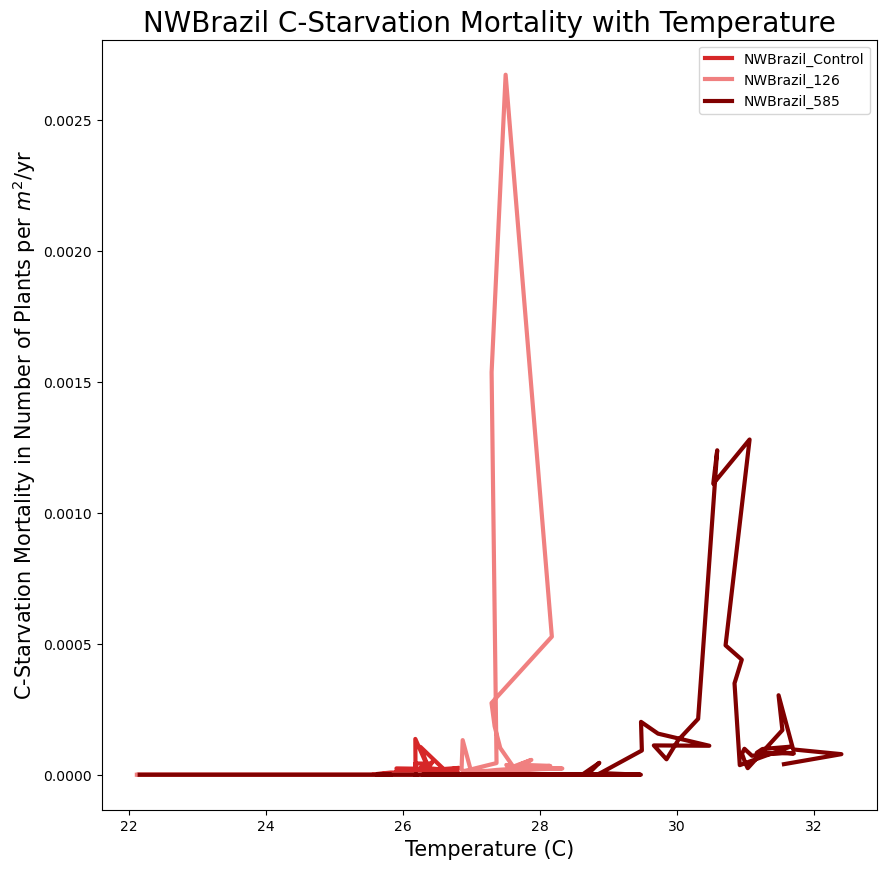

In [422]:
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil_none_temp, nwbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_Control", color='tab:red', linewidth=3)
plt.plot(nwbrazil_ssp126_temp, nwbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_126", color='lightcoral', linewidth=3)
plt.plot(nwbrazil_ssp585_temp, nwbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_585", color='maroon', linewidth=3)
#plt.plot(sbrazil_none_temp, sbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_Control", color='tab:blue', linewidth=3)
#plt.plot(sbrazil_ssp126_temp, sbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_126", color='lightskyblue', linewidth=3)
#plt.plot(sbrazil_ssp585_temp, sbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.025)
ax.set_ylabel("C-Starvation Mortality in Number of Plants per $m^2$/yr", size=15)
ax.set_xlabel("Temperature (C)", size=15)
ax.set_title("NWBrazil C-Starvation Mortality with Temperature",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_NWBrazil_C-Starvation_Mortality_Temperature.png", dpi=300, bbox_inches='tight')

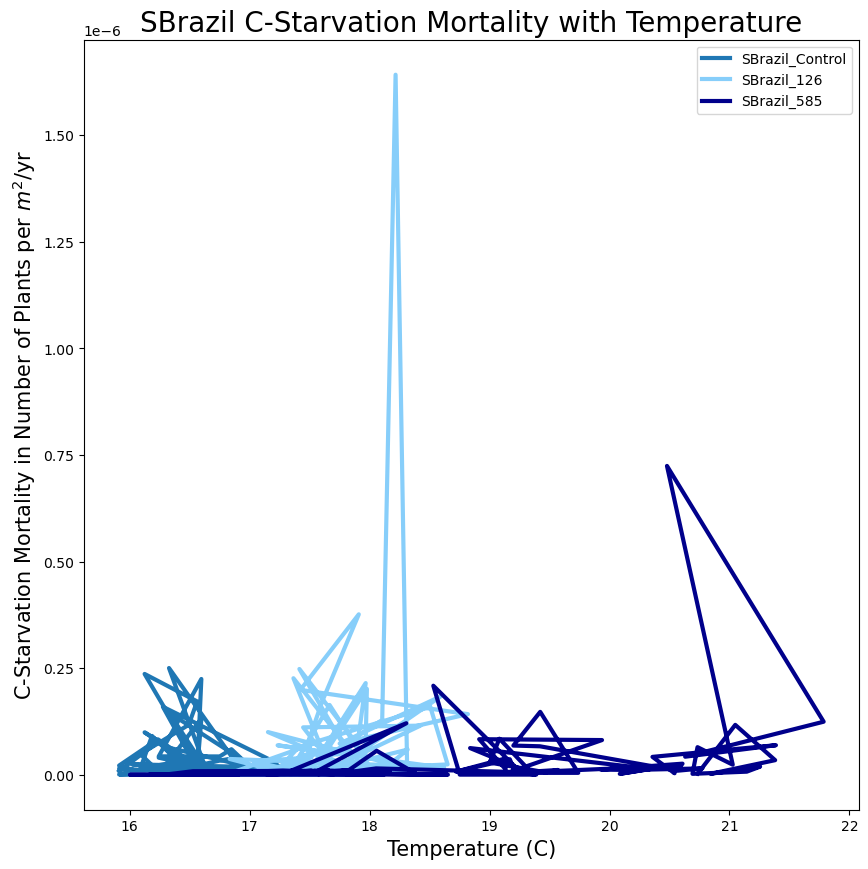

In [423]:
#plotting number of plants by size class with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
#plt.plot(nwbrazil_none_temp, nwbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_Control", color='tab:red', linewidth=3)
#plt.plot(nwbrazil_ssp126_temp, nwbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_126", color='lightcoral', linewidth=3)
#plt.plot(nwbrazil_ssp585_temp, nwbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="NWBrazil_585", color='maroon', linewidth=3)
plt.plot(sbrazil_none_temp, sbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_Control", color='tab:blue', linewidth=3)
plt.plot(sbrazil_ssp126_temp, sbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_126", color='lightskyblue', linewidth=3)
plt.plot(sbrazil_ssp585_temp, sbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls'), label="SBrazil_585", color='darkblue', linewidth=3)
#plt.ylim(0,0.025)
ax.set_ylabel("C-Starvation Mortality in Number of Plants per $m^2$/yr", size=15)
ax.set_xlabel("Temperature (C)", size=15)
ax.set_title("SBrazil C-Starvation Mortality with Temperature",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_SBrazil_C-Starvation_Mortality_Temperature.png", dpi=300, bbox_inches='tight')

In [592]:
nw585 = nwbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
nw126 = nwbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
nw0 = nwbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
s585 = sbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
s126 = sbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
s0 = sbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')

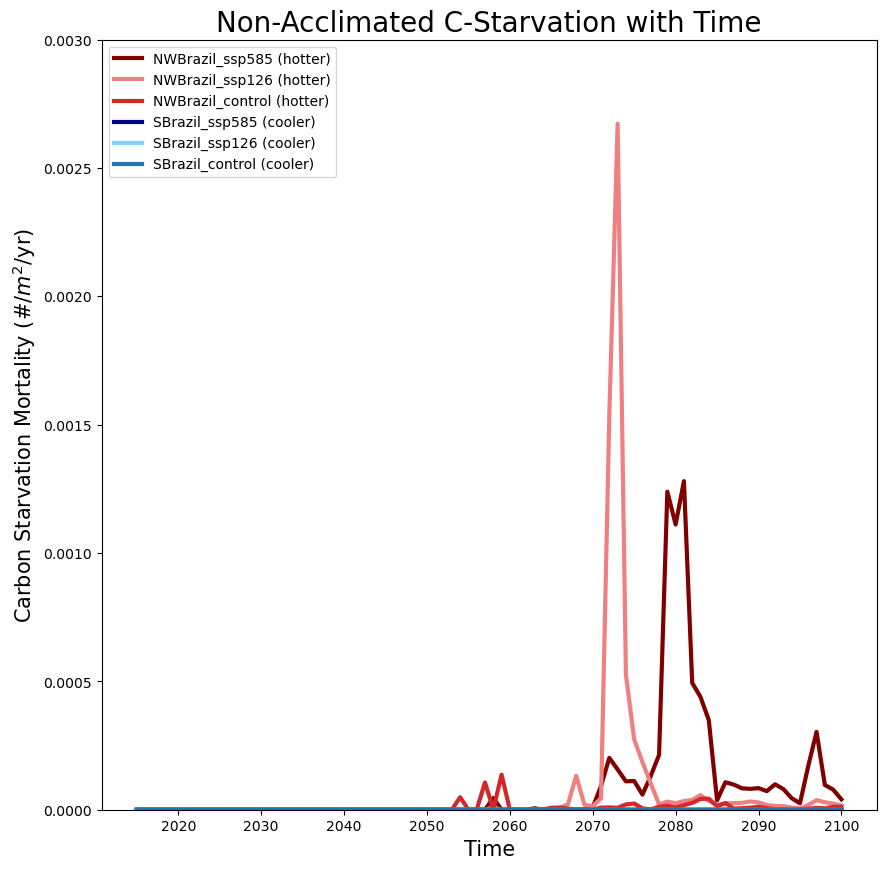

In [596]:
#plotting c-starvation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nw585, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nw126, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nw0, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, s585, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, s126, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, s0, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,0.003)
ax.set_ylabel("Carbon Starvation Mortality (#/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated C-Starvation with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_C-Starvation_Time_line.png", dpi=300, bbox_inches='tight')

In [11]:
pnw585 = pnwbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
pnw126 = pnwbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
pnw0 = pnwbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
ps585 = psbrazil_ssp585.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
ps126 = psbrazil_ssp126.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')
ps0 = psbrazil_none.FATES_MORTALITY_CSTARV_SZ.sum(dim='fates_levscls')

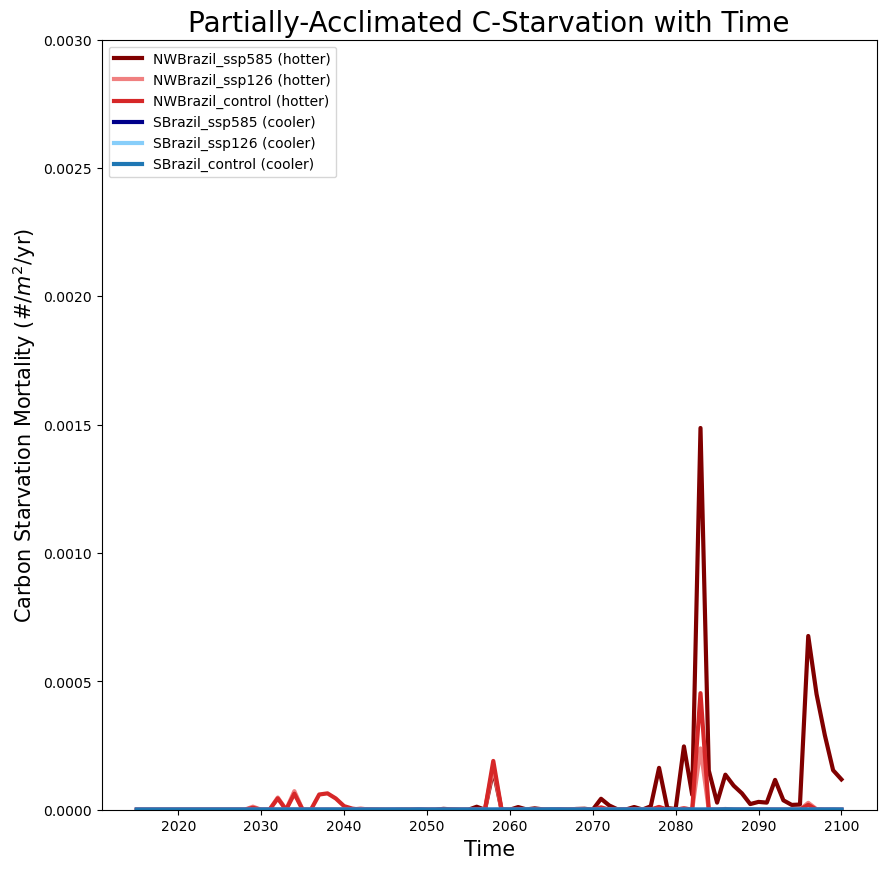

In [12]:
#plotting c-starvation with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, pnw585, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, pnw126, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, pnw0, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, ps585, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, ps126, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, ps0, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,0.003)
ax.set_ylabel("Carbon Starvation Mortality (#/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated C-Starvation with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PC-Starvation_Time_line.png", dpi=300, bbox_inches='tight')

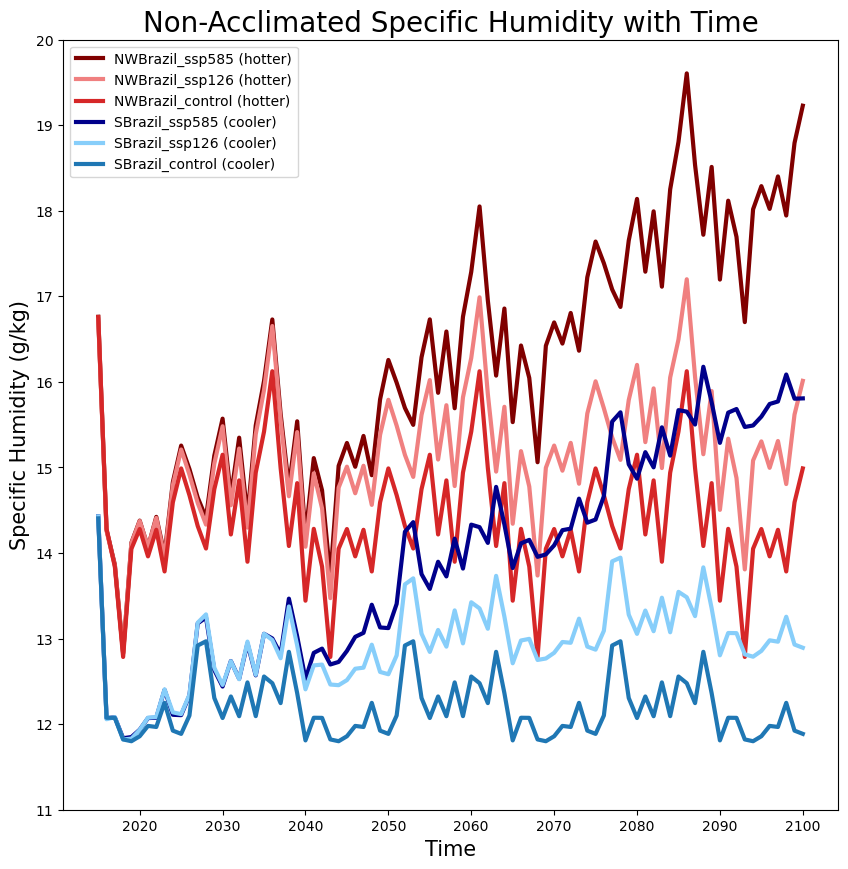

In [559]:
#plotting specific humidity with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.QBOT*1000, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.QBOT*1000, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.QBOT*1000, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.QBOT*1000, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.QBOT*1000, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.QBOT*1000, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(11,20)
ax.set_ylabel("Specific Humidity (g/kg)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Specific Humidity with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Q_Time_line.png", dpi=300, bbox_inches='tight')

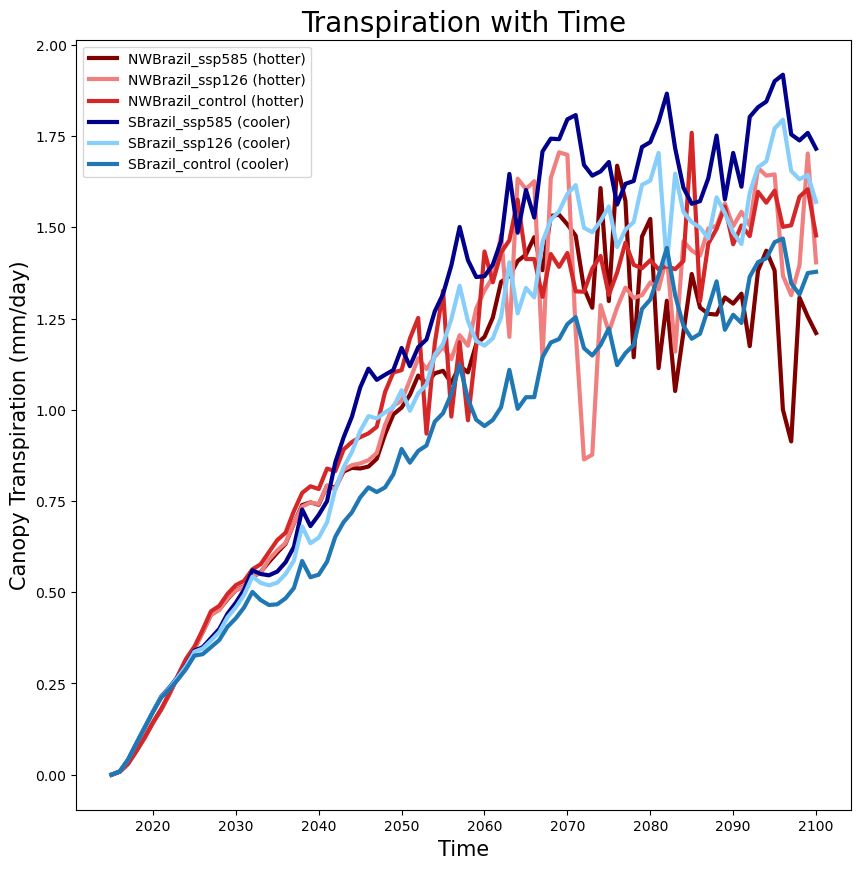

In [440]:
#plotting canopy transpiration with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.QVEGT*86400, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.QVEGT*86400, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.QVEGT*86400, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.QVEGT*86400, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.QVEGT*86400, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.QVEGT*86400, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
#plt.ylim(11,20)
ax.set_ylabel("Canopy Transpiration (mm/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Transpiration with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Transpiration_Time_line.png", dpi=300, bbox_inches='tight')
# number of plants do come into play as this grows over time

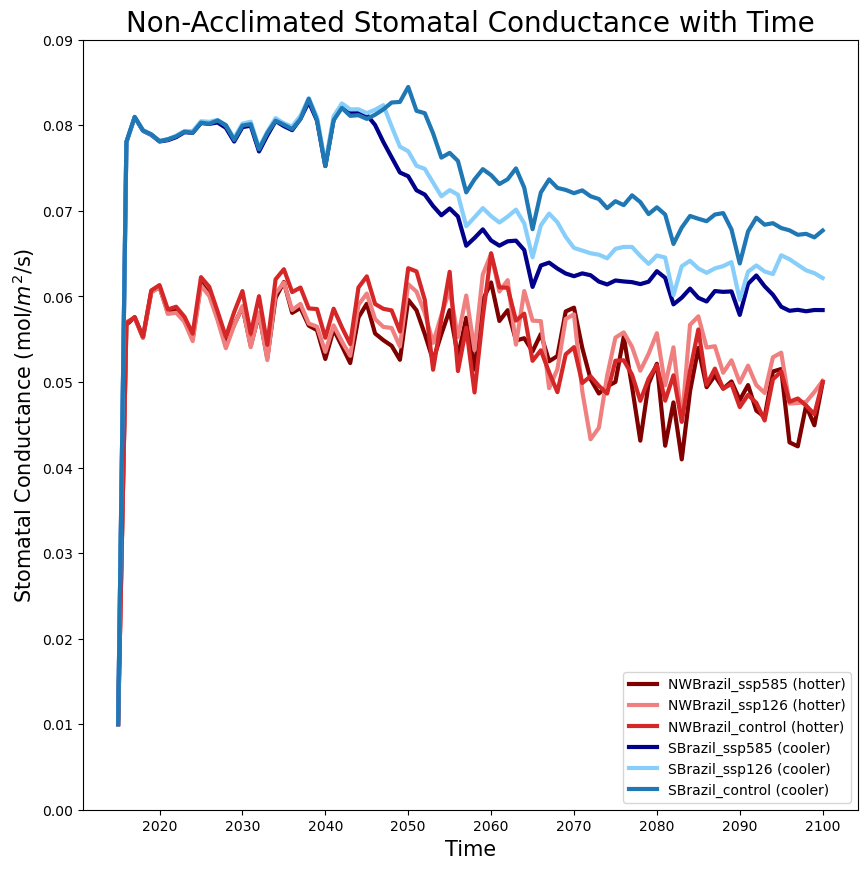

In [590]:
#plotting stomatal conductance with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_STOMATAL_COND, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_STOMATAL_COND, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_STOMATAL_COND, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_STOMATAL_COND, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_STOMATAL_COND, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_STOMATAL_COND, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,0.09)
ax.set_ylabel("Stomatal Conductance (mol/$m^2$/s)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Stomatal Conductance with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_StomatalConductance_Time_line.png", dpi=300, bbox_inches='tight')
# rate of gas exchange and transpiration through leaf stomata so a higher rate would mean the stomata are open longer, right?
# so as conductance increases, photosynthesis increases, but eventually conductance plateaus and photsynthesis may continue to increase
# here we see the cooler site has higher stomatal conductance at ANY scenario, which makes sense as that site has higher rates 
# of photosynthesis and more biomass so the stomata are open more often but they don't lose too much water as it's cooler out
# and they have just as much water as the hotter site (or more)
# we also see stomatal conductance decrease over time for either site at any scenario as photosynthesis begins to plateau a bit
# or at least not increase as heavily, but conductance is basically plateauing at whatever is optimal for the plants
# the hotter site never gets as high conductance as the cooler site so right away the stomata aren't opening as much
# number of plants dont come into play cuz starts high right away

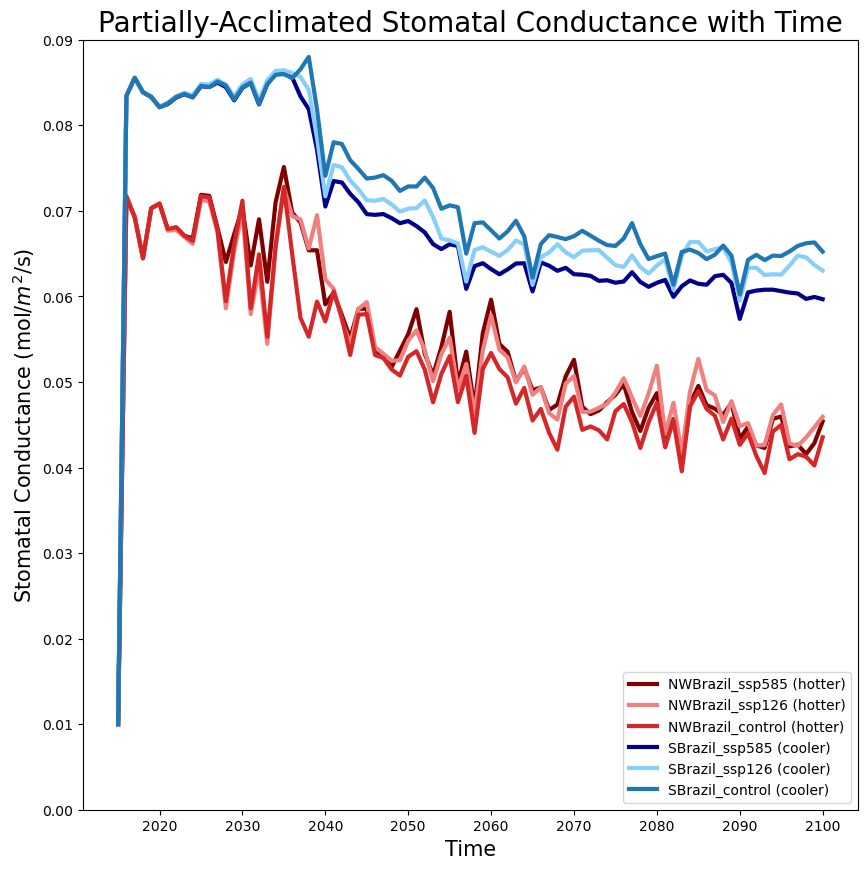

In [18]:
#plotting stomatal conductance with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_STOMATAL_COND, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_STOMATAL_COND, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_STOMATAL_COND, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_STOMATAL_COND, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_STOMATAL_COND, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_STOMATAL_COND, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,0.09)
ax.set_ylabel("Stomatal Conductance (mol/$m^2$/s)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Stomatal Conductance with Time",size=20)
ax.legend(loc='lower right')
plt.show()
fig.savefig("EL_PStomatalConductance_Time_line.png", dpi=300, bbox_inches='tight')

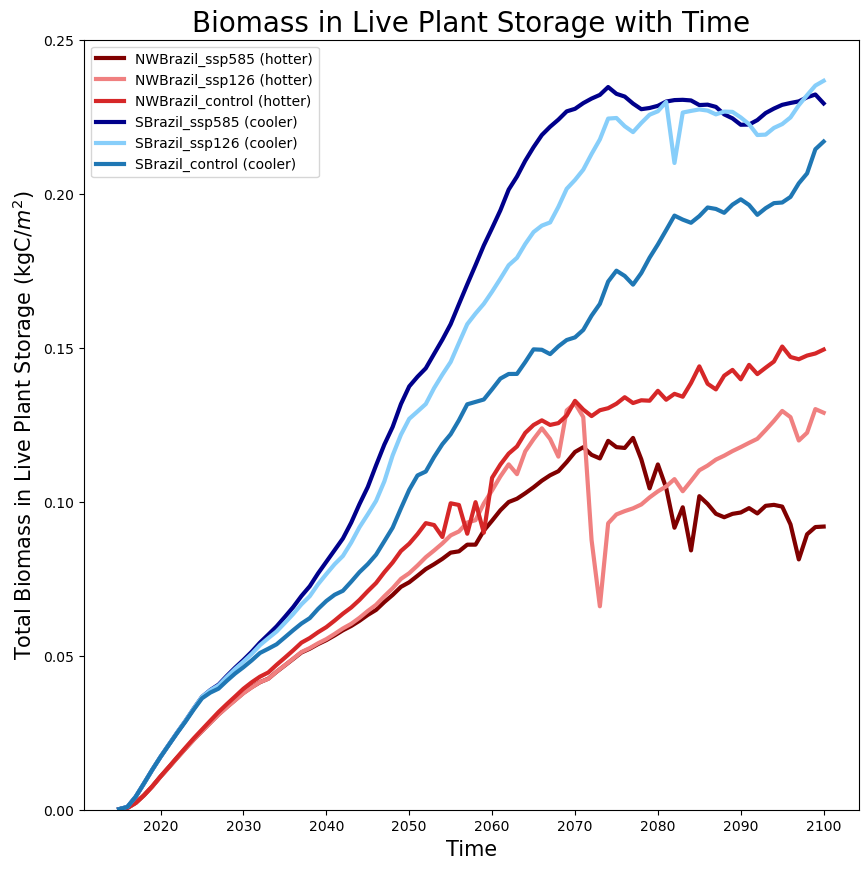

In [461]:
#plotting biomass in live plant storage with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_STOREC, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_STOREC, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_STOREC, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_STOREC, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_STOREC, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_STOREC, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,0.25)
ax.set_ylabel("Total Biomass in Live Plant Storage (kgC/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Biomass in Live Plant Storage with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PlantStorage_Time_line.png", dpi=300, bbox_inches='tight')
# is affected by number of plants
# same as biomass figure basically
# so cooler site is able to allocate more C to storage than the hotter site is

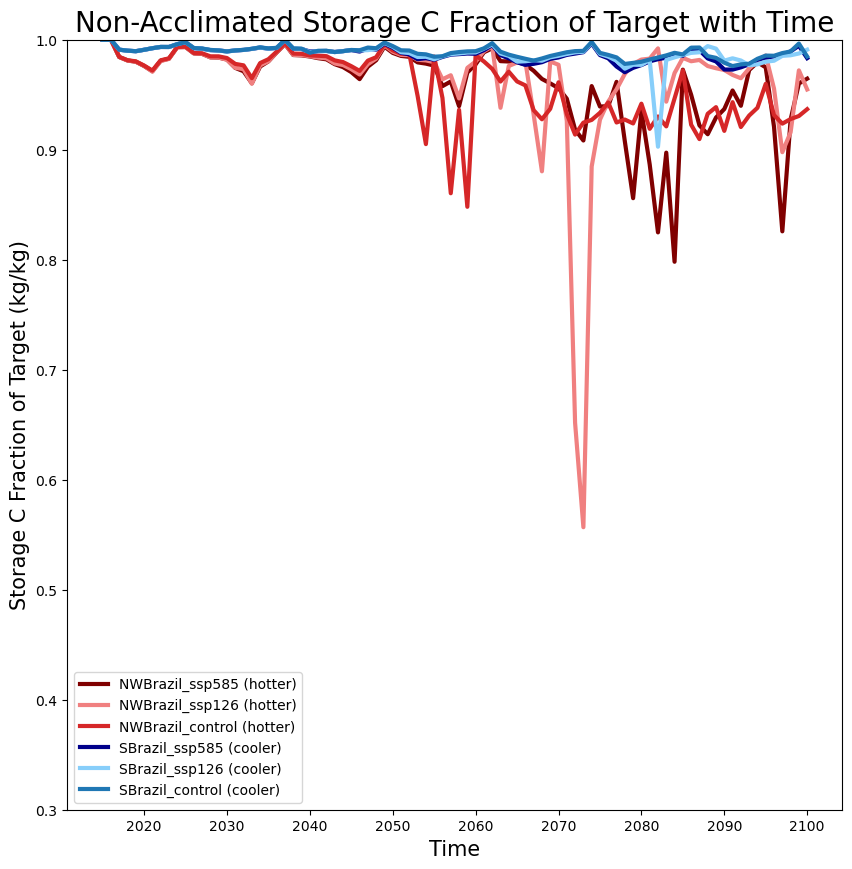

In [588]:
#plotting storage C fraction of target with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_STOREC_TF, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_STOREC_TF, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_STOREC_TF, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_STOREC_TF, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_STOREC_TF, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_STOREC_TF, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0.3,1)
ax.set_ylabel("Storage C Fraction of Target (kg/kg)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Storage C Fraction of Target with Time",size=20)
ax.legend(loc='lower left')
plt.show()
fig.savefig("EL_StorageFraction_Time_line.png", dpi=300, bbox_inches='tight')
# this is basically showing mortality spikes
# cooler site is close to 100% target the whole time (but has small dips of mortality still)
# hotter site has signficant drops in storage C during mortality peaks and is always farther from 100%

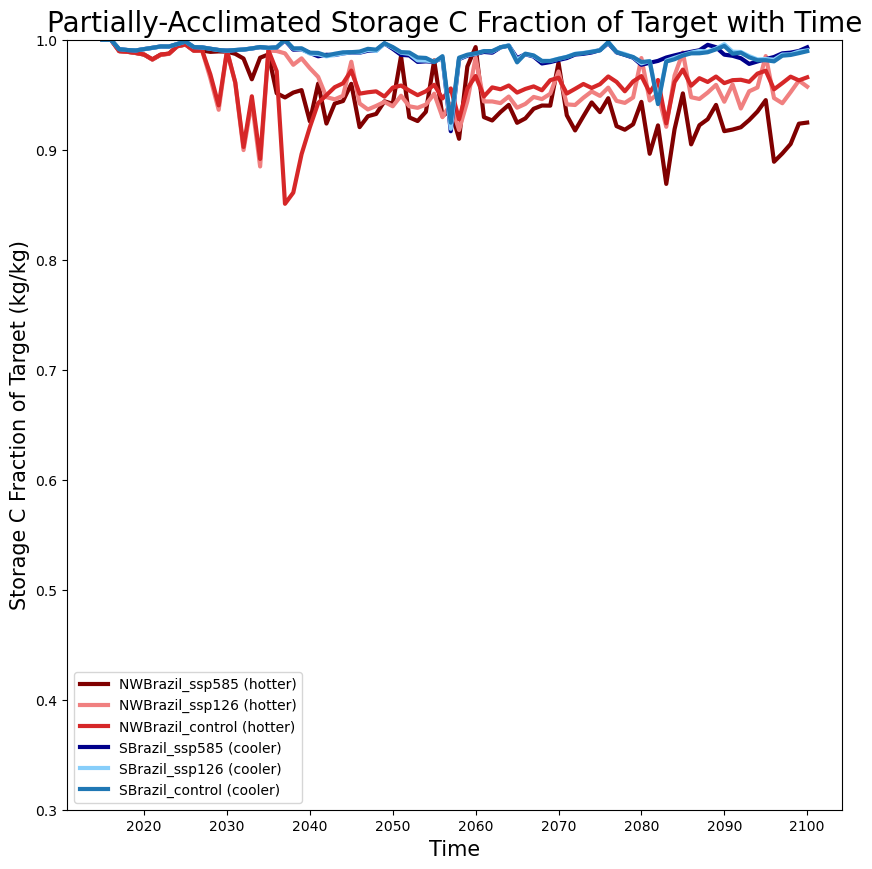

In [19]:
#plotting storage C fraction of target with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_STOREC_TF, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_STOREC_TF, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_STOREC_TF, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_STOREC_TF, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_STOREC_TF, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_STOREC_TF, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0.3,1)
ax.set_ylabel("Storage C Fraction of Target (kg/kg)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Storage C Fraction of Target with Time",size=20)
ax.legend(loc='lower left')
plt.show()
fig.savefig("EL_PStorageFraction_Time_line.png", dpi=300, bbox_inches='tight')

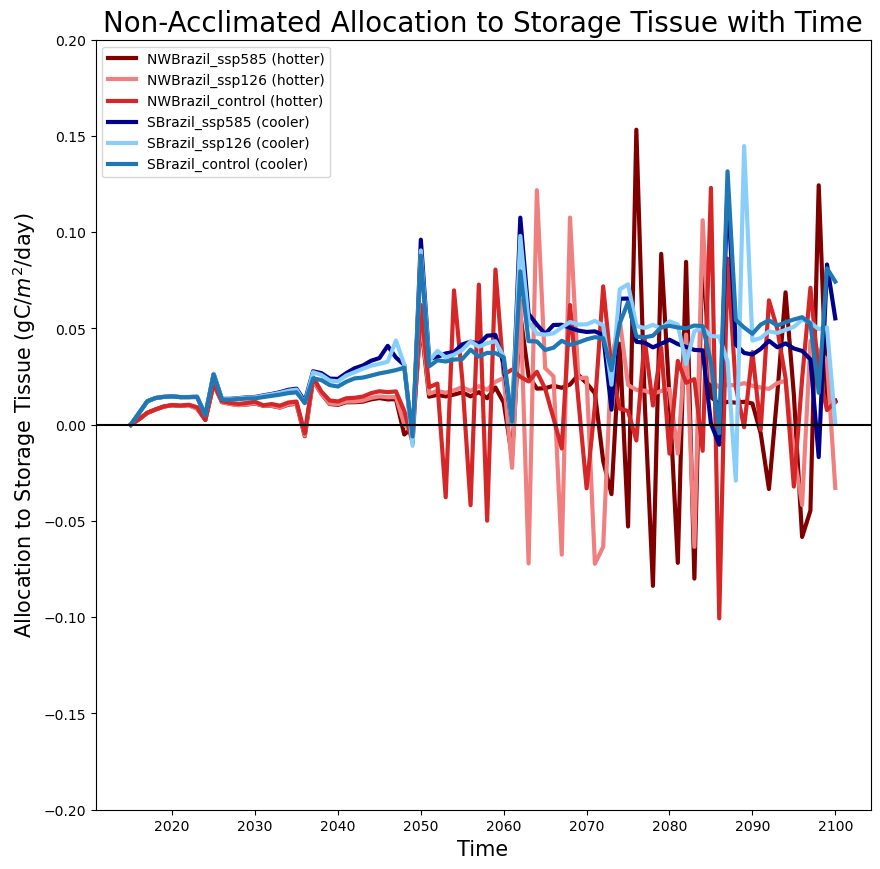

In [585]:
#plotting allocation to storage tissues with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.FATES_STORE_ALLOC*86400*1000, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.FATES_STORE_ALLOC*86400*1000, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.FATES_STORE_ALLOC*86400*1000, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.axhline(color='black')
plt.ylim(-0.2,0.2)
ax.set_ylabel("Allocation to Storage Tissue (gC/$m^2$/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Allocation to Storage Tissue with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_StorageAllocation_Time_line.png", dpi=300, bbox_inches='tight')
# kinda interesting so the cooler site almost never goes into the negatives (just a touch towards the end)
# but the hotter site does substantially get into the negatives starting just after 2050
# i believe this means the hotter site is digging into the reserves for survival (C leaving storage tissue) or it means mortality
# either way the cooler site is mostly adding to storage tissue the entire time so growing the reserves so much less stressed
# the cooler site is also abit more consistent and stable, the hotter site is very unstable and inconsistent
# it's like the hottest scenarios are putting C in storage tissue as they are supposed to but then a year later realizing they 
# need that C now and so are taking it out
# unrelated to number of plants in existence

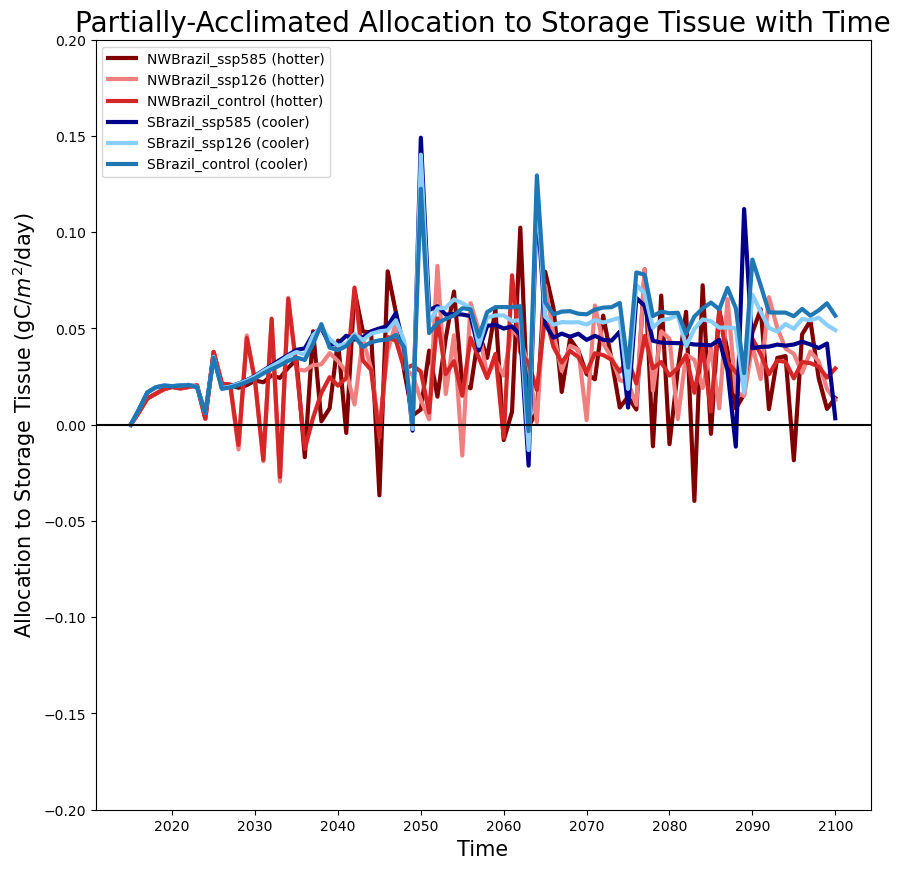

In [14]:
#plotting allocation to storage tissues with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, pnwbrazil_ssp585.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, pnwbrazil_ssp126.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, pnwbrazil_none.FATES_STORE_ALLOC*86400*1000, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, psbrazil_ssp585.FATES_STORE_ALLOC*86400*1000, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, psbrazil_ssp126.FATES_STORE_ALLOC*86400*1000, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, psbrazil_none.FATES_STORE_ALLOC*86400*1000, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.axhline(color='black')
plt.ylim(-0.2,0.2)
ax.set_ylabel("Allocation to Storage Tissue (gC/$m^2$/day)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Allocation to Storage Tissue with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PStorageAllocation_Time_line.png", dpi=300, bbox_inches='tight')

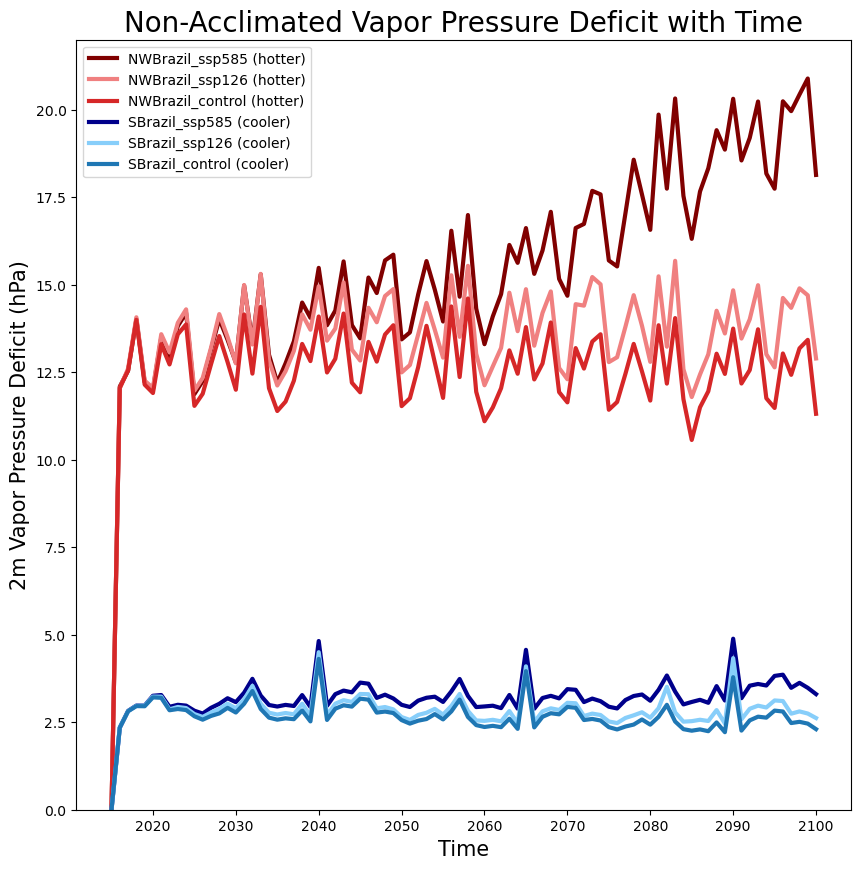

In [5]:
#plotting VPD with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.VPD2M/100, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.VPD2M/100, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.VPD2M/100, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.VPD2M/100, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.VPD2M/100, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.VPD2M/100, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0, 22)
ax.set_ylabel("2m Vapor Pressure Deficit (hPa)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Vapor Pressure Deficit with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_VPD_Time_line.png", dpi=300, bbox_inches='tight')

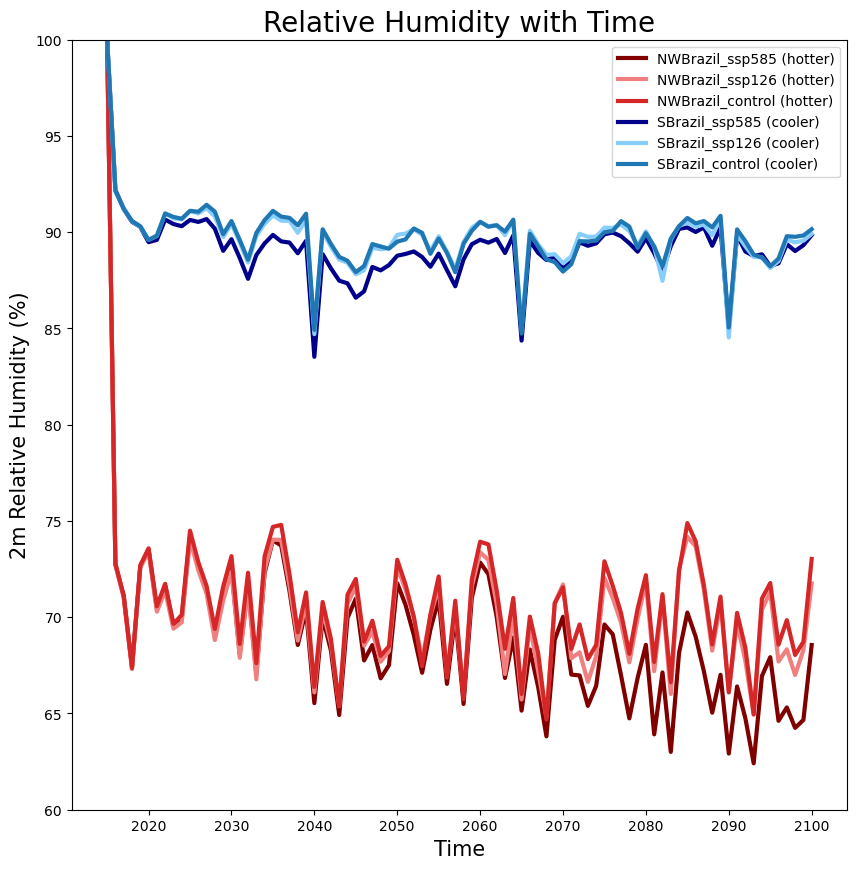

In [491]:
#plotting RH with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, nwbrazil_ssp585.RH2M, label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, nwbrazil_ssp126.RH2M, label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, nwbrazil_none.RH2M, label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, sbrazil_ssp585.RH2M, label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, sbrazil_ssp126.RH2M, label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, sbrazil_none.RH2M, label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(60, 100)
ax.set_ylabel("2m Relative Humidity (%)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Relative Humidity with Time",size=20)
ax.legend(loc='upper right')
plt.show()
fig.savefig("EL_RH_Time_line.png", dpi=300, bbox_inches='tight')

In [627]:
#transpiration per tree, could do added over all time, avged over all time, or in 2100

qvegt_sum1 = anwbrazil_ssp585.QVEGT.sum(dim='time')*86400 # mm/day
nplant_sum1 = anwbrazil_ssp585.FATES_NPLANT_PF.sum(dim=['fates_levpft','time']) # number of trees per m2

sum1 = qvegt_sum1/nplant_sum1

print(sum1)

qvegt_sum2 = asbrazil_none.QVEGT.sum(dim='time')*86400 # mm/day
nplant_sum2 = asbrazil_none.FATES_NPLANT_PF.sum(dim=['fates_levpft','time']) # number of trees per m2


sum2 = qvegt_sum2/nplant_sum2

print(sum2)

<xarray.DataArray (lndgrid: 1)>
array([63.93116385])
Dimensions without coordinates: lndgrid
<xarray.DataArray (lndgrid: 1)>
array([27.47840994])
Dimensions without coordinates: lndgrid


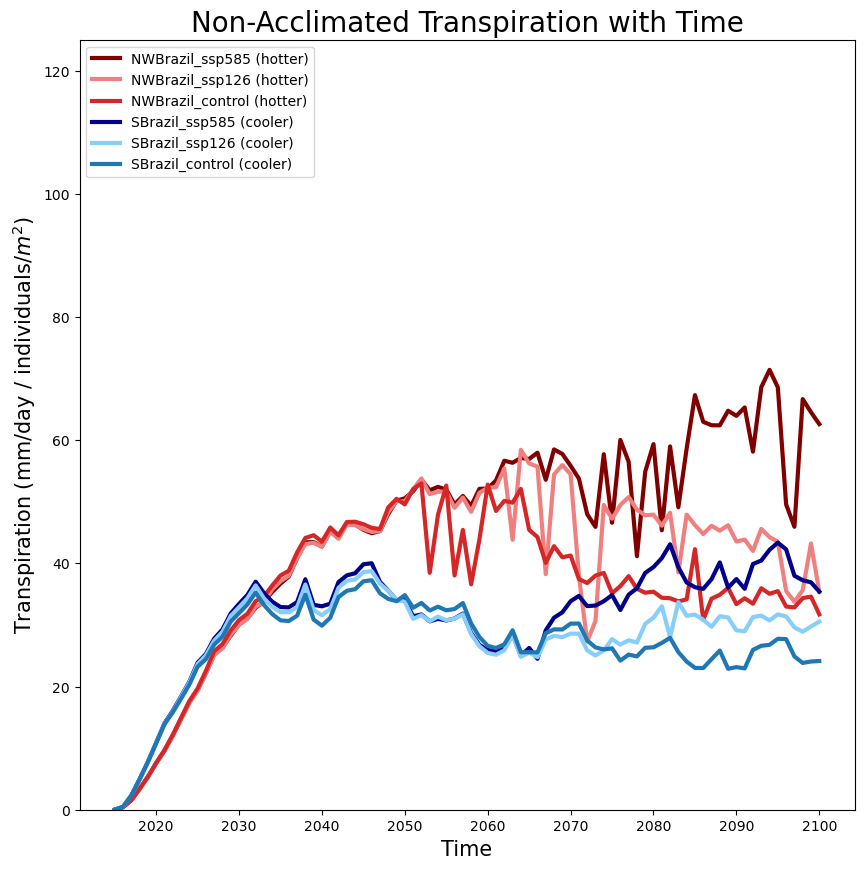

In [653]:
#plotting canopy transpiration with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, (nwbrazil_ssp585.QVEGT*86400)/(nwbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, (nwbrazil_ssp126.QVEGT*86400)/(nwbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, (nwbrazil_none.QVEGT*86400)/(nwbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, (sbrazil_ssp585.QVEGT*86400)/(sbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, (sbrazil_ssp126.QVEGT*86400)/(sbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, (sbrazil_none.QVEGT*86400)/(sbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,125)
ax.set_ylabel("Transpiration (mm/day / individuals/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Transpiration with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Transpiration_Tree_Time_line.png", dpi=300, bbox_inches='tight')

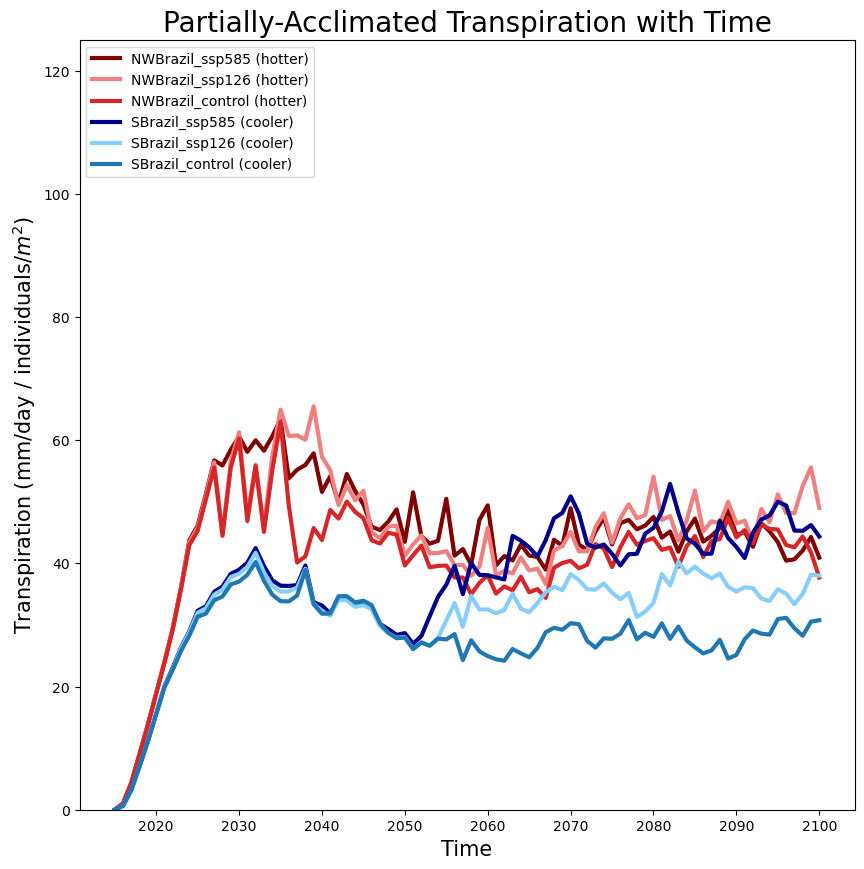

In [15]:
#plotting canopy transpiration with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, (pnwbrazil_ssp585.QVEGT*86400)/(pnwbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, (pnwbrazil_ssp126.QVEGT*86400)/(pnwbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, (pnwbrazil_none.QVEGT*86400)/(pnwbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, (psbrazil_ssp585.QVEGT*86400)/(psbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, (psbrazil_ssp126.QVEGT*86400)/(psbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, (psbrazil_none.QVEGT*86400)/(psbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,125)
ax.set_ylabel("Transpiration (mm/day / individuals/$m^2$)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Transpiration with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PTranspiration_Tree_Time_line.png", dpi=300, bbox_inches='tight')

In [26]:
# PFT-level flux of biomass carbon from live to dead pool from carbon starvation mortality (kg/m2/yr)
# divide by FATES_NPLANT_PF (#/m2) to get kg/#/yr (kg per number of individuals per yr)
cstarv_sum1 = psbrazil_ssp585.FATES_MORTALITY_CSTARV_CFLUX_PF.sum(dim='time')*86400*365
cstarv_sum2 = psbrazil_none.FATES_MORTALITY_CSTARV_CFLUX_PF.sum(dim='time')*86400*365

nplant_sum1 = psbrazil_ssp585.FATES_NPLANT_PF.sum(dim='time')
nplant_sum2 = psbrazil_none.FATES_NPLANT_PF.sum(dim='time')

sum1 = cstarv_sum1/nplant_sum1
sum2 = cstarv_sum2/nplant_sum2

print(sum1)
print(sum2)

<xarray.DataArray (fates_levpft: 9, lndgrid: 1)>
array([[9.07728274e-10],
       [0.00000000e+00],
       [1.27848283e-07],
       [7.98037038e-07],
       [0.00000000e+00],
       [8.23596860e-07],
       [2.93284319e-07],
       [1.62865313e-08],
       [7.04937302e-09]])
Coordinates:
  * fates_levpft  (fates_levpft) int32 1 2 3 4 5 6 7 8 9
Dimensions without coordinates: lndgrid
<xarray.DataArray (fates_levpft: 9, lndgrid: 1)>
array([[2.80515420e-06],
       [0.00000000e+00],
       [7.24533387e-07],
       [6.80146176e-07],
       [0.00000000e+00],
       [2.25988268e-06],
       [6.95732874e-07],
       [2.73555764e-09],
       [0.00000000e+00]])
Coordinates:
  * fates_levpft  (fates_levpft) int32 1 2 3 4 5 6 7 8 9
Dimensions without coordinates: lndgrid


In [541]:
nwbrazil_ssp585.FATES_NPLANT_SZ

<xarray.DataArray 'FATES_NPLANT_SZ' (time: 86, fates_levscls: 13, lndgrid: 1)>
[1118 values with dtype=float32]
Coordinates:
  * fates_levscls  (fates_levscls) float32 0.0 5.0 10.0 15.0 ... 80.0 90.0 100.0
  * time           (time) object 2015-01-01 00:00:00 ... 2100-01-01 00:00:00
Dimensions without coordinates: lndgrid
Attributes:
    long_name:      number of plants per m2 by size class
    units:          m-2
    cell_methods:   time: mean
    landunit_mask:  unknown

In [530]:
nwbrazil_ssp585.FATES_MORTALITY_CSTARV_CFLUX_PF

<xarray.DataArray 'FATES_MORTALITY_CSTARV_CFLUX_PF' (time: 86, fates_levpft: 9,
                                                     lndgrid: 1)>
array([[[0.000000e+00],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       [[0.000000e+00],
        [0.000000e+00],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       ...,

       [[9.627258e-12],
        [7.463300e-12],
        ...,
        [0.000000e+00],
        [0.000000e+00]],

       [[1.906412e-12],
        [4.449354e-12],
        ...,
        [0.000000e+00],
        [0.000000e+00]]], dtype=float32)
Coordinates:
  * fates_levpft  (fates_levpft) int32 1 2 3 4 5 6 7 8 9
  * time          (time) object 2015-01-01 00:00:00 ... 2100-01-01 00:00:00
Dimensions without coordinates: lndgrid
Attributes:
    long_name:      PFT-level flux of biomass carbon from live to dead pool f...
    units:          kg m-2 s-1
    cell_methods:   time: mean
    landunit_mask:  unknown

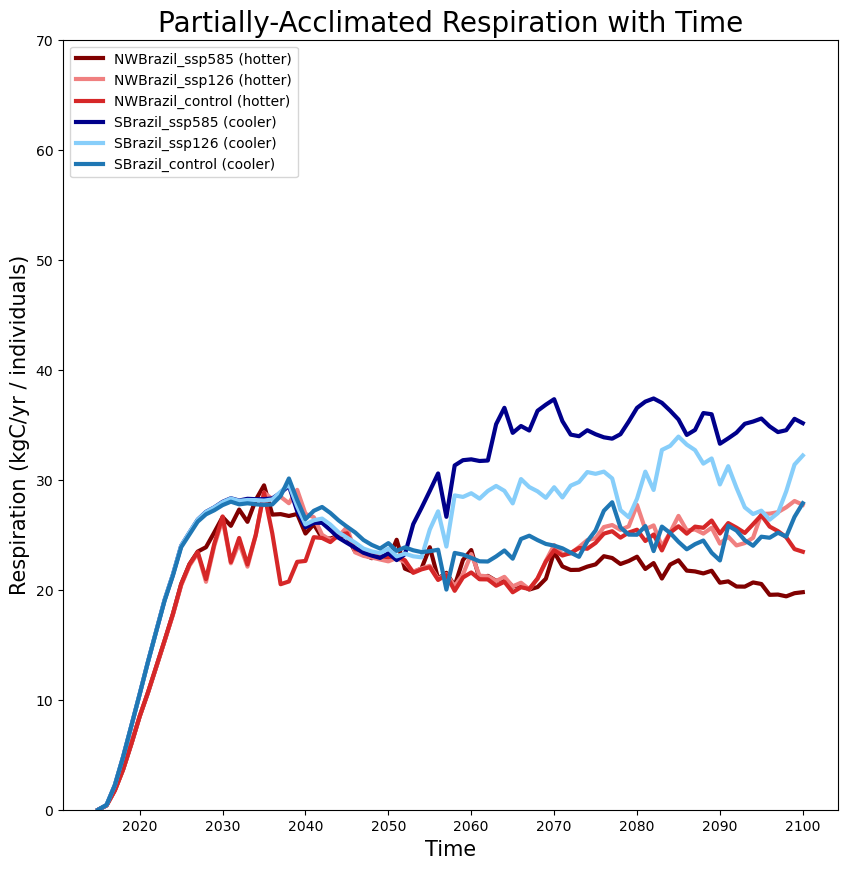

In [16]:
#plotting respiration with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, (pnwbrazil_ssp585.FATES_AUTORESP*86400*365)/(pnwbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, (pnwbrazil_ssp126.FATES_AUTORESP*86400*365)/(pnwbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, (pnwbrazil_none.FATES_AUTORESP*86400*365)/(pnwbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, (psbrazil_ssp585.FATES_AUTORESP*86400*365)/(psbrazil_ssp585.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, (psbrazil_ssp126.FATES_AUTORESP*86400*365)/(psbrazil_ssp126.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, (psbrazil_none.FATES_AUTORESP*86400*365)/(psbrazil_none.FATES_NPLANT_PF.sum(dim='fates_levpft')), label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,70)
ax.set_ylabel("Respiration (kgC/yr / individuals)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Partially-Acclimated Respiration with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_PRespiration_Tree_Time_line.png", dpi=300, bbox_inches='tight')

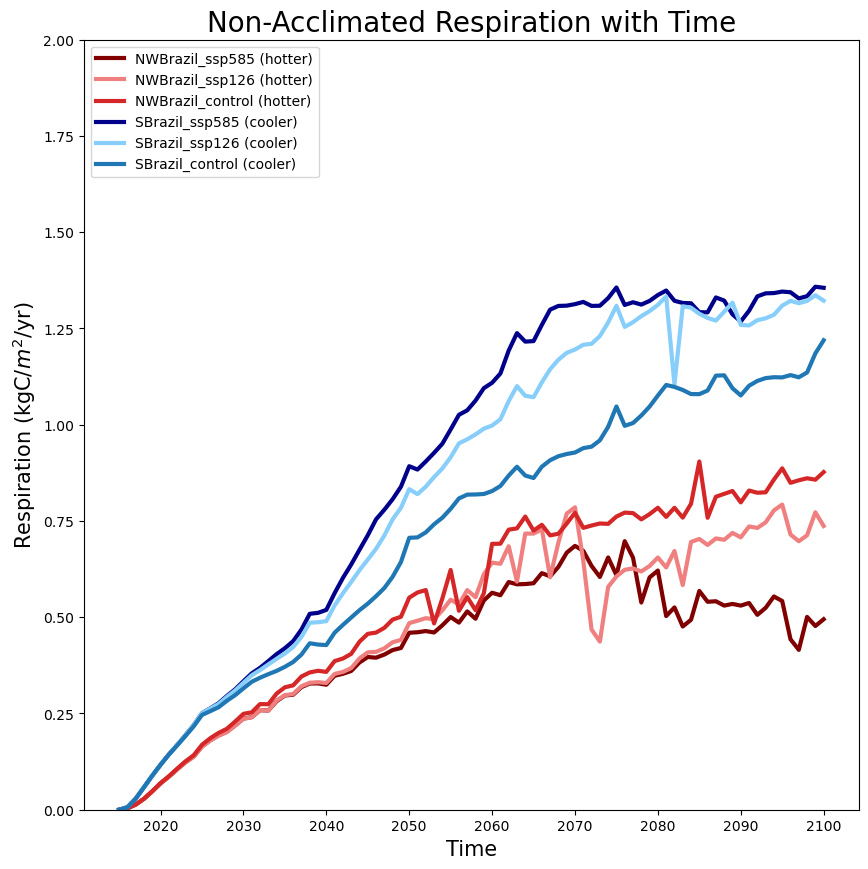

In [671]:
#plotting respiration with time
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
plt.plot(nwbrazil585time, (nwbrazil_ssp585.FATES_AUTORESP*86400*365), label="NWBrazil_ssp585 (hotter)", color='maroon', linewidth=3)
plt.plot(nwbrazil126time, (nwbrazil_ssp126.FATES_AUTORESP*86400*365), label="NWBrazil_ssp126 (hotter)", color='lightcoral', linewidth=3)
plt.plot(nwbrazilnonetime, (nwbrazil_none.FATES_AUTORESP*86400*365), label="NWBrazil_control (hotter)", color='tab:red', linewidth=3)
plt.plot(sbrazil585time, (sbrazil_ssp585.FATES_AUTORESP*86400*365), label="SBrazil_ssp585 (cooler)", color='darkblue', linewidth=3)
plt.plot(sbrazil126time, (sbrazil_ssp126.FATES_AUTORESP*86400*365), label="SBrazil_ssp126 (cooler)", color='lightskyblue', linewidth=3)
plt.plot(sbrazilnonetime, (sbrazil_none.FATES_AUTORESP*86400*365), label="SBrazil_control (cooler)", color='tab:blue', linewidth=3)
plt.ylim(0,2)
ax.set_ylabel("Respiration (kgC/$m^2$/yr)", size=15)
ax.set_xlabel("Time", size=15)
ax.set_title("Non-Acclimated Respiration with Time",size=20)
ax.legend(loc='upper left')
plt.show()
fig.savefig("EL_Respiration_Time_line.png", dpi=300, bbox_inches='tight')